In [ ]:
 # %%  IMPORTS

import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib import cm
import MRzeroCore as mr0
import pulseqzero
import sequence_script as seqs
import reconstruction 
import optimization as opt
pp = pulseqzero.pp_impl

def make_obj_simulation(sz,fov,slice_thickness,build=True):
    if 1:
        # (i) load a phantom object from file
        # obj_p = mr0.VoxelGridPhantom.load_mat('../data/phantom2D.mat')
        obj_p = mr0.VoxelGridPhantom.load_mat('numerical_brain_cropped.mat')
        obj_p = obj_p.interpolate(sz[0], sz[1], 1)

    # Manipulate loaded data
        obj_p.T2dash[:] = 30e-3
        obj_p.D *= 0 
        if 0:
            obj_p.B0 *= 2    # alter the B0 inhomogeneity
            #obj_p.B1[:] = 1
            obj_p.B1 *= 3  # alter the B1 inhomogeneity
        else:#no inhomogeneity
            obj_p.B0 *= 0   
            obj_p.B1[:] = 1  
        # Store PD for comparison
        PD = obj_p.PD.squeeze()
        B0 = obj_p.B0.squeeze()
    #obj_p.plot()
    obj_p.size=torch.tensor([fov, fov, slice_thickness]) 
    if build:
        # Convert Phantom into simulation data
        obj_p = obj_p.build()
    return obj_p

c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\pulseqzero\__init__.py:29: UserWarning: Specified RF delay 0.00 us is less than the dead time 100 us. Delay was increased to the dead time.
  return func(*new_args, **new_kwargs)
c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\pulseqzero\__init__.py:29: UserWarning: Specified ADC delay 0.00 us is less than the dead time 20 us. Delay was increased to the dead time.
  return func(*new_args, **new_kwargs)


echo time set to minTE [ms] 7.4
Timing check passed successfully
Calculating repetition 44 / 44 - done
plotting with pulseq 1.4


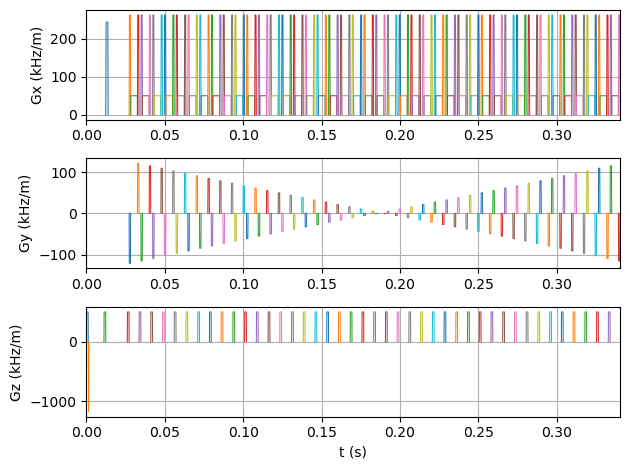

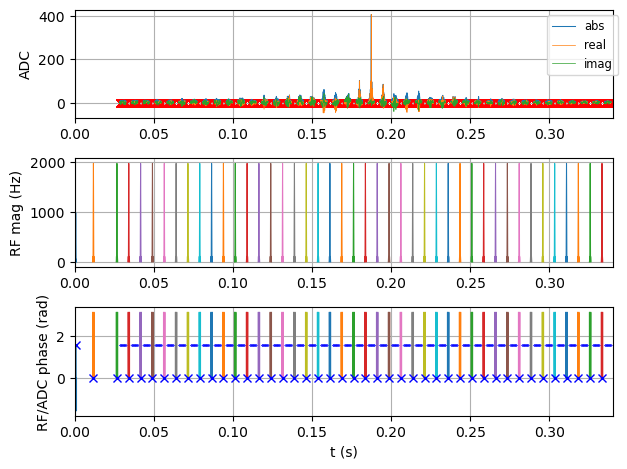

c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  x = np.array(x, subok=True, copy=copy)


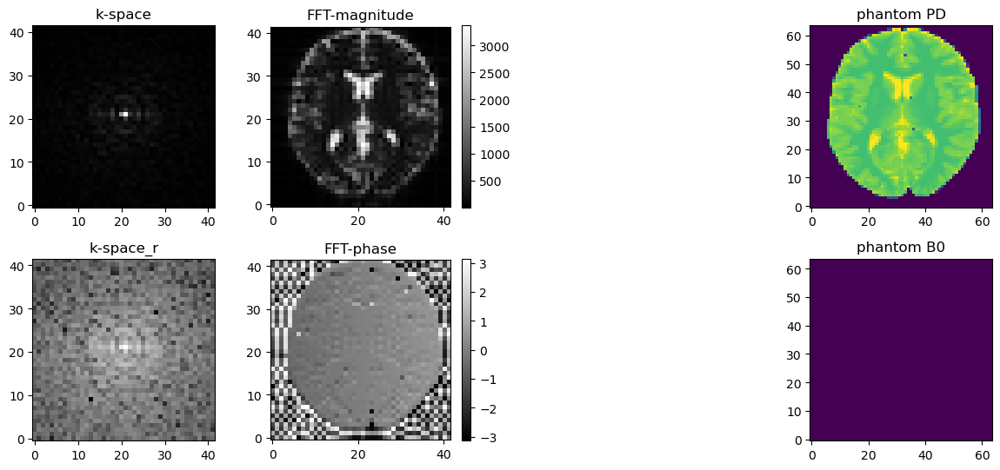

In [ ]:
# %%  SIMULATE  the external.seq file and add acquired signal to ADC plot + Recon

if __name__=="__main__":
    base_resolution=42
    Ex_FA=90    # excitation flip angle
    Ref_FA_target= torch.full((base_resolution,), 180)  # refocusing flip angle
    fov=200e-3
    slice_thickness=8e-3
    # base_resolution=42, # This line was causing the error
    TE_ms=5
    TI_s=0
    r_spoil=2
    PE_grad_on=True
    RO_grad_on=True
    seq, encoding = seqs.tse_sequence(pp=pp,fov=fov, slice_thickness=slice_thickness, base_resolution=base_resolution,
                    TE_ms=TE_ms, TI_s=TI_s, Ex_FA=Ex_FA, Ref_FA=Ref_FA_target, r_spoil=r_spoil,
                    PE_grad_on=PE_grad_on, RO_grad_on=RO_grad_on)

    seq.set_definition('FOV', [fov, fov, slice_thickness])
    seq.set_definition('Name', 'gre')
    seq.write('external.seq')
    sz = [64, 64]  # image size
    obj_p = make_obj_simulation(sz=sz,fov=fov,slice_thickness=slice_thickness)
    
    # Read in the sequence 
    seq0 = mr0.Sequence.import_file("external.seq")
    
    #seq0.plot_kspace_trajectory()
    # Simulate the sequence
    graph = mr0.compute_graph(seq0, obj_p, 200, 1e-3)
    signal = mr0.execute_graph(graph, seq0, obj_p)

    # PLOT sequence with signal in the ADC subplot
    mr0.util.pulseq_plot(seq, signal=signal.numpy())

    #  RECONSTRUCT the simulated data
    # additional noise as simulation is perfect
    #signal += 1e-4 * np.random.randn(signal.shape[0], 2).view(np.complex128)
    reconstruction.reconstruct_signal(Nread=base_resolution,Nphase=base_resolution,signal=signal,encoding=encoding,obj_p=obj_p)

c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\numpy\_core\fromnumeric.py:48: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return conv.wrap(result, to_scalar=False)


echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully


c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  x = np.array(x, subok=True, copy=copy)


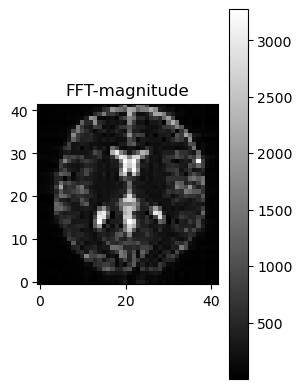

c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\numpy\_core\fromnumeric.py:48: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return conv.wrap(result, to_scalar=False)


3273.446044921875
echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
1 / 5: loss=0.15954910218715668, rSAR=1.0, Ref_FA=[180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.]


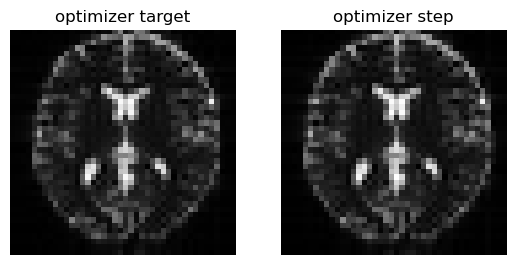

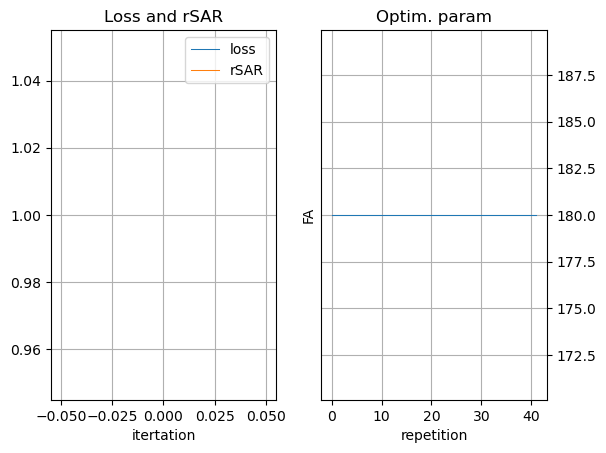

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
2 / 5: loss=0.1500757932662964, rSAR=0.9452298283576965, Ref_FA=[175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127]


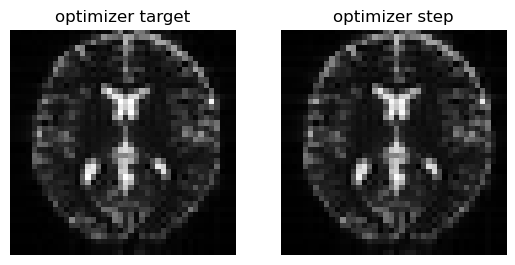

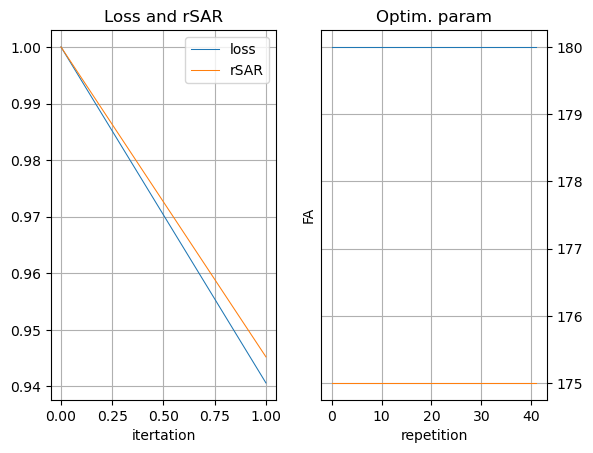

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
3 / 5: loss=0.15353523194789886, rSAR=0.8921929001808167, Ref_FA=[170.06067 170.00563 170.00192 170.00186 170.00421 170.00162 170.00267
 170.00255 170.00354 170.00389 170.00453 170.00497 170.00537 170.00508
 170.00505 170.00508 170.00552 170.00597 170.006   170.00627 170.00667
 170.01396 170.01505 170.01668 170.01865 170.02051 170.02167 170.02466
 170.0275  170.02827 170.02911 170.02815 170.0309  170.03314 170.03793
 170.04263 170.04796 170.0507  170.05597 170.05258 170.06143 170.06429]


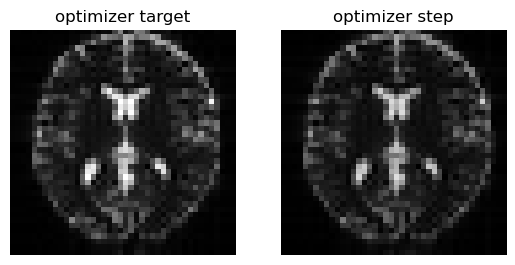

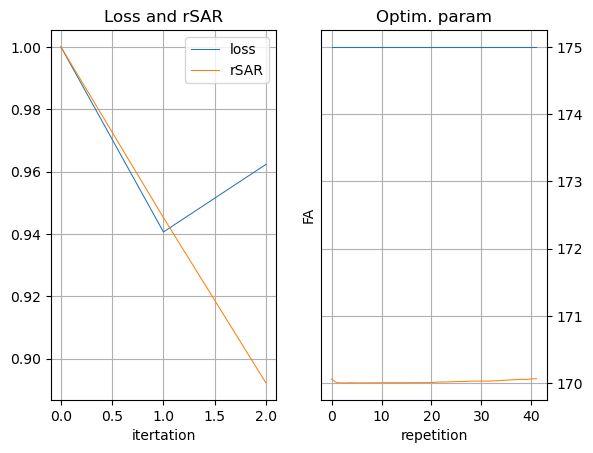

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
4 / 5: loss=0.1446572095155716, rSAR=0.8808470964431763, Ref_FA=[171.90884 167.10384 166.14162 165.82335 165.62738 165.29636 165.23672
 165.16338 165.12285 165.09804 165.07986 165.07298 165.05663 165.04646
 165.03842 165.03331 165.03021 165.02716 165.0241  165.02269 165.02168
 172.19722 172.19969 172.20354 172.20859 172.21329 172.21323 172.2194
 172.2238  172.22086 172.2154  172.20248 172.19734 172.19948 172.202
 172.20113 172.19536 172.17711 172.17096 172.0909  172.07721 172.03783]


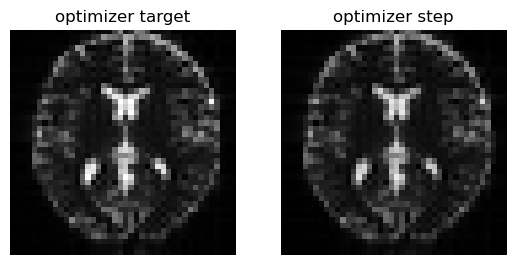

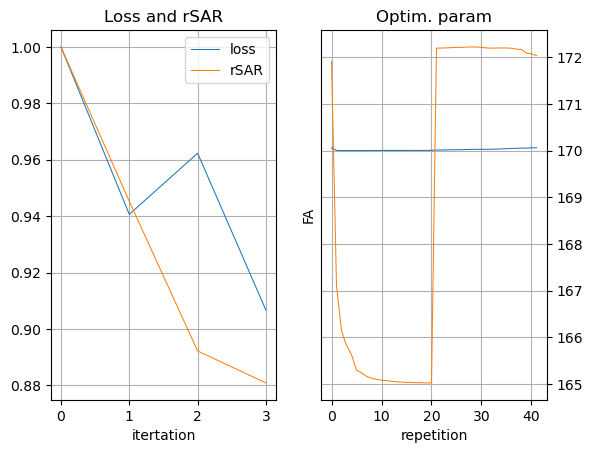

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
5 / 5: loss=0.14105884730815887, rSAR=0.8744245767593384, Ref_FA=[174.32867 165.39566 163.15207 162.34485 161.85509 160.9009  160.73087
 160.51138 160.38747 160.3103  160.25038 160.22775 160.17387 160.14117
 160.11397 160.09647 160.08443 160.07213 160.061   160.05524 160.05032
 174.91086 174.91498 174.91884 174.9253  174.93127 174.9282  174.93549
 174.93974 174.93192 174.91873 174.89299 174.87779 174.87909 174.87823
 174.8717  174.85545 174.81776 174.80232 174.65584 174.62556 174.55356]


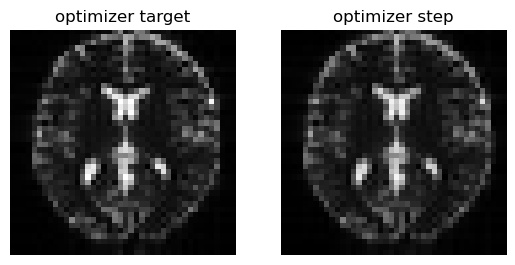

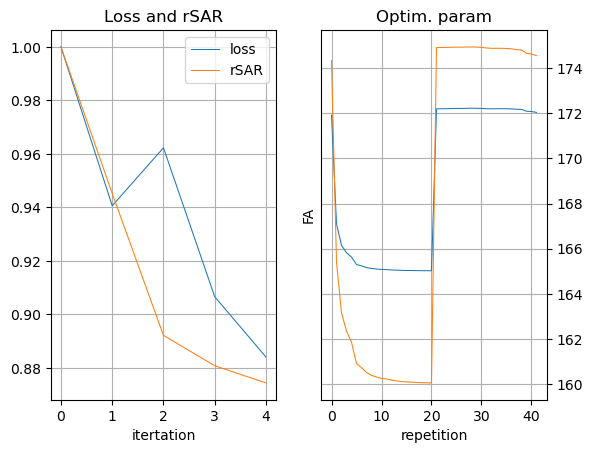

TypeError: visualize_results() got an unexpected keyword argument 'Ex_FA'

In [ ]:
# %% OPTIMIZE the refocusing flip angles

obj_p = make_obj_simulation(sz=sz,fov=fov,slice_thickness=slice_thickness,build=False)
target,Ref_FA_target = opt.generate_target_space(pp,sz)

opt.perform_optimazation(obj_p, target, pp, Ref_FA_target)

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully


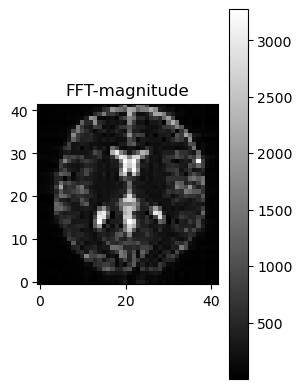

3273.446044921875
echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
1 / 5: loss=0.15954910218715668, rSAR=1.0, Ref_FA=[180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.]


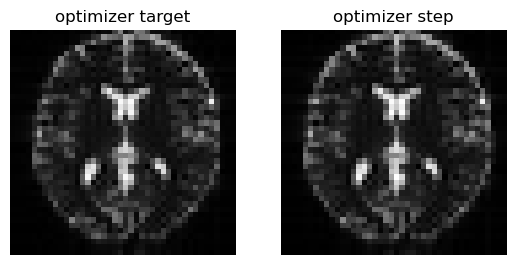

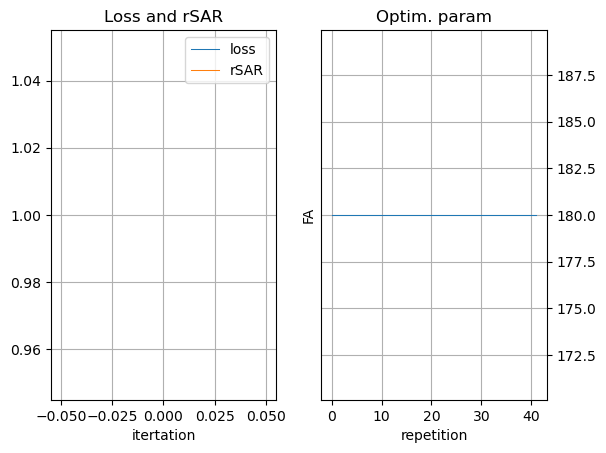

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
2 / 5: loss=0.1500757932662964, rSAR=0.9452298283576965, Ref_FA=[175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127]


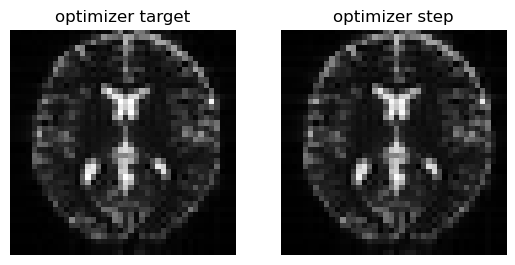

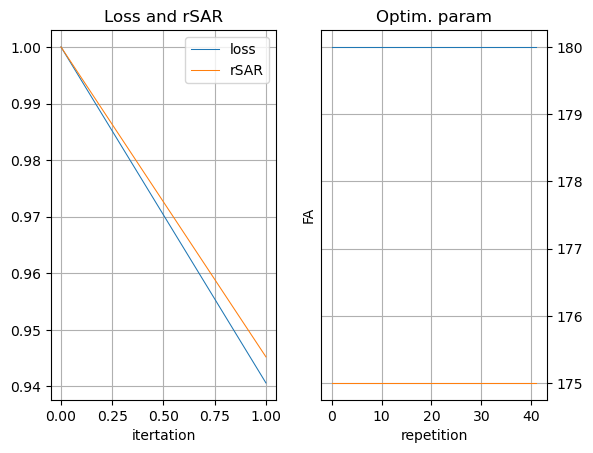

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
3 / 5: loss=0.15353523194789886, rSAR=0.8921929001808167, Ref_FA=[170.06067 170.00563 170.00192 170.00186 170.00421 170.00162 170.00267
 170.00255 170.00354 170.00389 170.00453 170.00497 170.00537 170.00508
 170.00505 170.00508 170.00552 170.00597 170.006   170.00627 170.00667
 170.01396 170.01505 170.01668 170.01865 170.02051 170.02167 170.02466
 170.0275  170.02827 170.02911 170.02815 170.0309  170.03314 170.03793
 170.04263 170.04796 170.0507  170.05597 170.05258 170.06143 170.06429]


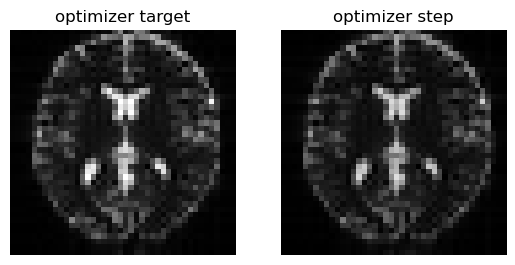

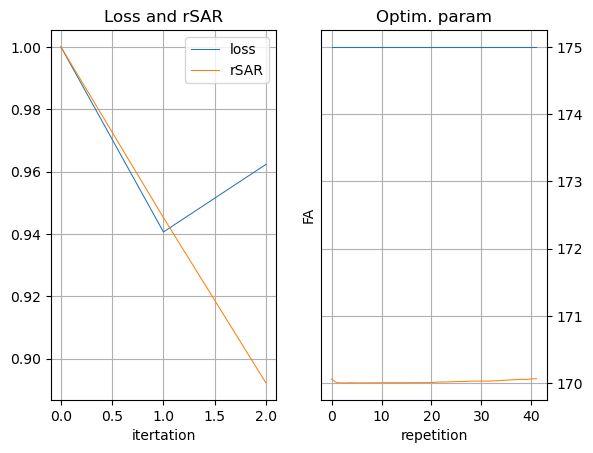

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
4 / 5: loss=0.1446572095155716, rSAR=0.8808470964431763, Ref_FA=[171.90884 167.10384 166.14162 165.82335 165.62738 165.29636 165.23672
 165.16338 165.12285 165.09804 165.07986 165.07298 165.05663 165.04646
 165.03842 165.03331 165.03021 165.02716 165.0241  165.02269 165.02168
 172.19722 172.19969 172.20354 172.20859 172.21329 172.21323 172.2194
 172.2238  172.22086 172.2154  172.20248 172.19734 172.19948 172.202
 172.20113 172.19536 172.17711 172.17096 172.0909  172.07721 172.03783]


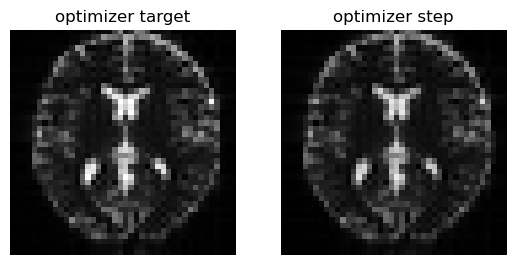

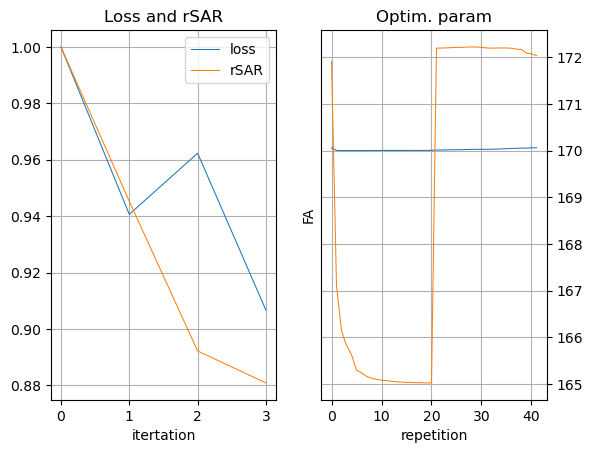

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
5 / 5: loss=0.14105884730815887, rSAR=0.8744245767593384, Ref_FA=[174.32867 165.39566 163.15207 162.34485 161.85509 160.9009  160.73087
 160.51138 160.38747 160.3103  160.25038 160.22775 160.17387 160.14117
 160.11397 160.09647 160.08443 160.07213 160.061   160.05524 160.05032
 174.91086 174.91498 174.91884 174.9253  174.93127 174.9282  174.93549
 174.93974 174.93192 174.91873 174.89299 174.87779 174.87909 174.87823
 174.8717  174.85545 174.81776 174.80232 174.65584 174.62556 174.55356]


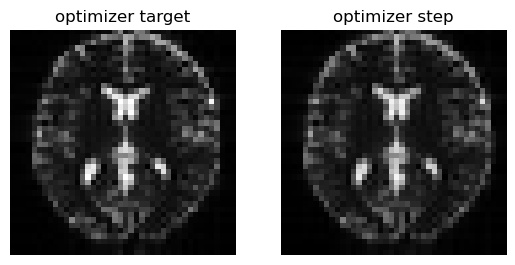

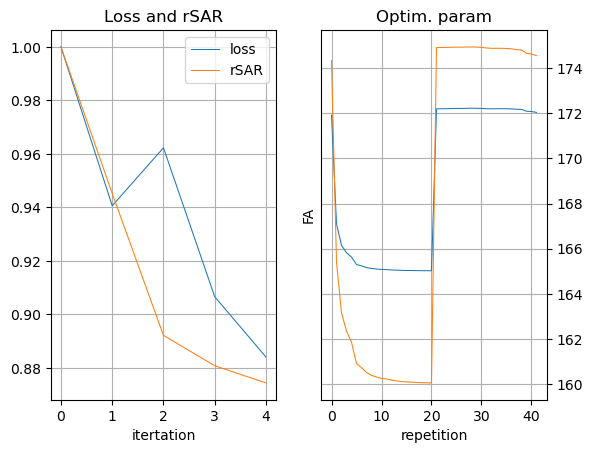

TypeError: visualize_results() got an unexpected keyword argument 'Ex_FA'

In [ ]:
# %% OPTIMIZE the refocusing flip angles

obj_p = make_obj_simulation(sz=sz,fov=fov,slice_thickness=slice_thickness,build=False)
target,Ref_FA_target = opt.generate_target_space(pp,sz)

opt.perform_optimazation(obj_p, target, pp, Ref_FA_target)

In [ ]:
 # %%  IMPORTS

import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib import cm
import MRzeroCore as mr0
import pulseqzero
import sequence_script as seqs
import reconstruction 
import optimization as opt
pp = pulseqzero.pp_impl

def make_obj_simulation(sz,fov,slice_thickness,build=True):
    if 1:
        # (i) load a phantom object from file
        # obj_p = mr0.VoxelGridPhantom.load_mat('../data/phantom2D.mat')
        obj_p = mr0.VoxelGridPhantom.load_mat('numerical_brain_cropped.mat')
        obj_p = obj_p.interpolate(sz[0], sz[1], 1)

    # Manipulate loaded data
        obj_p.T2dash[:] = 30e-3
        obj_p.D *= 0 
        if 0:
            obj_p.B0 *= 2    # alter the B0 inhomogeneity
            #obj_p.B1[:] = 1
            obj_p.B1 *= 3  # alter the B1 inhomogeneity
        else:#no inhomogeneity
            obj_p.B0 *= 0   
            obj_p.B1[:] = 1  
        # Store PD for comparison
        PD = obj_p.PD.squeeze()
        B0 = obj_p.B0.squeeze()
    #obj_p.plot()
    obj_p.size=torch.tensor([fov, fov, slice_thickness]) 
    if build:
        # Convert Phantom into simulation data
        obj_p = obj_p.build()
    return obj_p

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully


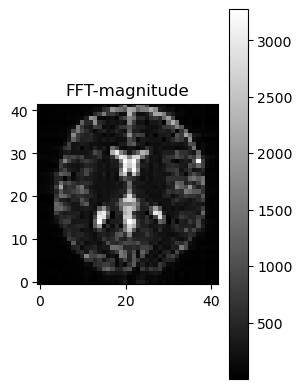

3273.446044921875
echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
1 / 5: loss=0.15954910218715668, rSAR=1.0, Ref_FA=[180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.]


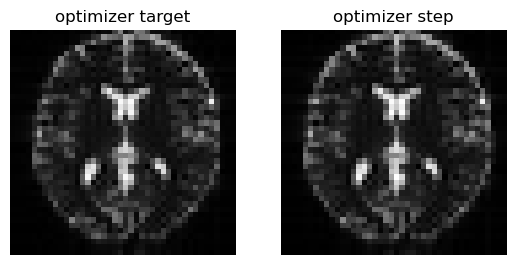

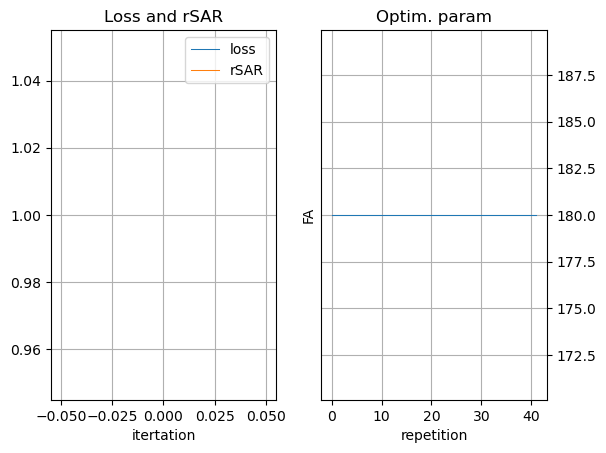

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
2 / 5: loss=0.1500757932662964, rSAR=0.9452298283576965, Ref_FA=[175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127]


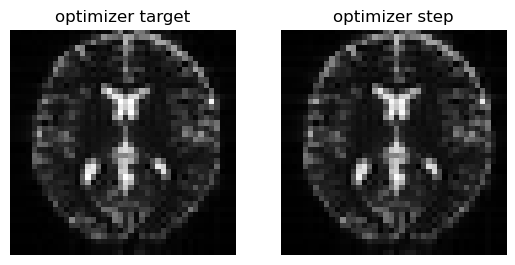

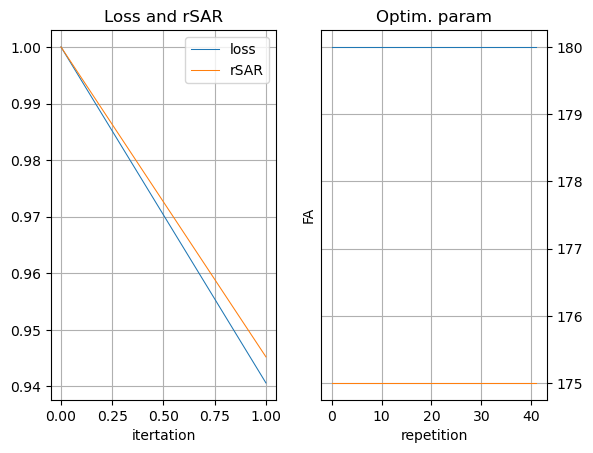

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
3 / 5: loss=0.15353523194789886, rSAR=0.8921929001808167, Ref_FA=[170.06067 170.00563 170.00192 170.00186 170.00421 170.00162 170.00267
 170.00255 170.00354 170.00389 170.00453 170.00497 170.00537 170.00508
 170.00505 170.00508 170.00552 170.00597 170.006   170.00627 170.00667
 170.01396 170.01505 170.01668 170.01865 170.02051 170.02167 170.02466
 170.0275  170.02827 170.02911 170.02815 170.0309  170.03314 170.03793
 170.04263 170.04796 170.0507  170.05597 170.05258 170.06143 170.06429]


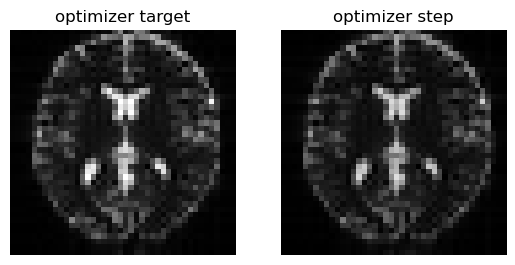

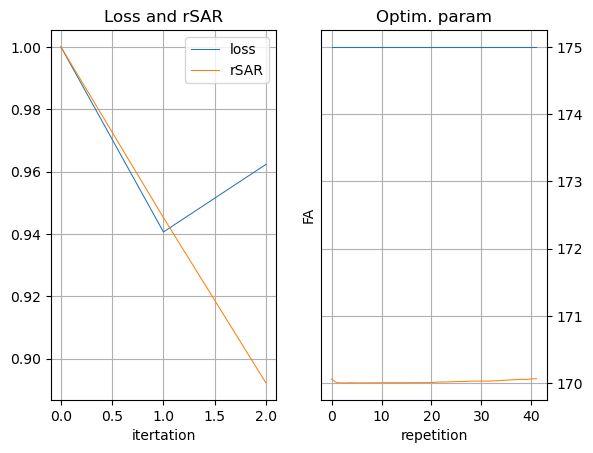

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
4 / 5: loss=0.1446572095155716, rSAR=0.8808470964431763, Ref_FA=[171.90884 167.10384 166.14162 165.82335 165.62738 165.29636 165.23672
 165.16338 165.12285 165.09804 165.07986 165.07298 165.05663 165.04646
 165.03842 165.03331 165.03021 165.02716 165.0241  165.02269 165.02168
 172.19722 172.19969 172.20354 172.20859 172.21329 172.21323 172.2194
 172.2238  172.22086 172.2154  172.20248 172.19734 172.19948 172.202
 172.20113 172.19536 172.17711 172.17096 172.0909  172.07721 172.03783]


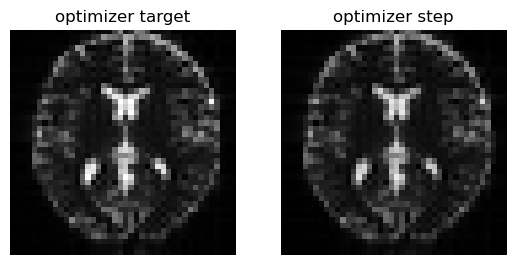

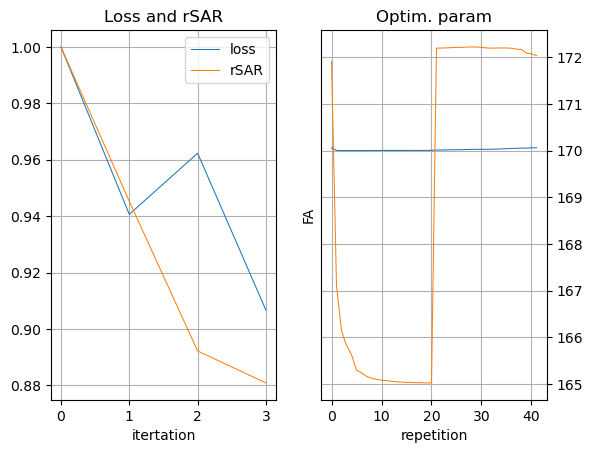

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
5 / 5: loss=0.14105884730815887, rSAR=0.8744245767593384, Ref_FA=[174.32867 165.39566 163.15207 162.34485 161.85509 160.9009  160.73087
 160.51138 160.38747 160.3103  160.25038 160.22775 160.17387 160.14117
 160.11397 160.09647 160.08443 160.07213 160.061   160.05524 160.05032
 174.91086 174.91498 174.91884 174.9253  174.93127 174.9282  174.93549
 174.93974 174.93192 174.91873 174.89299 174.87779 174.87909 174.87823
 174.8717  174.85545 174.81776 174.80232 174.65584 174.62556 174.55356]


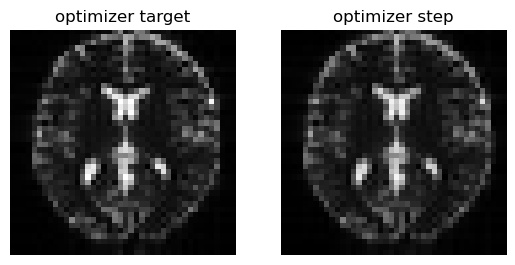

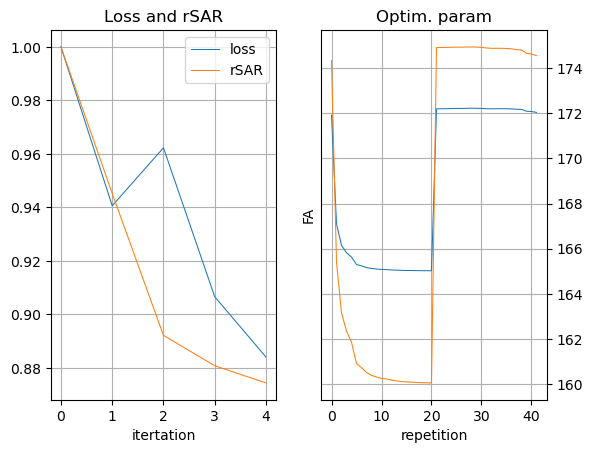

TypeError: visualize_results() got an unexpected keyword argument 'Ex_FA'

In [ ]:
# %% OPTIMIZE the refocusing flip angles

obj_p = make_obj_simulation(sz=sz,fov=fov,slice_thickness=slice_thickness,build=False)
target,Ref_FA_target = opt.generate_target_space(pp,sz)

opt.perform_optimazation(obj_p, target, pp, Ref_FA_target)

In [ ]:
 # %%  IMPORTS

import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib import cm
import MRzeroCore as mr0
import pulseqzero
import sequence_script as seqs
import reconstruction 
import optimization as opt
pp = pulseqzero.pp_impl

def make_obj_simulation(sz,fov,slice_thickness,build=True):
    if 1:
        # (i) load a phantom object from file
        # obj_p = mr0.VoxelGridPhantom.load_mat('../data/phantom2D.mat')
        obj_p = mr0.VoxelGridPhantom.load_mat('numerical_brain_cropped.mat')
        obj_p = obj_p.interpolate(sz[0], sz[1], 1)

    # Manipulate loaded data
        obj_p.T2dash[:] = 30e-3
        obj_p.D *= 0 
        if 0:
            obj_p.B0 *= 2    # alter the B0 inhomogeneity
            #obj_p.B1[:] = 1
            obj_p.B1 *= 3  # alter the B1 inhomogeneity
        else:#no inhomogeneity
            obj_p.B0 *= 0   
            obj_p.B1[:] = 1  
        # Store PD for comparison
        PD = obj_p.PD.squeeze()
        B0 = obj_p.B0.squeeze()
    #obj_p.plot()
    obj_p.size=torch.tensor([fov, fov, slice_thickness]) 
    if build:
        # Convert Phantom into simulation data
        obj_p = obj_p.build()
    return obj_p

c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\pulseqzero\__init__.py:29: UserWarning: Specified RF delay 0.00 us is less than the dead time 100 us. Delay was increased to the dead time.
  return func(*new_args, **new_kwargs)
c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\pulseqzero\__init__.py:29: UserWarning: Specified ADC delay 0.00 us is less than the dead time 20 us. Delay was increased to the dead time.
  return func(*new_args, **new_kwargs)


echo time set to minTE [ms] 7.4
Timing check passed successfully
Calculating repetition 44 / 44 - done
plotting with pulseq 1.4


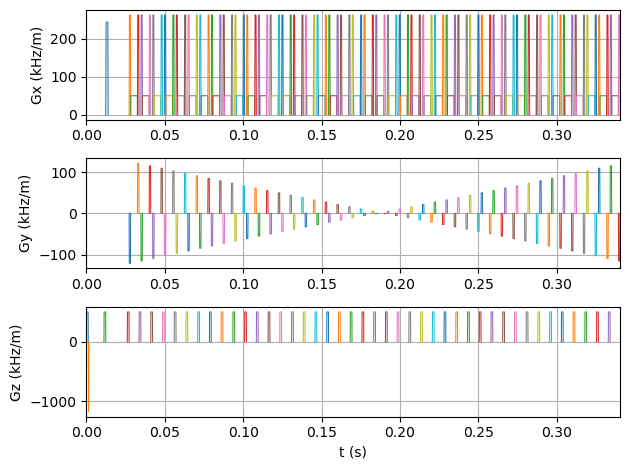

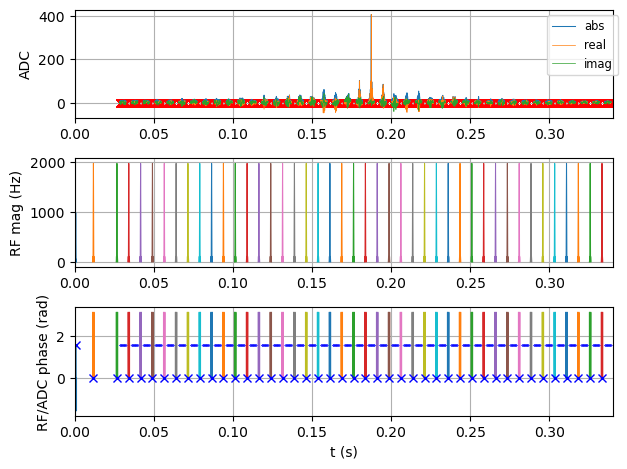

c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  x = np.array(x, subok=True, copy=copy)


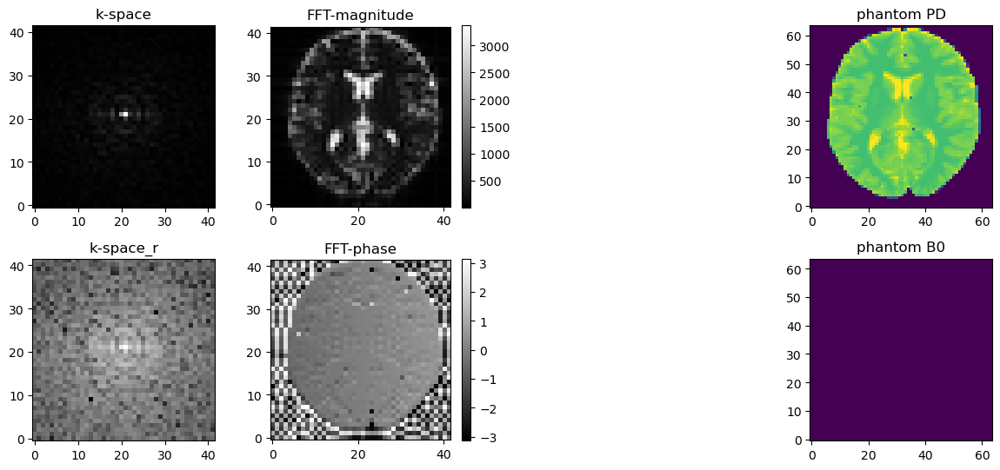

In [ ]:
# %%  SIMULATE  the external.seq file and add acquired signal to ADC plot + Recon

if __name__=="__main__":
    base_resolution=42
    Ex_FA=90    # excitation flip angle
    Ref_FA_target= torch.full((base_resolution,), 180)  # refocusing flip angle
    fov=200e-3
    slice_thickness=8e-3
    # base_resolution=42, # This line was causing the error
    TE_ms=5
    TI_s=0
    r_spoil=2
    PE_grad_on=True
    RO_grad_on=True
    seq, encoding = seqs.tse_sequence(pp=pp,fov=fov, slice_thickness=slice_thickness, base_resolution=base_resolution,
                    TE_ms=TE_ms, TI_s=TI_s, Ex_FA=Ex_FA, Ref_FA=Ref_FA_target, r_spoil=r_spoil,
                    PE_grad_on=PE_grad_on, RO_grad_on=RO_grad_on)

    seq.set_definition('FOV', [fov, fov, slice_thickness])
    seq.set_definition('Name', 'gre')
    seq.write('external.seq')
    sz = [64, 64]  # image size
    obj_p = make_obj_simulation(sz=sz,fov=fov,slice_thickness=slice_thickness)
    
    # Read in the sequence 
    seq0 = mr0.Sequence.import_file("external.seq")
    
    #seq0.plot_kspace_trajectory()
    # Simulate the sequence
    graph = mr0.compute_graph(seq0, obj_p, 200, 1e-3)
    signal = mr0.execute_graph(graph, seq0, obj_p)

    # PLOT sequence with signal in the ADC subplot
    mr0.util.pulseq_plot(seq, signal=signal.numpy())

    #  RECONSTRUCT the simulated data
    # additional noise as simulation is perfect
    #signal += 1e-4 * np.random.randn(signal.shape[0], 2).view(np.complex128)
    reconstruction.reconstruct_signal(Nread=base_resolution,Nphase=base_resolution,signal=signal,encoding=encoding,obj_p=obj_p)

c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\numpy\_core\fromnumeric.py:48: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return conv.wrap(result, to_scalar=False)


echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully


c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  x = np.array(x, subok=True, copy=copy)


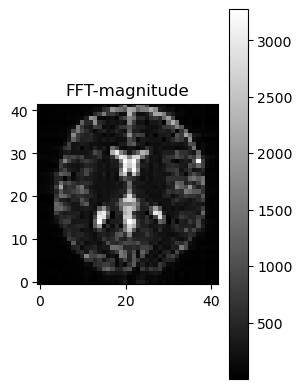

c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\numpy\_core\fromnumeric.py:48: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return conv.wrap(result, to_scalar=False)


3273.446044921875
echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
1 / 5: loss=0.15954910218715668, rSAR=1.0, Ref_FA=[180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.]


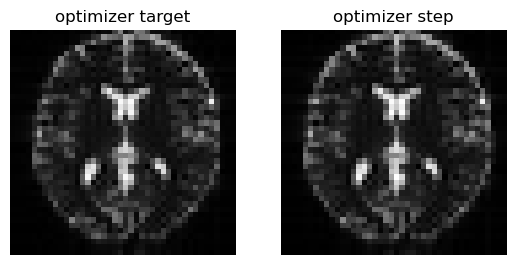

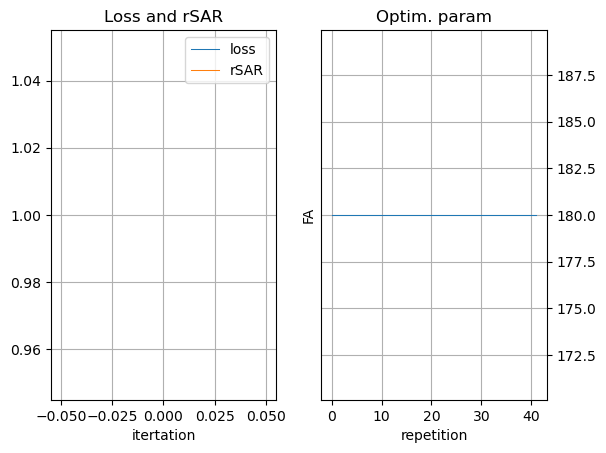

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
2 / 5: loss=0.1500757932662964, rSAR=0.9452298283576965, Ref_FA=[175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127]


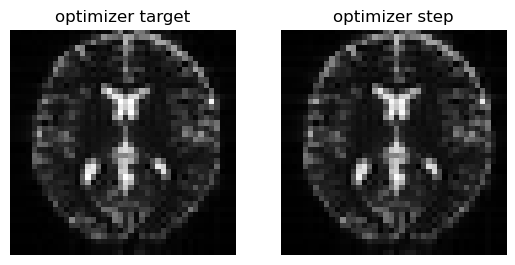

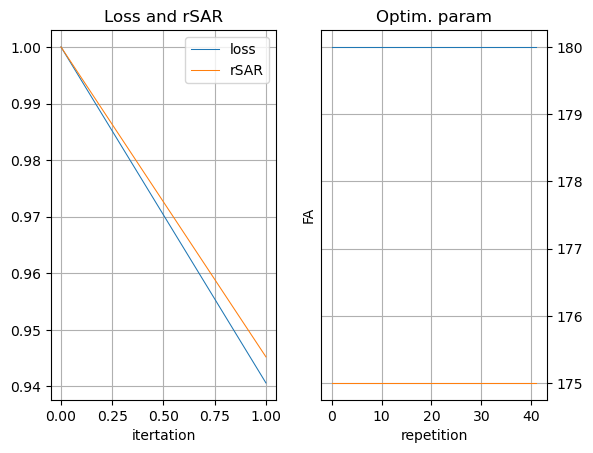

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
3 / 5: loss=0.15353523194789886, rSAR=0.8921929001808167, Ref_FA=[170.06067 170.00563 170.00192 170.00186 170.00421 170.00162 170.00267
 170.00255 170.00354 170.00389 170.00453 170.00497 170.00537 170.00508
 170.00505 170.00508 170.00552 170.00597 170.006   170.00627 170.00667
 170.01396 170.01505 170.01668 170.01865 170.02051 170.02167 170.02466
 170.0275  170.02827 170.02911 170.02815 170.0309  170.03314 170.03793
 170.04263 170.04796 170.0507  170.05597 170.05258 170.06143 170.06429]


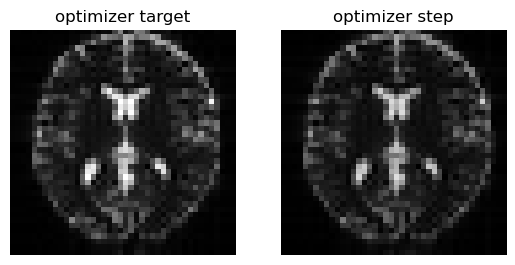

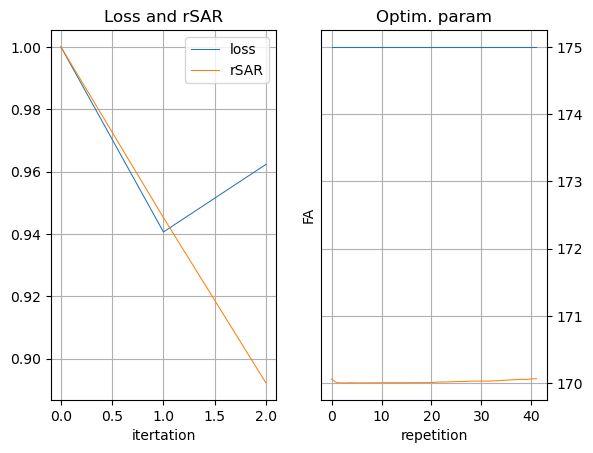

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
4 / 5: loss=0.1446572095155716, rSAR=0.8808470964431763, Ref_FA=[171.90884 167.10384 166.14162 165.82335 165.62738 165.29636 165.23672
 165.16338 165.12285 165.09804 165.07986 165.07298 165.05663 165.04646
 165.03842 165.03331 165.03021 165.02716 165.0241  165.02269 165.02168
 172.19722 172.19969 172.20354 172.20859 172.21329 172.21323 172.2194
 172.2238  172.22086 172.2154  172.20248 172.19734 172.19948 172.202
 172.20113 172.19536 172.17711 172.17096 172.0909  172.07721 172.03783]


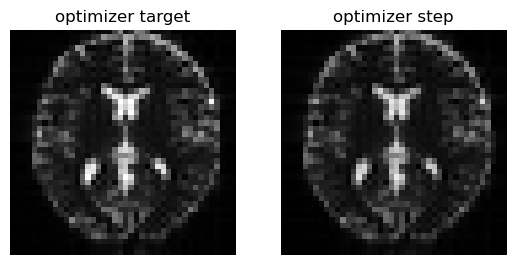

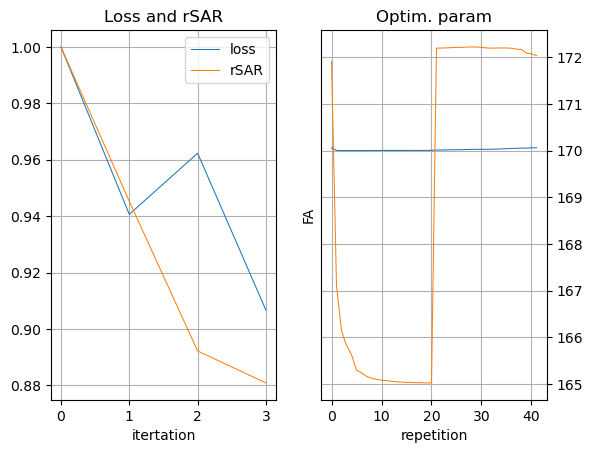

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
5 / 5: loss=0.14105884730815887, rSAR=0.8744245767593384, Ref_FA=[174.32867 165.39566 163.15207 162.34485 161.85509 160.9009  160.73087
 160.51138 160.38747 160.3103  160.25038 160.22775 160.17387 160.14117
 160.11397 160.09647 160.08443 160.07213 160.061   160.05524 160.05032
 174.91086 174.91498 174.91884 174.9253  174.93127 174.9282  174.93549
 174.93974 174.93192 174.91873 174.89299 174.87779 174.87909 174.87823
 174.8717  174.85545 174.81776 174.80232 174.65584 174.62556 174.55356]


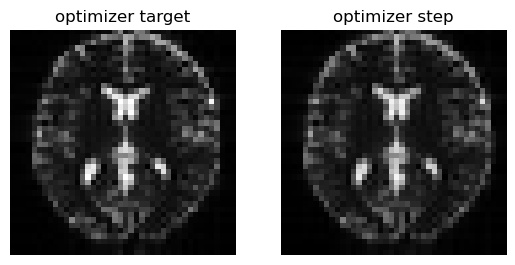

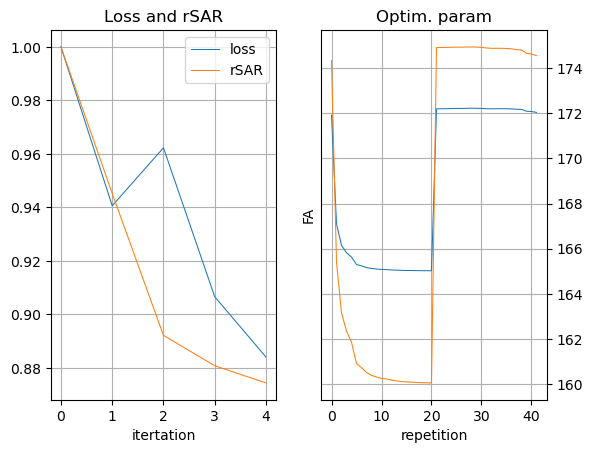

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
Optimized Weights: [174.32867 165.39566 163.15207 162.34485 161.85509 160.9009  160.73087
 160.51138 160.38747 160.3103  160.25038 160.22775 160.17387 160.14117
 160.11397 160.09647 160.08443 160.07213 160.061   160.05524 160.05032
 174.91086 174.91498 174.91884 174.9253  174.93127 174.9282  174.93549
 174.93974 174.93192 174.91873 174.89299 174.87779 174.87909 174.87823
 174.8717  174.85545 174.81776 174.80232 174.65584 174.62556 174.55356]


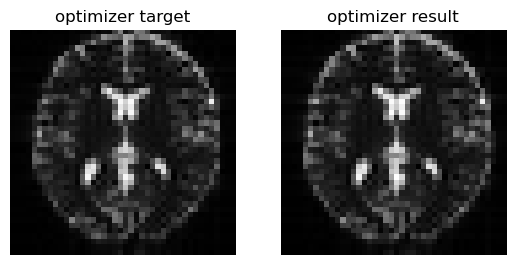

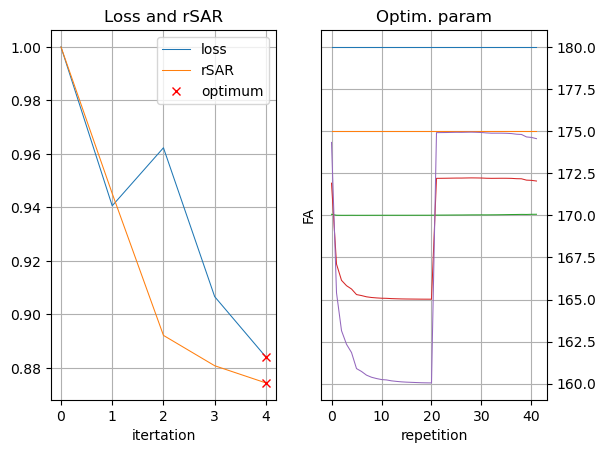

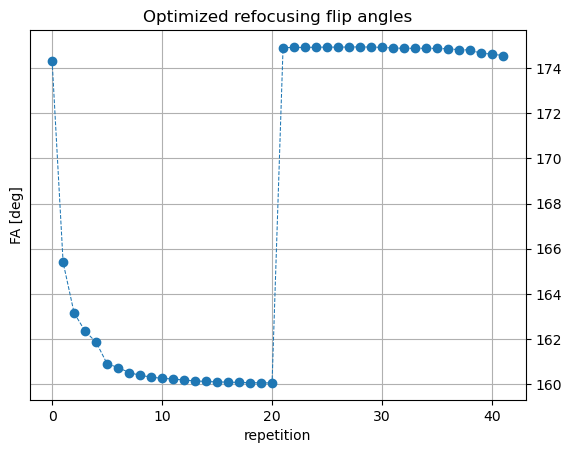

In [ ]:
# %% OPTIMIZE the refocusing flip angles

obj_p = make_obj_simulation(sz=sz,fov=fov,slice_thickness=slice_thickness,build=False)
target,Ref_FA_target = opt.generate_target_space(pp,sz)

opt.perform_optimazation(obj_p, target, pp, Ref_FA_target)

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully


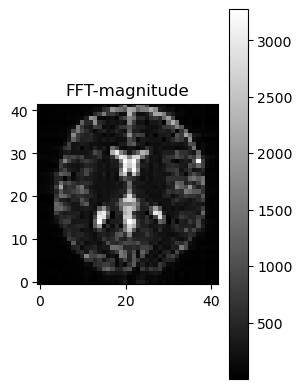

3273.446044921875


TypeError: perform_optimazation() takes 4 positional arguments but 7 were given

In [ ]:
# %% OPTIMIZE the refocusing flip angles

obj_p = make_obj_simulation(sz=sz,fov=fov,slice_thickness=slice_thickness,build=False)
target,Ref_FA_target = opt.generate_target_space(pp,sz)
iterations= 100
opt.perform_optimazation(obj_p, target, pp, Ref_FA_target,iterations,base_resolution,Ex_FA)

In [ ]:
 # %%  IMPORTS

import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib import cm
import MRzeroCore as mr0
import pulseqzero
import sequence_script as seqs
import reconstruction 
import optimization as opt
pp = pulseqzero.pp_impl

def make_obj_simulation(sz,fov,slice_thickness,build=True):
    if 1:
        # (i) load a phantom object from file
        # obj_p = mr0.VoxelGridPhantom.load_mat('../data/phantom2D.mat')
        obj_p = mr0.VoxelGridPhantom.load_mat('numerical_brain_cropped.mat')
        obj_p = obj_p.interpolate(sz[0], sz[1], 1)

    # Manipulate loaded data
        obj_p.T2dash[:] = 30e-3
        obj_p.D *= 0 
        if 0:
            obj_p.B0 *= 2    # alter the B0 inhomogeneity
            #obj_p.B1[:] = 1
            obj_p.B1 *= 3  # alter the B1 inhomogeneity
        else:#no inhomogeneity
            obj_p.B0 *= 0   
            obj_p.B1[:] = 1  
        # Store PD for comparison
        PD = obj_p.PD.squeeze()
        B0 = obj_p.B0.squeeze()
    #obj_p.plot()
    obj_p.size=torch.tensor([fov, fov, slice_thickness]) 
    if build:
        # Convert Phantom into simulation data
        obj_p = obj_p.build()
    return obj_p

c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\pulseqzero\__init__.py:29: UserWarning: Specified RF delay 0.00 us is less than the dead time 100 us. Delay was increased to the dead time.
  return func(*new_args, **new_kwargs)
c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\pulseqzero\__init__.py:29: UserWarning: Specified ADC delay 0.00 us is less than the dead time 20 us. Delay was increased to the dead time.
  return func(*new_args, **new_kwargs)


echo time set to minTE [ms] 7.4
Timing check passed successfully
Calculating repetition 44 / 44 - done
plotting with pulseq 1.4


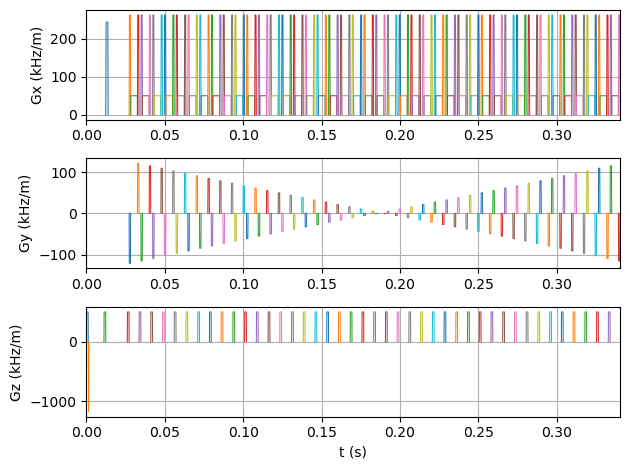

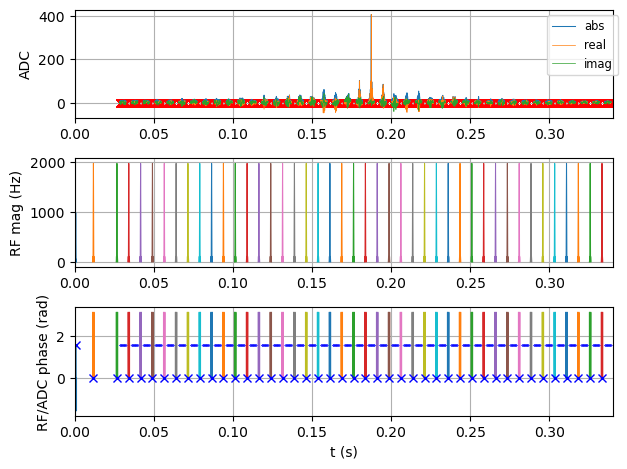

c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  x = np.array(x, subok=True, copy=copy)


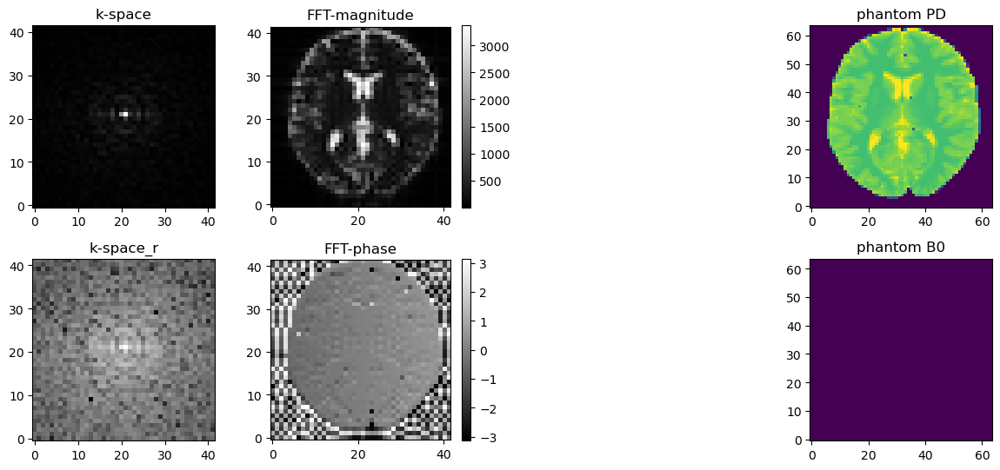

In [ ]:
# %%  SIMULATE  the external.seq file and add acquired signal to ADC plot + Recon

if __name__=="__main__":
    base_resolution=42
    Ex_FA=90    # excitation flip angle
    Ref_FA_target= torch.full((base_resolution,), 180)  # refocusing flip angle
    fov=200e-3
    slice_thickness=8e-3
    # base_resolution=42, # This line was causing the error
    TE_ms=5
    TI_s=0
    r_spoil=2
    PE_grad_on=True
    RO_grad_on=True
    seq, encoding = seqs.tse_sequence(pp=pp,fov=fov, slice_thickness=slice_thickness, base_resolution=base_resolution,
                    TE_ms=TE_ms, TI_s=TI_s, Ex_FA=Ex_FA, Ref_FA=Ref_FA_target, r_spoil=r_spoil,
                    PE_grad_on=PE_grad_on, RO_grad_on=RO_grad_on)

    seq.set_definition('FOV', [fov, fov, slice_thickness])
    seq.set_definition('Name', 'gre')
    seq.write('external.seq')
    sz = [64, 64]  # image size
    obj_p = make_obj_simulation(sz=sz,fov=fov,slice_thickness=slice_thickness)
    
    # Read in the sequence 
    seq0 = mr0.Sequence.import_file("external.seq")
    
    #seq0.plot_kspace_trajectory()
    # Simulate the sequence
    graph = mr0.compute_graph(seq0, obj_p, 200, 1e-3)
    signal = mr0.execute_graph(graph, seq0, obj_p)

    # PLOT sequence with signal in the ADC subplot
    mr0.util.pulseq_plot(seq, signal=signal.numpy())

    #  RECONSTRUCT the simulated data
    # additional noise as simulation is perfect
    #signal += 1e-4 * np.random.randn(signal.shape[0], 2).view(np.complex128)
    reconstruction.reconstruct_signal(Nread=base_resolution,Nphase=base_resolution,signal=signal,encoding=encoding,obj_p=obj_p)

c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\numpy\_core\fromnumeric.py:48: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return conv.wrap(result, to_scalar=False)


echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully


c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  x = np.array(x, subok=True, copy=copy)


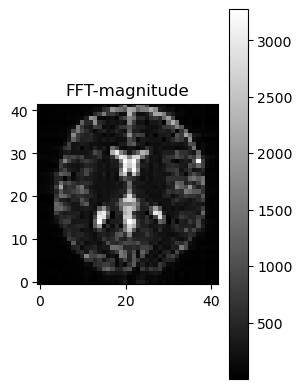

c:\Users\gritscfn1\.conda\envs\firstProject\Lib\site-packages\numpy\_core\fromnumeric.py:48: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return conv.wrap(result, to_scalar=False)


3273.446044921875
echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
1 / 100: loss=0.15954910218715668, rSAR=1.0, Ref_FA=[180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.]


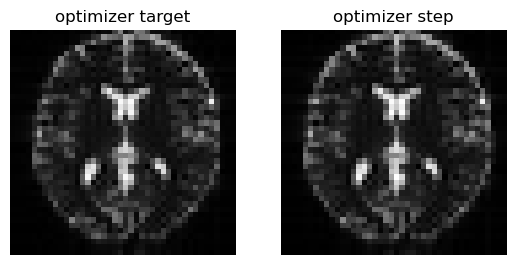

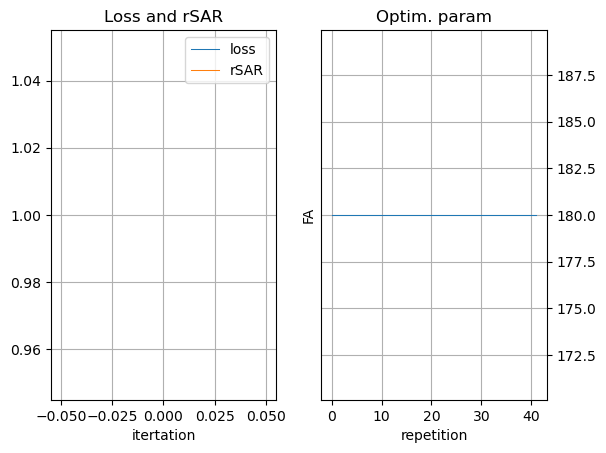

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
2 / 100: loss=0.1500757932662964, rSAR=0.9452298283576965, Ref_FA=[175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127
 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127 175.00127]


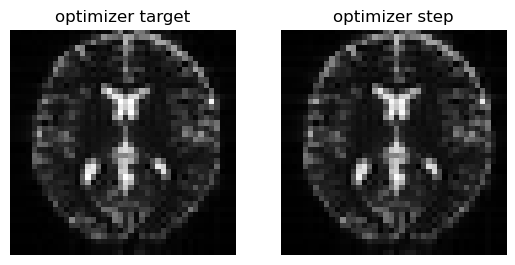

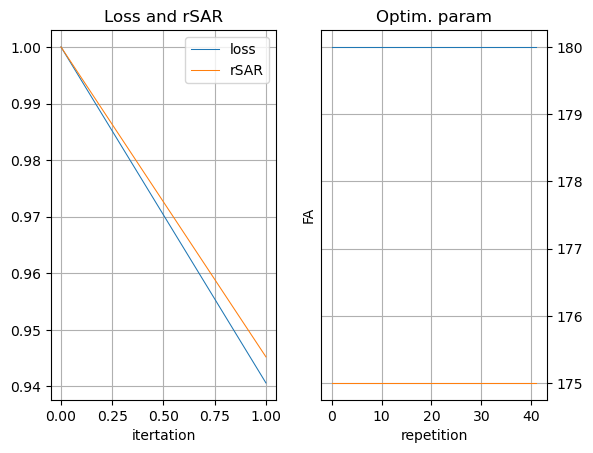

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
3 / 100: loss=0.15353523194789886, rSAR=0.8921929001808167, Ref_FA=[170.06067 170.00563 170.00192 170.00186 170.00421 170.00162 170.00267
 170.00255 170.00354 170.00389 170.00453 170.00497 170.00537 170.00508
 170.00505 170.00508 170.00552 170.00597 170.006   170.00627 170.00667
 170.01396 170.01505 170.01668 170.01865 170.02051 170.02167 170.02466
 170.0275  170.02827 170.02911 170.02815 170.0309  170.03314 170.03793
 170.04263 170.04796 170.0507  170.05597 170.05258 170.06143 170.06429]


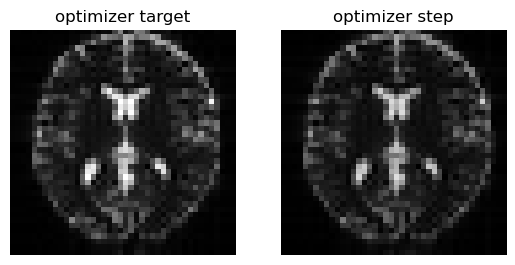

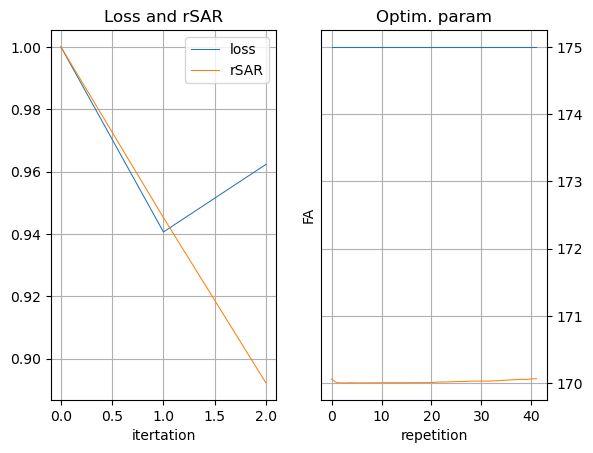

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
4 / 100: loss=0.1446572095155716, rSAR=0.8808470964431763, Ref_FA=[171.90884 167.10384 166.14162 165.82335 165.62738 165.29636 165.23672
 165.16338 165.12285 165.09804 165.07986 165.07298 165.05663 165.04646
 165.03842 165.03331 165.03021 165.02716 165.0241  165.02269 165.02168
 172.19722 172.19969 172.20354 172.20859 172.21329 172.21323 172.2194
 172.2238  172.22086 172.2154  172.20248 172.19734 172.19948 172.202
 172.20113 172.19536 172.17711 172.17096 172.0909  172.07721 172.03783]


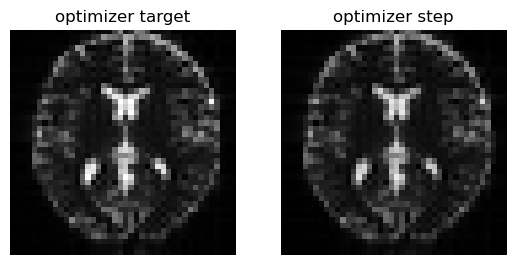

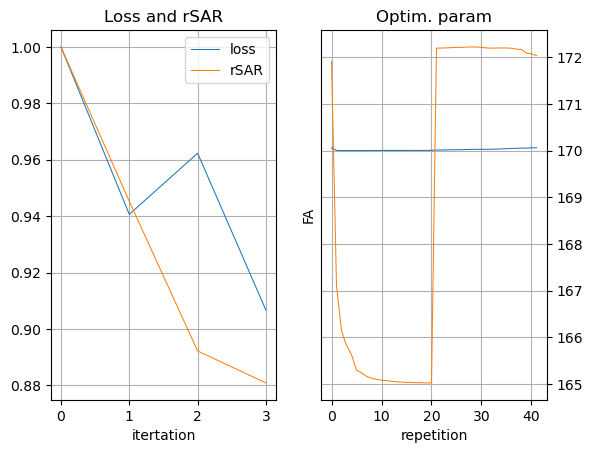

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
5 / 100: loss=0.14105884730815887, rSAR=0.8744245767593384, Ref_FA=[174.32867 165.39566 163.15207 162.34485 161.85509 160.9009  160.73087
 160.51138 160.38747 160.3103  160.25038 160.22775 160.17387 160.14117
 160.11397 160.09647 160.08443 160.07213 160.061   160.05524 160.05032
 174.91086 174.91498 174.91884 174.9253  174.93127 174.9282  174.93549
 174.93974 174.93192 174.91873 174.89299 174.87779 174.87909 174.87823
 174.8717  174.85545 174.81776 174.80232 174.65584 174.62556 174.55356]


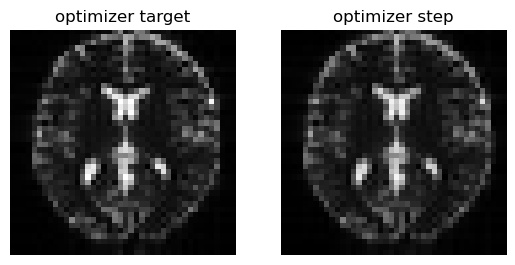

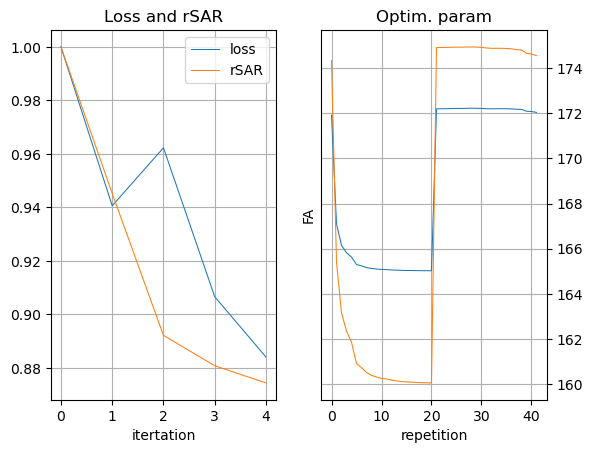

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
6 / 100: loss=0.13936065137386322, rSAR=0.8665599226951599, Ref_FA=[176.13562 163.94572 160.62704 159.38336 158.68108 156.92148 156.60893
 156.16124 155.89885 155.72751 155.58636 155.53343 155.40434 155.32602
 155.25943 155.21638 155.18547 155.15329 155.12556 155.11081 155.09764
 177.09949 177.10583 177.10608 177.11143 177.11653 177.10606 177.11105
 177.11172 177.09459 177.06752 177.02133 176.98686 176.98512 176.97647
 176.96034 176.92816 176.8635  176.83633 176.60767 176.56058 176.4548 ]


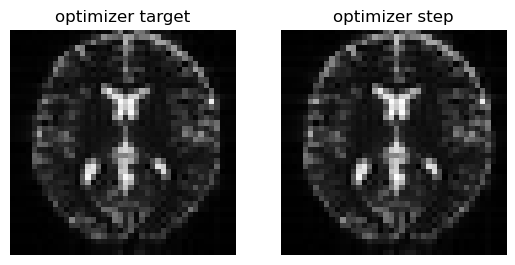

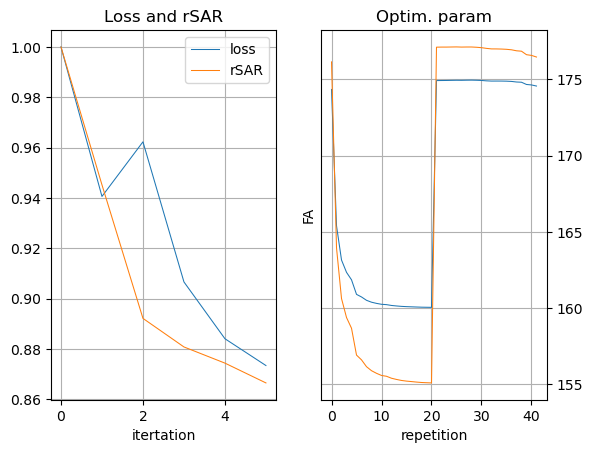

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
7 / 100: loss=0.13728532195091248, rSAR=0.8540970087051392, Ref_FA=[177.42397 161.29634 157.61096 155.75037 155.07321 152.61774 152.27374
 151.60576 151.27979 151.01747 150.8366  150.7514  150.57704 150.46945
 150.37483 150.31882 150.27138 150.23083 150.19246 150.1727  150.15366
 178.53395 178.60207 178.49318 178.6426  178.46237 178.66399 178.41086
 178.69249 178.34975 178.65219 178.21072 178.55356 178.12437 178.54837
 178.05304 178.48535 177.87917 178.36351 177.4746  177.98868 177.22147]


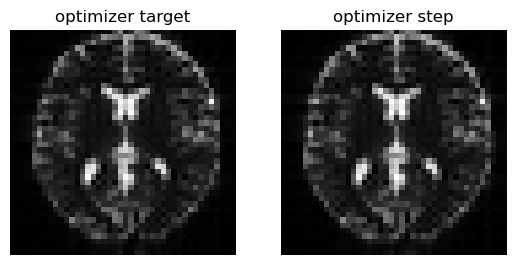

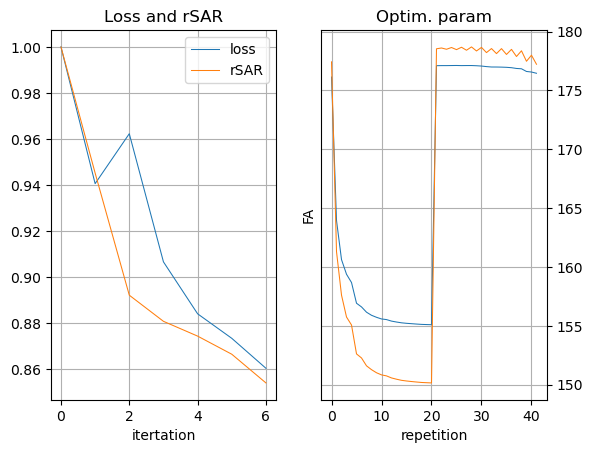

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
8 / 100: loss=0.1344538927078247, rSAR=0.8383298516273499, Ref_FA=[178.60551 157.95027 154.40475 151.70003 151.23242 148.09727 147.81218
 146.91605 146.57732 146.22957 146.03246 145.91779 145.71681 145.59244
 145.47769 145.41623 145.35536 145.31335 145.26973 145.24675 145.22389
 178.97333 179.90572 178.87878 179.98897 178.80292 180.04399 178.70111
 180.1005  178.5903  180.07288 178.3767  179.9671  178.2311  179.97337
 178.10147 179.9024  177.83188 179.76042 177.24767 179.29503 176.86902]


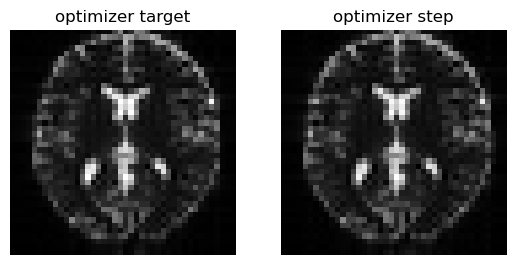

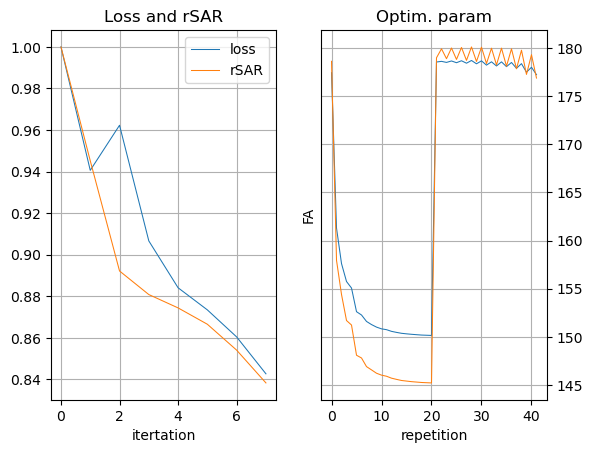

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
9 / 100: loss=0.13182011246681213, rSAR=0.8199283480644226, Ref_FA=[178.52696 154.93745 150.781   147.4616  147.12804 143.4694  143.23383
 142.16116 141.81262 141.40552 141.1931  141.05908 140.84364 140.70982
 140.58264 140.51865 140.44853 140.40938 140.36417 140.33928 140.31479
 179.66966 179.97343 179.43175 180.17416 179.23637 180.32487 179.02602
 180.45508 178.82013 180.47478 178.49849 180.37793 178.2787  180.39095
 178.10158 180.2742  177.76793 180.05597 177.06892 179.36662 176.66711]


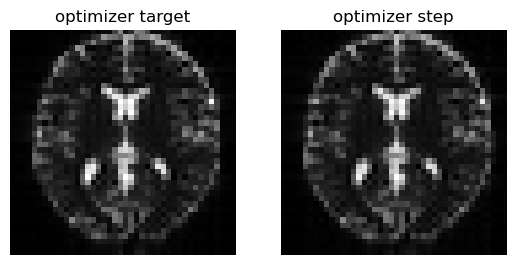

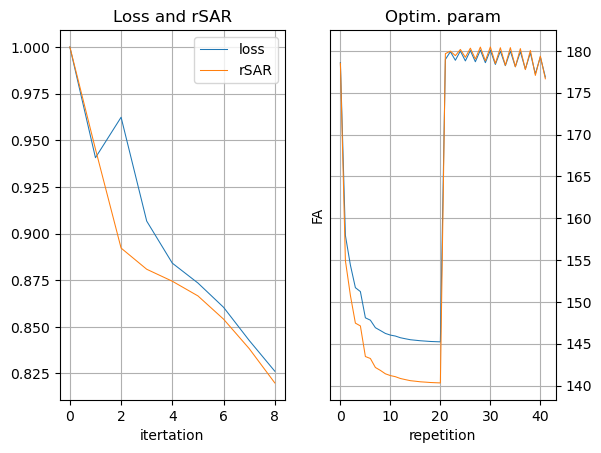

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
10 / 100: loss=0.12902843952178955, rSAR=0.7999824285507202, Ref_FA=[177.31029 152.70865 146.78207 143.17598 142.8025  138.79381 138.56813
 137.37251 137.00995 136.56503 136.33691 136.19095 135.97159 135.83182
 135.7     135.63408 135.55803 135.52515 135.48128 135.45457 135.43163
 180.95145 178.8367  180.49072 179.18785 180.10161 179.46733 179.71959
 179.70078 179.36589 179.79208 178.89679 179.71918 178.57825 179.74348
 178.35254 179.56743 177.97618 179.2524  177.2188  178.29471 176.88057]


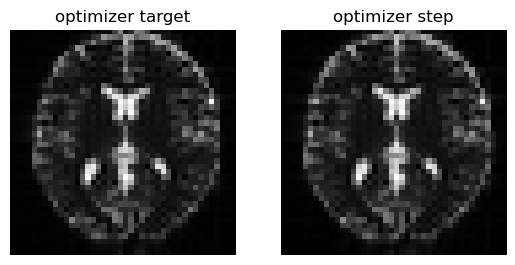

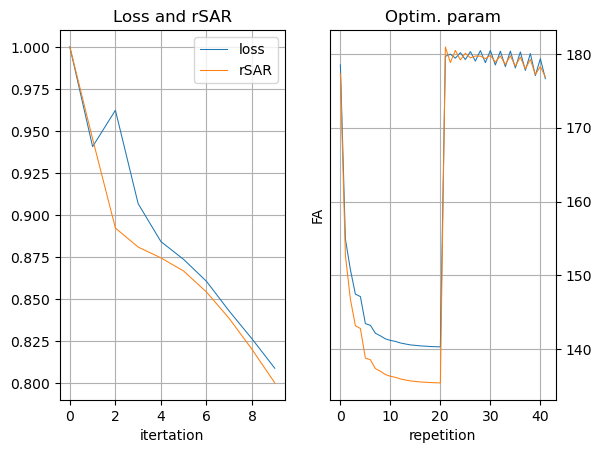

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
11 / 100: loss=0.12563830614089966, rSAR=0.7783885598182678, Ref_FA=[175.91669 149.84969 142.76833 138.69785 138.41023 134.03728 133.85782
 132.55193 132.18123 131.71309 131.4793  131.31502 131.11208 130.9615
 130.83617 130.76802 130.68494 130.6656  130.62286 130.59607 130.57477
 181.39078 177.79799 180.74683 178.26036 180.21252 178.62325 179.70963
 178.91542 179.25897 179.03268 178.6908  178.9456  178.30965 178.95232
 178.0551  178.70172 177.64319 178.28413 176.82108 177.06952 176.52843]


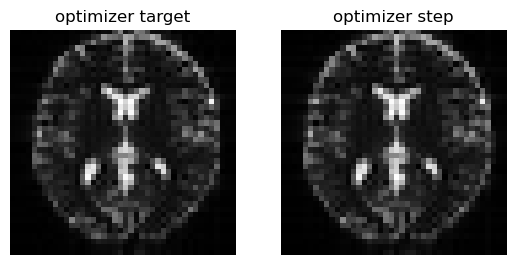

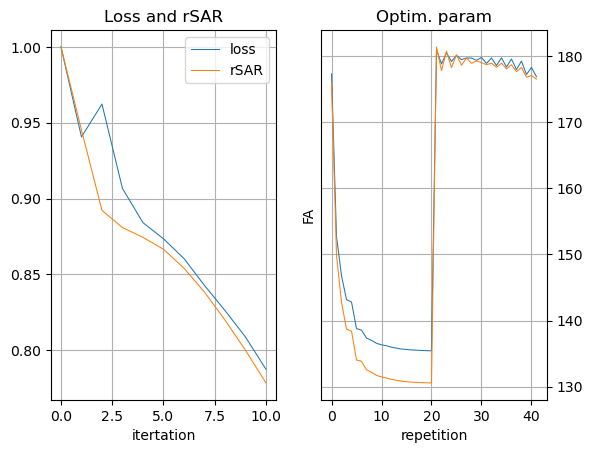

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
12 / 100: loss=0.12161412835121155, rSAR=0.7547643780708313, Ref_FA=[173.86977  146.53873  138.63486  134.09341  133.93086  129.22092
 129.11084  127.69911  127.33869  126.84352  126.62373  126.43265
 126.26988  126.091675 126.005196 125.90241  125.83435  125.83504
 125.7944   125.7673   125.74816  181.09647  176.3268   180.29851
 176.88283  179.64767  177.30656  179.04822  177.63474  178.51662
 177.74518  177.86684  177.60898  178.09015  177.53549  177.83363
 177.19617  177.41228  176.6669   176.55087  175.21297  176.30986 ]


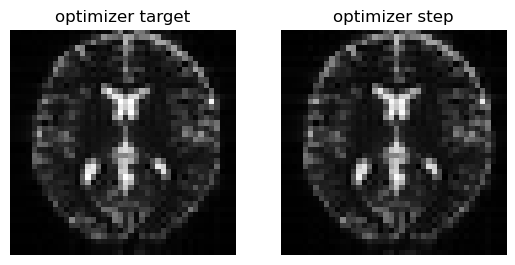

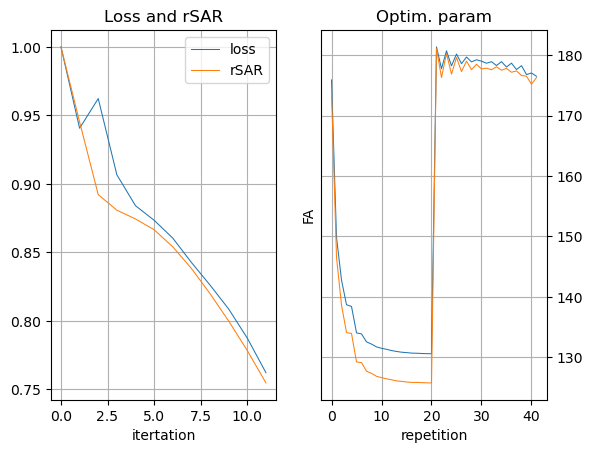

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
13 / 100: loss=0.11893592029809952, rSAR=0.7308573126792908, Ref_FA=[172.58908  142.92793  134.41156  129.4384   129.39531  124.4054
 124.35614  122.84476  122.515625 121.98752  121.788    121.579285
 121.44763  121.26247  121.207146 121.070755 121.03949  121.03585
 121.00727  120.974106 120.9629   180.24272  175.22774  179.31873
 175.82109  178.5714   176.26924  177.89107  176.61835  177.27826
 176.7238   176.56126  176.56119  177.05293  176.4204   176.74338
 176.05692  176.24434  175.50497  175.25961  173.94905  174.9628  ]


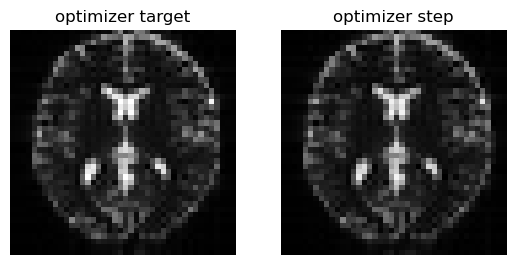

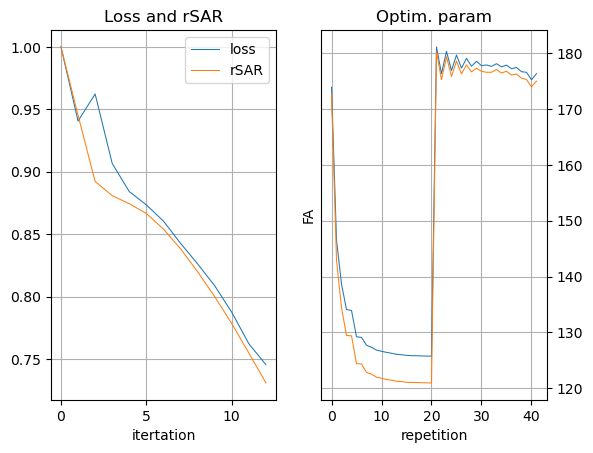

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
14 / 100: loss=0.11637723445892334, rSAR=0.7108369469642639, Ref_FA=[172.89162  139.12717  130.08302  124.79716  124.81545  119.62529
 119.60342  118.00294  117.74286  117.143486 116.97751  116.76206
 116.64574  116.475494 116.43244  116.279884 116.32785  116.267166
 116.27122  116.220726 116.22736  179.51282  175.8832   178.47325
 176.44719  177.63724  176.8856   176.89503  177.25511  176.22084
 177.39632  175.50375  177.27829  174.85184  176.50862  174.47992
 176.19334  173.89586  175.7016   172.79822  174.15723  172.4411  ]


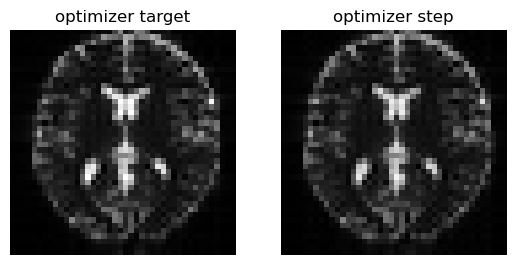

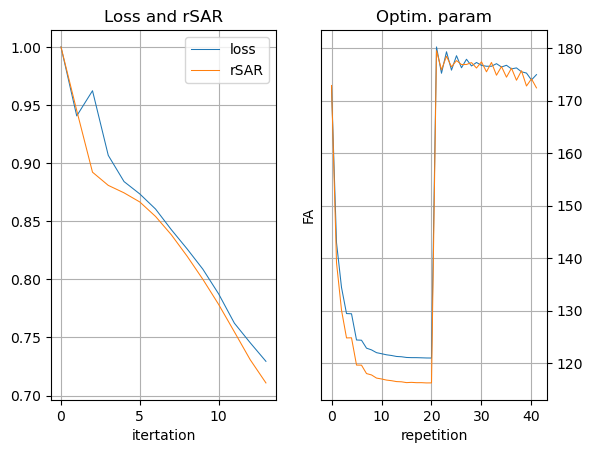

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
15 / 100: loss=0.11311065405607224, rSAR=0.6941631436347961, Ref_FA=[172.05258  137.12793  125.498566 120.478485 120.23739  114.85389
 114.918465 113.20475  113.037766 112.347015 112.19929  111.989
 111.90083  111.72795  111.700676 111.53838  111.666245 111.54766
 111.58076  111.51537  111.539345 180.77214  176.07443  179.61893
 176.62668  178.68343  177.09111  177.86565  177.53535  177.16652
 177.7619   176.46167  177.78331  173.51636  175.51314  173.05988
 175.24702  172.32368  174.7976   171.12675  173.25528  170.70831 ]


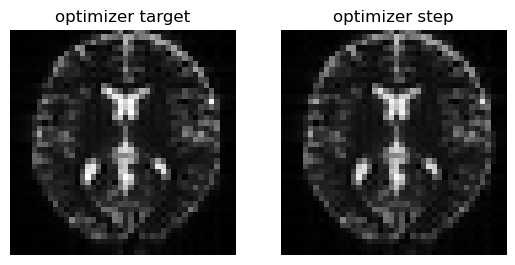

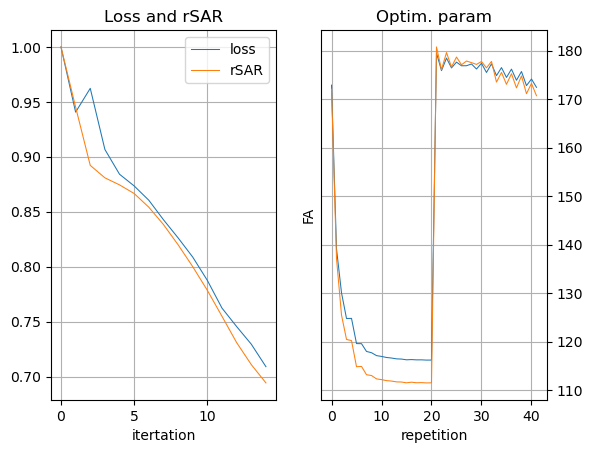

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
16 / 100: loss=0.11048959195613861, rSAR=0.6777176260948181, Ref_FA=[170.56287  136.00272  120.710785 116.2971   115.74332  110.08839
 110.29216  108.46546  108.386894 107.60994  107.46964  107.252075
 107.230965 107.02334  107.02676  106.84611  107.05239  106.88271
 106.93621  106.86297  106.89867  182.28955  175.66634  181.04381
 176.20331  180.02406  176.68787  179.13881  177.20053  178.45341
 177.4907   177.76317  177.63026  172.6179   173.92632  172.09462
 173.68721  171.17749  173.264    169.90045  171.72133  169.40863 ]


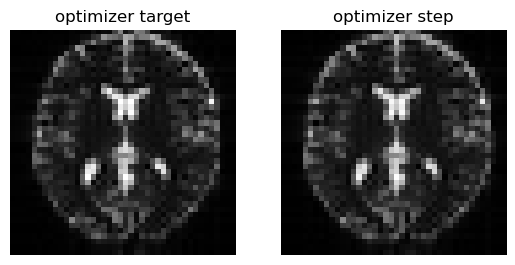

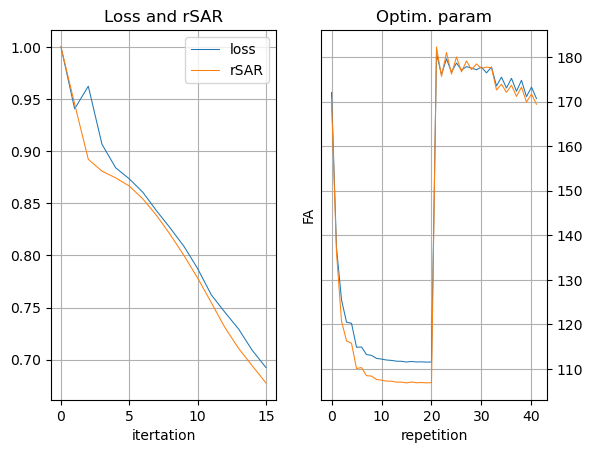

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
17 / 100: loss=0.10914526134729385, rSAR=0.6609175801277161, Ref_FA=[168.41113  134.66507  115.90861  112.08322  111.30269  105.35876
 105.691154 103.77863  103.75867  102.9264   102.781006 102.56652
 102.61519  102.37288  102.411385 102.20508  102.47345  102.27231
 102.34168  102.25822  102.306175 183.61443  174.88852  182.30223
 175.3629   181.24669  175.79832  180.35808  176.3      179.75748
 176.56172  179.16753  176.71956  172.15816  171.73132  171.63437
 171.4836   170.60832  171.06725  169.30444  169.52457  168.72644 ]


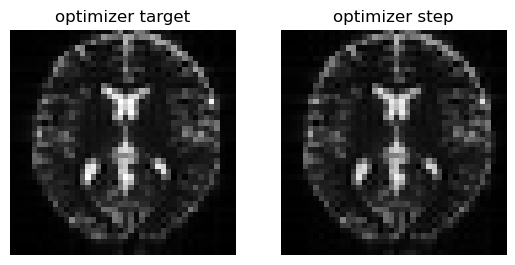

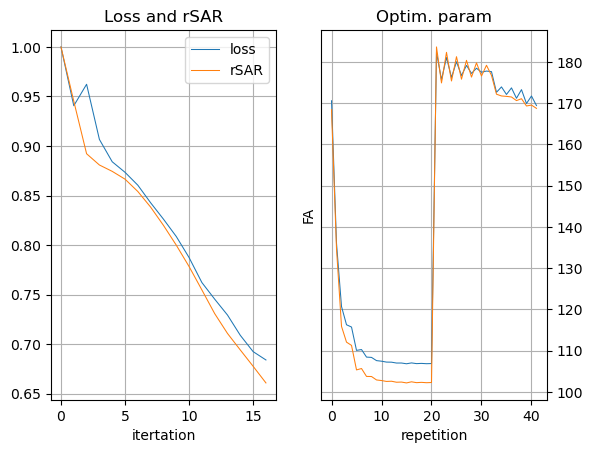

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
18 / 100: loss=0.10598582029342651, rSAR=0.6449853181838989, Ref_FA=[168.46294  132.86755  111.1929   107.90504  107.05724  100.69176
 101.178246  99.17282   99.18557   98.314896  98.14586   97.95979
  98.06121   97.79304   97.86526   97.62364   97.94074   97.72568
  97.804306  97.708275  97.771805 182.85829  175.75656  181.51082
 176.18492  180.40869  176.60815  179.4707   177.14812  178.89555
 177.4289   178.31276  177.64433  170.03061  171.83827  169.49287
 171.60892  168.39732  171.18053  167.09204  169.56601  166.48682 ]


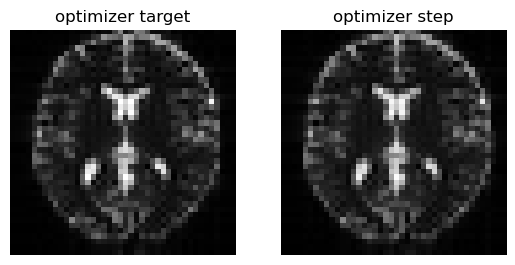

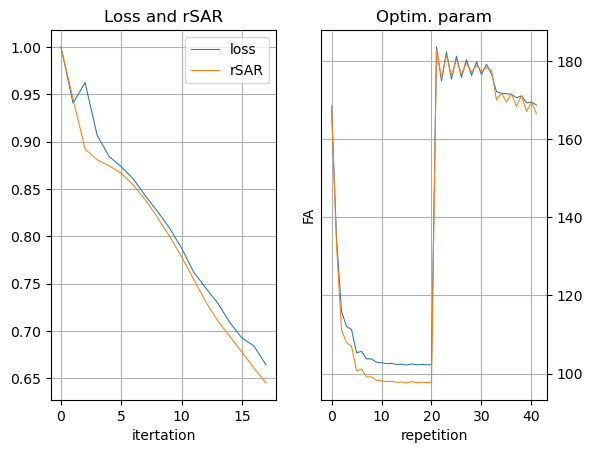

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
19 / 100: loss=0.104376420378685, rSAR=0.6289856433868408, Ref_FA=[167.76779  131.16853  106.44372  103.68755  103.002144  96.09518
  96.69788   94.651184  94.66965   93.7772    93.55668   93.43362
  93.57956   93.28079   93.39042   93.10299   93.45946   93.24379
  93.32724   93.213264  93.298004 182.07396  176.26186  180.71945
 176.59518  179.62231  176.93443  178.70291  177.43188  178.22777
 177.6389   177.74377  177.81412  168.41693  171.23415  167.92717
 170.98022  166.81805  170.52205  165.5577   168.83821  164.9076  ]


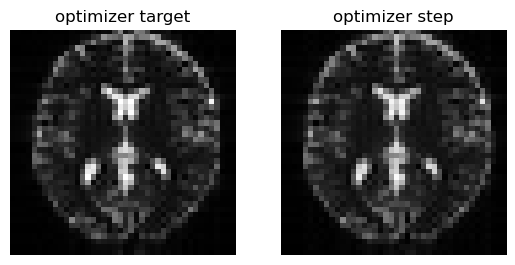

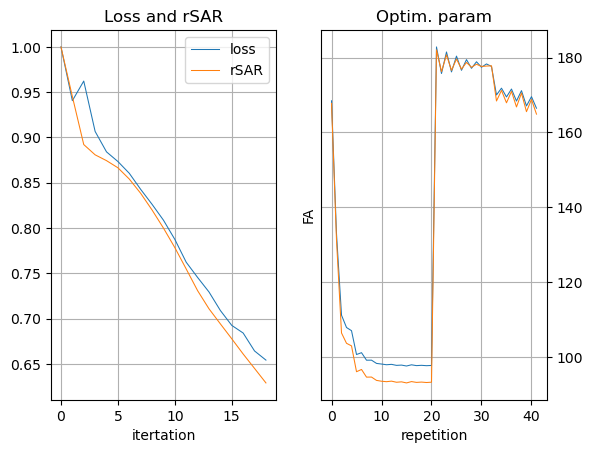

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
20 / 100: loss=0.10220242291688919, rSAR=0.6131903529167175, Ref_FA=[166.5809   130.15955  101.66324   99.40342   99.21831   91.61594
  92.24674   90.23084   90.228096  89.335434  89.01254   88.999825
  89.18034   88.847946  88.99078   88.64954   89.04052   88.83308
  88.91638   88.78166   88.889626 181.03914  176.6928   179.72487
 176.87039  178.69847  177.04582  177.87488  177.41553  177.57748
 177.4625   177.27516  177.51515  167.09904  170.17964  166.71962
 169.8575   165.64507  169.35056  164.4535   167.59816  163.74403 ]


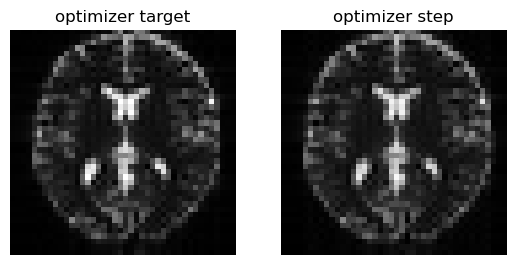

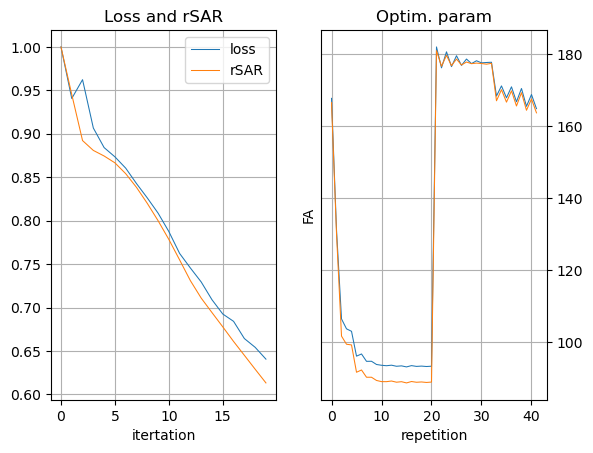

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
21 / 100: loss=0.0998544842004776, rSAR=0.5977786779403687, Ref_FA=[165.00798  130.11768   96.94794   95.02853   95.71727   87.32412
  87.8501    85.91329   85.87735   85.01841   84.51757   84.66215
  84.872345  84.50924   84.67263   84.26907   84.69324   84.50161
  84.575226  84.42427   84.55024  179.89795  176.94077  178.66132
 176.92714  177.7496   176.8968   177.068    177.09724  176.98622
 176.94818  176.8856   176.84749  166.00104  168.7758   165.77866
 168.34633  164.7741   167.76991  163.66083  165.9403   162.88528 ]


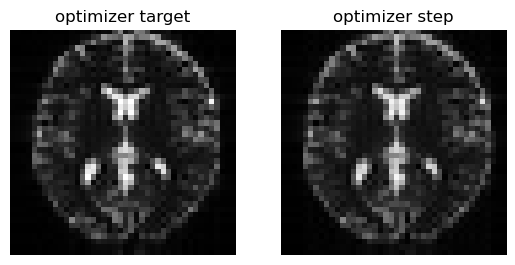

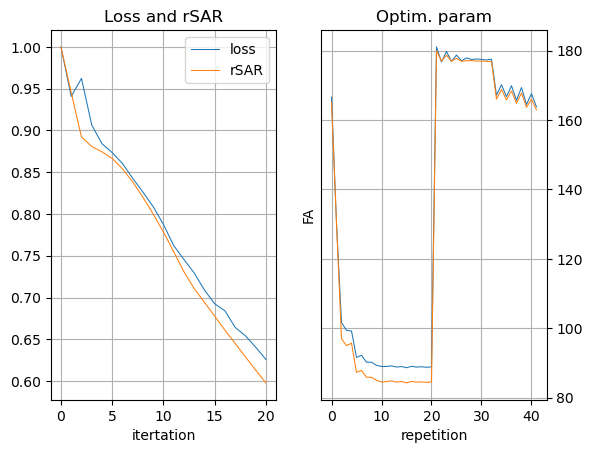

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
22 / 100: loss=0.09745899587869644, rSAR=0.5827116370201111, Ref_FA=[163.12117  130.70772   92.53414   90.55499   92.390755  83.3021
  83.540245  81.70209   81.6227    80.84717   80.08508   80.42259
  80.661     80.27382   80.44372   79.96881   80.4204    80.25841
  80.30785   80.144806  80.288826 178.74641  176.903    177.61024
 176.67897  176.82965  176.4258   176.30916  176.44281  176.45676
 176.09628  176.57362  175.8415   165.08658  167.0624   165.0544
 166.50052  164.14445  165.84447  163.10667  163.93326  162.25699 ]


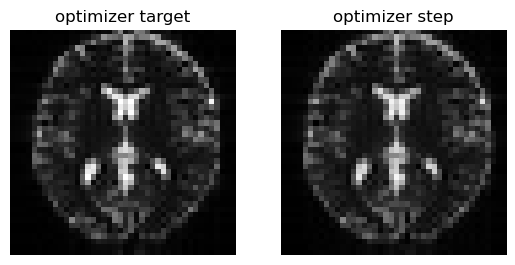

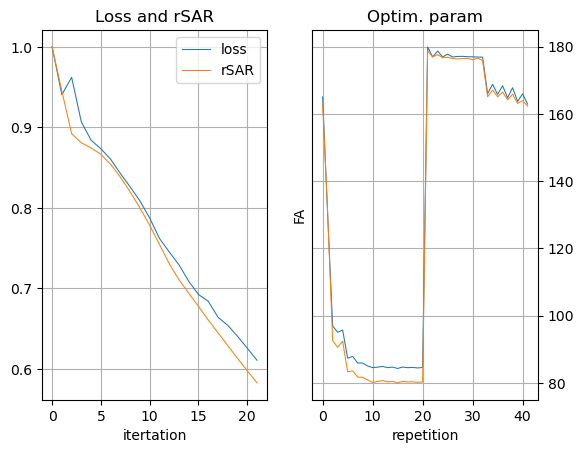

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
23 / 100: loss=0.09522727876901627, rSAR=0.5679509043693542, Ref_FA=[161.03615  131.33731   88.732605  86.03241   89.09485   79.57852
  79.39032   77.61354   77.46099   76.8328    75.73189   76.296135
  76.55169   76.14692   76.31148   75.75586   76.22929   76.10936
  76.11892   75.94428   76.11798  177.58919  176.60342  176.5648
 176.16039  175.91095  175.67944  175.55666  175.51062  175.93504
 174.97813  176.2746   174.57857  164.27316  165.13264  164.44987
 164.43071  163.64705  163.69768  162.67465  161.7112   161.73882 ]


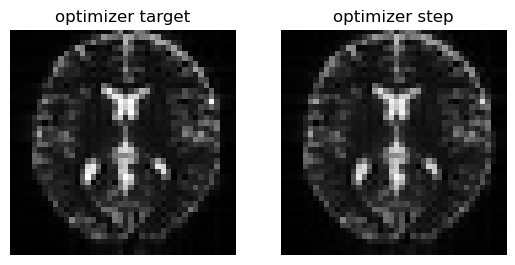

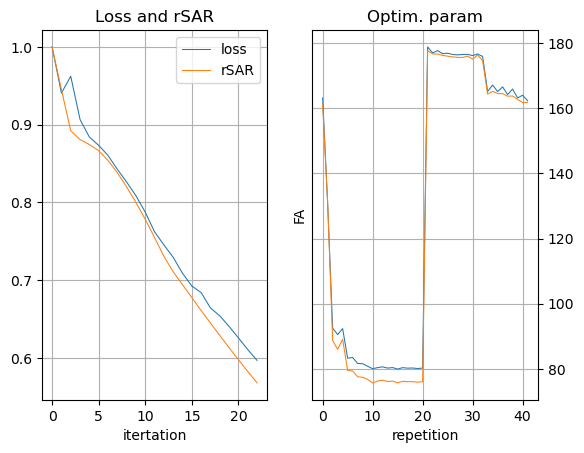

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
24 / 100: loss=0.09320122003555298, rSAR=0.5534598231315613, Ref_FA=[158.84091  131.35237   85.860756  81.54472   85.728226  76.14793
  75.488045  73.68181   73.396515  72.97443   71.47483   72.30463
  72.5564    72.13413   72.28043   71.64065   72.13035   72.063324
  72.011566  71.824234  72.05274  176.46541  176.03096  175.55069
 175.37201  175.0017   174.67197  174.80556  174.32796  175.40445
 173.6328   175.9621   173.10649  163.51964  163.04646  163.9089
 162.21434  163.21266  161.4186   162.28685  159.37708  161.24525 ]


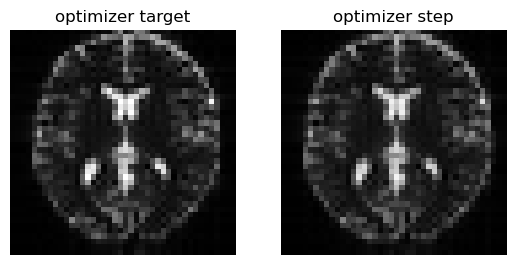

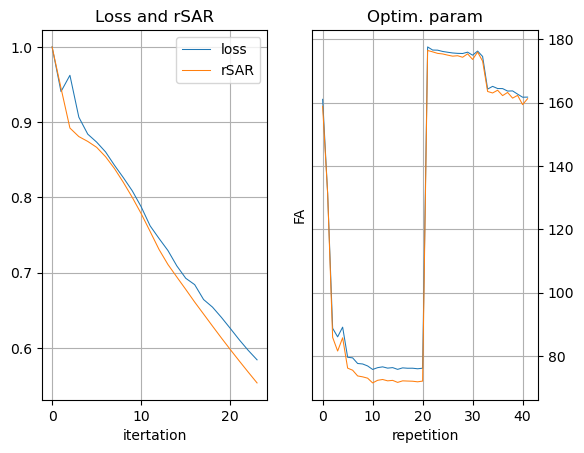

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
25 / 100: loss=0.09174258261919022, rSAR=0.5392560362815857, Ref_FA=[156.67963  130.3241    84.11467   77.21406   82.27797   72.977905
  71.92732   69.949     69.4501    69.26372   67.32718   68.47467
  68.692406  68.24352   68.35533   67.63317   68.13457   68.13203
  67.98863   67.79339   68.09888  175.4236   175.23676  174.57085
 174.3416   174.09346  173.4422   174.03835  172.94466  174.83835
 172.11359  175.59734  171.48409  162.76959  160.8812   163.35025
 159.95232  162.73648  159.12521  161.8201   157.06677  160.63625 ]


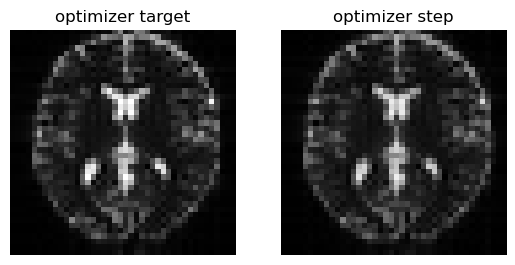

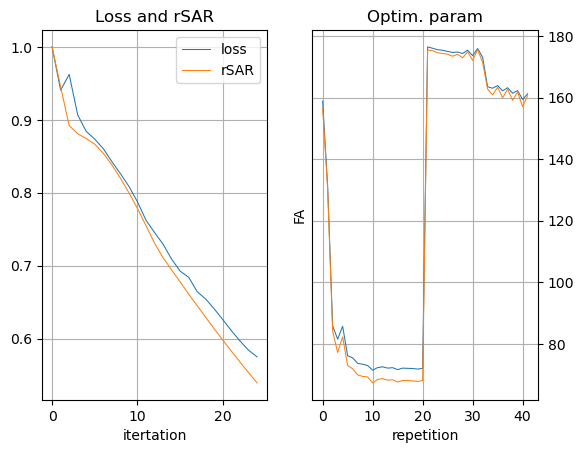

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
26 / 100: loss=0.09021076560020447, rSAR=0.5254918932914734, Ref_FA=[155.00232  128.25482   83.43944   73.224464  78.82703   70.02777
  68.79196   66.45778   65.65718   65.694824  63.30397   64.83132
  64.977295  64.49128   64.53976   63.743965  64.25118   64.32682
  64.05569   63.866558  64.25335  174.29982  174.645    173.36185
 173.40692  172.92833  172.33974  172.99315  171.71991  173.9639
 170.75261  174.8728   170.03587  161.67816  159.01651  162.36737
 158.06955  161.76727  157.2671   160.80885  155.23363  159.46329 ]


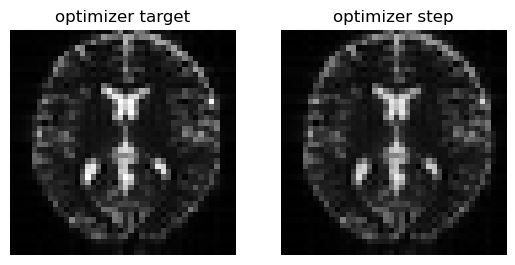

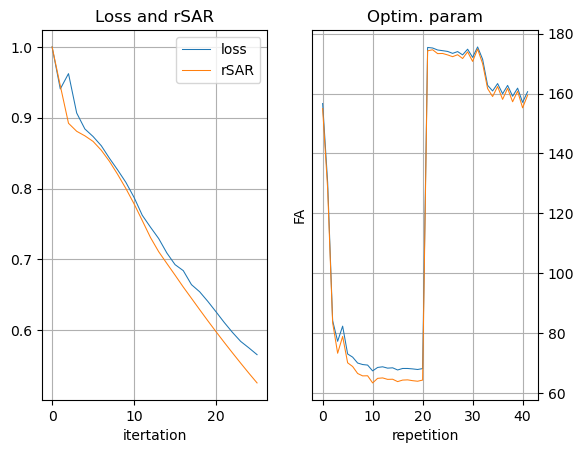

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
27 / 100: loss=0.08823918551206589, rSAR=0.5121984481811523, Ref_FA=[153.93326  125.43032   83.507195  69.73531   75.53129   67.25352
  66.087616  63.25451   62.054214  62.267994  59.416206  61.389618
  61.421238  60.890915  60.84391   59.976177  60.4971    60.64632
  60.22106   60.04841   60.52641  172.87383  174.20125  171.8399
 172.6719   171.42462  171.47925  171.56812  170.77298  172.66458
 169.7038   173.67123  168.9212   160.10445  157.6531   160.79626
 156.78395  160.14253  156.05396  159.12138  154.04549  157.64001 ]


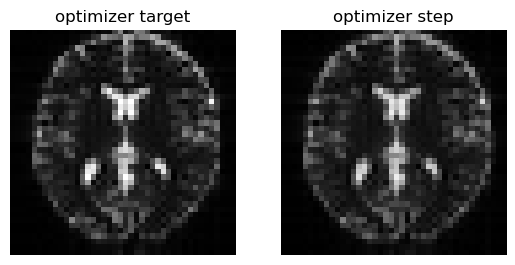

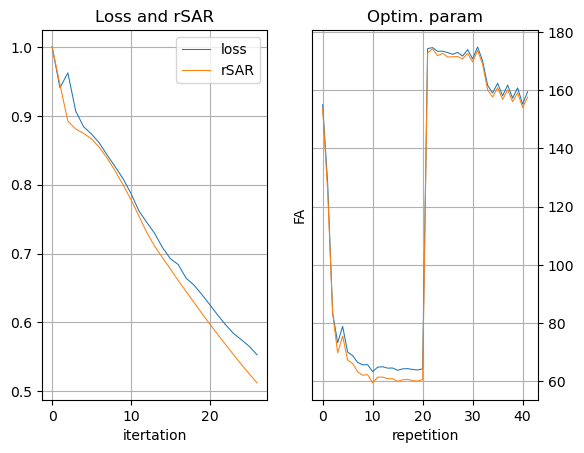

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
28 / 100: loss=0.0866180956363678, rSAR=0.49936339259147644, Ref_FA=[153.1155   122.131424  83.97434   66.89571   72.51035   64.63788
  63.791862  60.39142   58.673294  59.00361   55.67575   58.16159
  58.042145  57.457115  57.2784    56.33939   56.880245  57.09872
  56.480854  56.356354  56.9222   171.42247  173.59651  170.28377
 171.82121  169.86229  170.54608  170.04697  169.79567  171.22516
 168.67244  172.28136  167.8612   158.3423   156.47644  158.95938
 155.7601   158.20677  155.13606  157.11868  153.14311  155.51723 ]


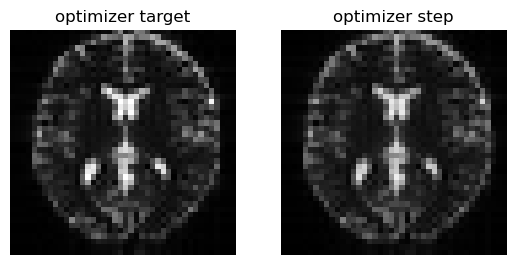

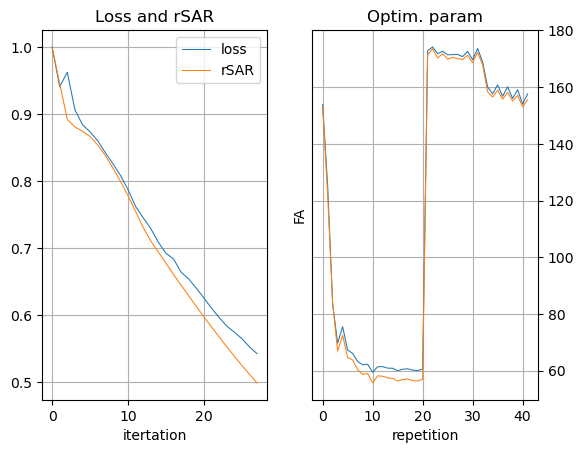

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
29 / 100: loss=0.0854257345199585, rSAR=0.48697906732559204, Ref_FA=[152.21078  118.67164   84.472626  64.81017   69.89271   62.20097
  61.861263  57.910587  55.555584  55.929977  52.095284  55.15855
  54.85893   54.203648  53.855534  52.846985  53.412697  53.69131
  52.839367  52.799248  53.44517  170.09816  172.67615  168.84946
 170.69495  168.39636  169.3778   168.58508  168.62714  169.8006
 167.5013   170.8641   166.70186  156.56389  155.28534  157.07507
 154.75069  156.2269   154.22267  155.11453  152.20299  153.42644 ]


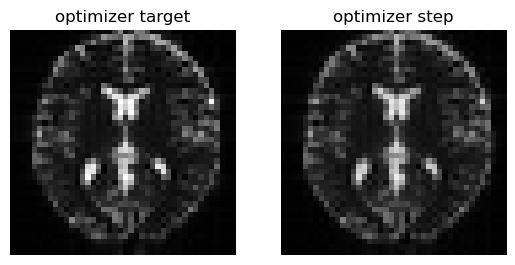

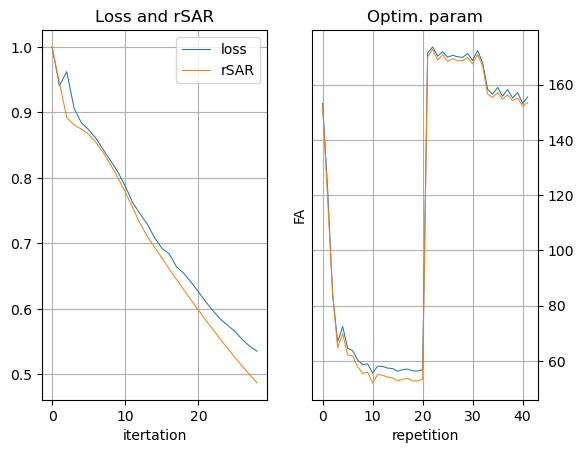

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
30 / 100: loss=0.08440730720758438, rSAR=0.47509294748306274, Ref_FA=[151.00679  115.42201   84.68954   63.516335  67.81275   59.983585
  60.28026   55.839035  52.753567  53.075718  48.696037  52.397987
  51.884335  51.149696  50.589127  49.514717  50.110134  50.432213
  49.3142    49.38473   50.096558 168.9632   171.40157  167.59807
 169.25851  167.08043  167.94676  167.22638  167.2501   168.42578
 166.1789   169.45323  165.4314   154.80194  154.04149  155.21078
 153.67181  154.32327  153.17482  153.29144  151.03783  151.59198 ]


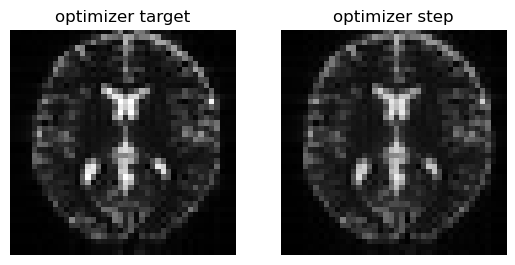

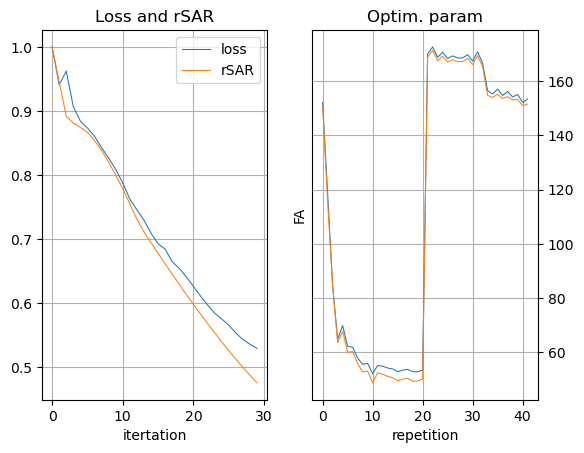

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
31 / 100: loss=0.08334285765886307, rSAR=0.46375077962875366, Ref_FA=[149.37642  112.70864   84.46388   62.976532  66.3605    58.030624
  59.0273    54.185417  50.3249    50.473724  45.50857   49.89177
  49.130875  48.307312  47.494705  46.36101   46.98715   47.336056
  45.92345   46.120216  46.886223 168.04109  169.7777   166.54694
 167.52304  165.92044  166.27414  165.96194  165.7022   167.07915
 164.75075  168.02702  164.09268  153.03003  152.76949  153.37042
 152.50398  152.54959  151.91992  151.7604   149.53493  150.16406 ]


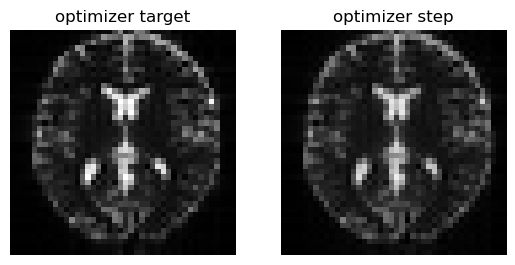

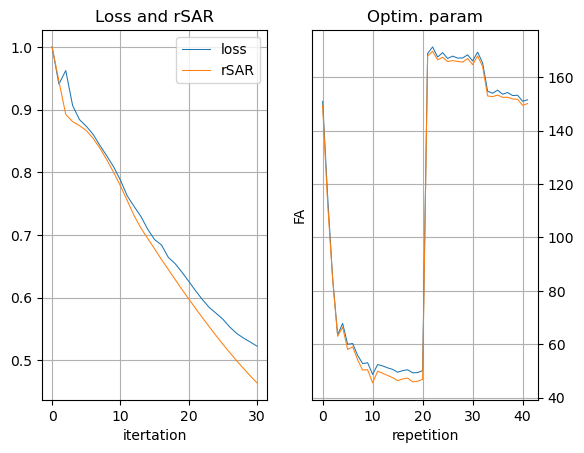

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
32 / 100: loss=0.08196274936199188, rSAR=0.4529544711112976, Ref_FA=[147.27284  110.650635  83.776405  63.131023  65.543465  56.374504
  58.066547  52.947304  48.316887  48.108578  42.592743  47.660492
  46.59324   45.693542  44.565804  43.440212  44.05409   44.402424
  42.681835  43.01322   43.83773  167.32715  167.8357   165.68239
 165.52524  164.89345  164.40906  164.7568   164.03593  165.72044
 163.26968  166.53845  162.73328  151.21252  151.49843  151.53954
 151.24431  150.92365  150.42305  150.56949  147.64665  149.20909 ]


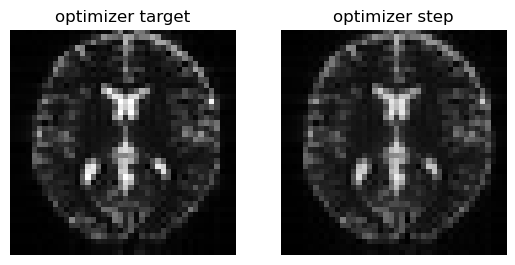

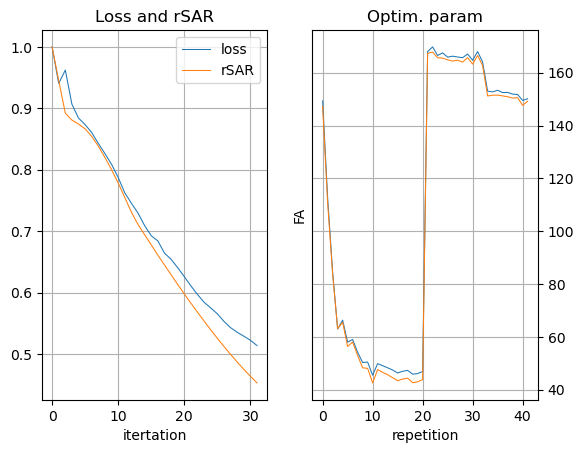

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
33 / 100: loss=0.08042050898075104, rSAR=0.44266387820243835, Ref_FA=[144.75357  109.097275  82.732956  63.88642   65.36387   55.069504
  57.341568  52.099518  46.751556  46.026268  40.00011   45.724728
  44.27879   43.323322  41.83293   40.735443  41.34716   41.64139
  39.596584  40.078182  40.964836 166.7671   165.64479  164.94907
 163.32721  163.94547  162.40498  163.56117  162.29536  164.31111
 161.76775  164.96336  161.37173  149.33455  150.23564  149.7091
 149.89885  149.42828  148.70384  149.68146  145.41714  148.67354 ]


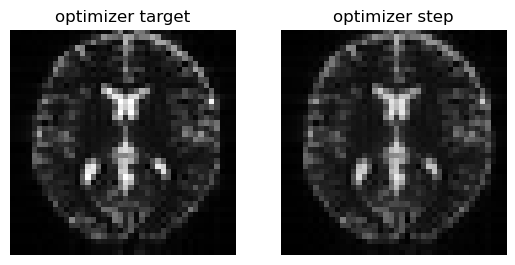

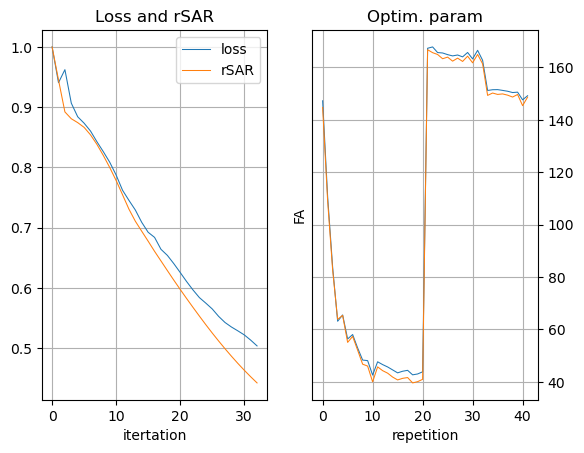

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
34 / 100: loss=0.07913488894701004, rSAR=0.4328126013278961, Ref_FA=[141.995    107.77105   81.45842   65.12177   65.79734   54.187157
  56.788555  51.585964  45.620213  44.263824  37.77792   44.091785
  42.198086  41.20595   39.31862   38.26744   38.88126   39.064392
  36.674892  37.326584  38.274967 166.25183  163.31856  164.2426
 161.02847  162.9884   160.33598  162.31496  160.52272  162.82556
 160.25484  163.3074   159.9958   147.41669  148.95987  147.8848
 148.48659  148.00754  146.85197  148.95639  142.9976   148.36073 ]


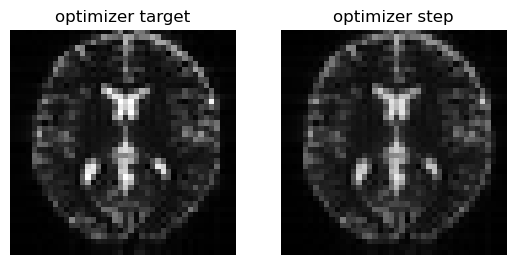

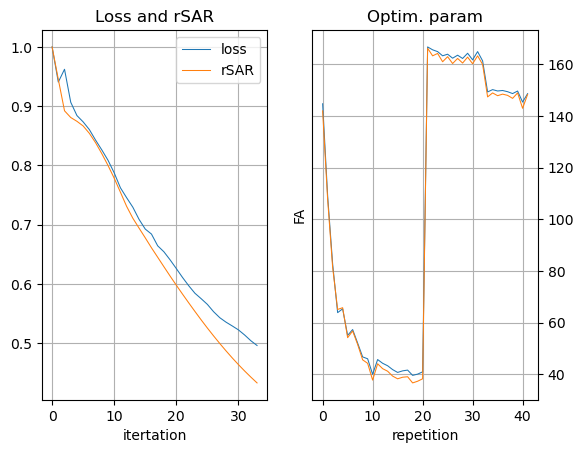

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
35 / 100: loss=0.0784572884440422, rSAR=0.4233688712120056, Ref_FA=[139.39104  106.42239   80.07602   66.670074  66.79512   53.802402
  56.389908  51.35009   44.873425  42.839245  35.96709   42.764893
  40.368874  39.349613  37.038242  36.07942   36.653557  36.687374
  33.934746  34.766647  35.76892  165.55556  161.10074  163.33405
 158.86392  161.82004  158.3982   160.87663  158.84863  161.19745
 158.78755  161.57382  158.61049  145.49945  147.6361   146.08397
 147.05719  146.54828  145.07663  148.10071  140.72778  147.8475  ]


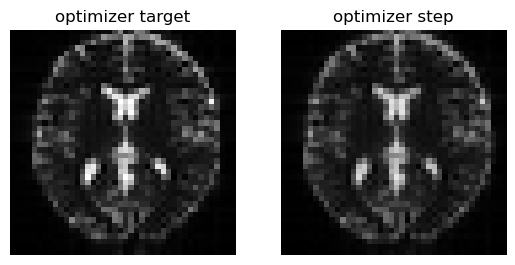

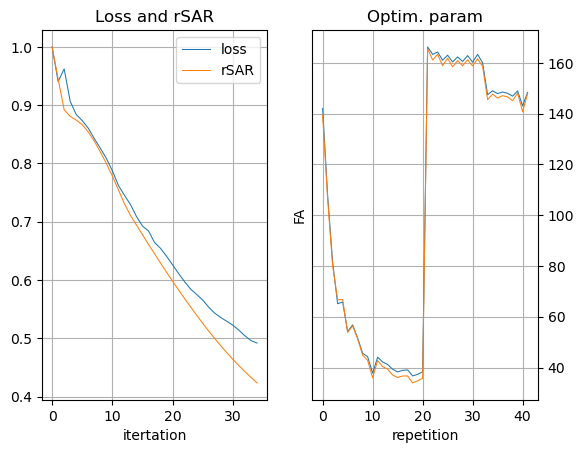

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
36 / 100: loss=0.07744215428829193, rSAR=0.41439521312713623, Ref_FA=[137.506    104.94037   78.71502   68.33017   68.248856  53.973656
  56.158665  51.346275  44.456608  41.752644  34.578934  41.736122
  38.79767   37.76897   34.99787   34.217495  34.662155  34.522697
  31.398006  32.406662  33.44884  164.42352  159.32556  161.94072
 157.18297  160.17393  156.90192  159.05241  157.48442  159.33574
 157.44984  159.7799   157.20477  143.6735   146.1694   144.37517
 145.63673  144.93263  143.65659  146.75116  139.09691  146.61462 ]


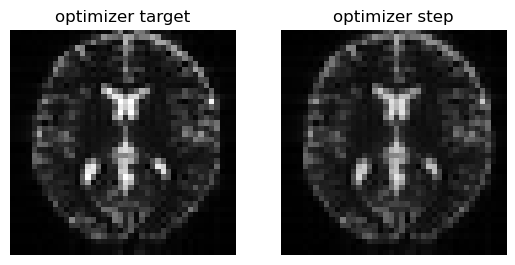

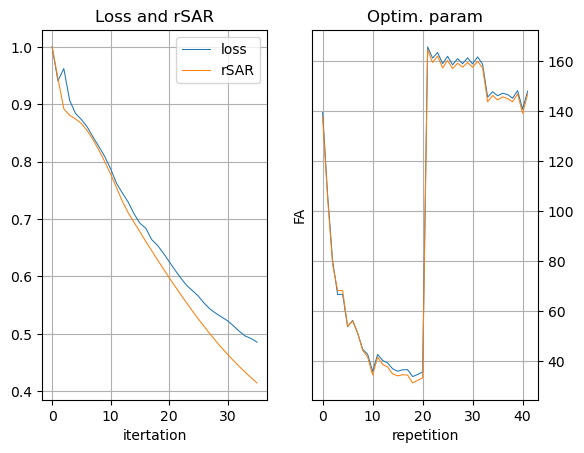

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
37 / 100: loss=0.07605031132698059, rSAR=0.4058898389339447, Ref_FA=[136.41669  103.40204   77.51115   69.87262   69.96268   54.745937
  56.15302   51.49711   44.318443  41.10041   33.540703  40.995182
  37.479134  36.413525  33.208466  32.568047  32.928574  32.580338
  29.074234  30.255053  31.337742 162.90129  157.97571  160.09065
 155.98904  158.06792  155.8464   156.86458  156.38983  157.30154
 156.15128  158.0374   155.64749  142.0843   144.42047  142.8667
 144.15973  143.17227  142.63634  144.85735  138.19656  144.6362  ]


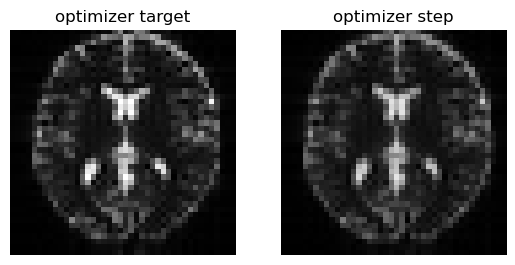

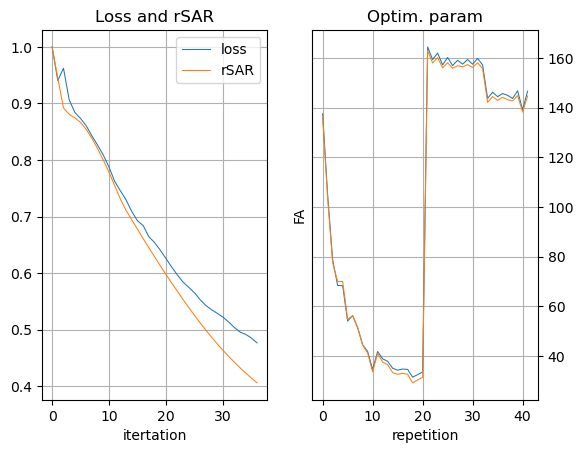

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
38 / 100: loss=0.074881911277771, rSAR=0.39777424931526184, Ref_FA=[135.67744  101.98931   76.6319    71.12501   71.67837   56.083878
  56.449497  51.798294  44.426212  40.86319   32.837643  40.520092
  36.41619   35.287865  31.675514  31.136312  31.463642  30.88351
  26.979668  28.329227  29.441483 161.27562  156.70836  158.08801
 154.92493  155.79817  154.89581  154.57208  155.28534  155.29234
 154.69293  156.46924  153.82462  140.78642  142.3841   141.5675
 142.58835  141.36375  141.8162   142.68575  137.65482  142.31906 ]


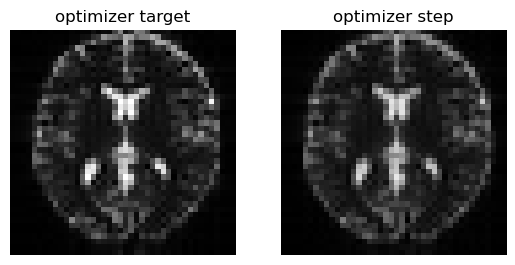

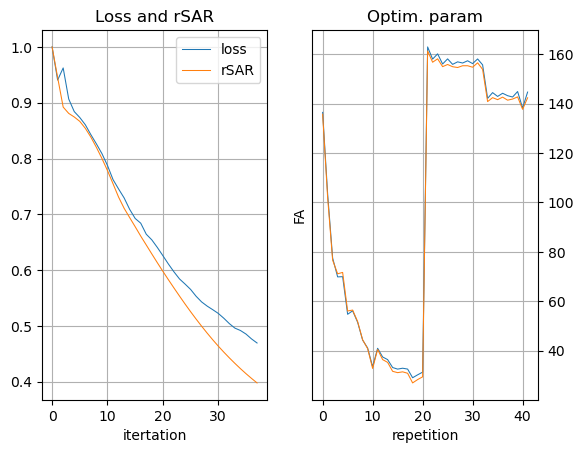

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
39 / 100: loss=0.07398401945829391, rSAR=0.390002578496933, Ref_FA=[134.81429  100.89696   76.215256  72.009224  73.178185  57.904587
  57.10496   52.247005  44.76353   41.004883  32.45008   40.28785
  35.604103  34.396893  30.39943   29.933084  30.272705  29.451124
  25.126432  26.642956  27.761225 159.76341  155.27138  156.17462
 153.71799  153.60484  153.79738  152.37714  153.98784  153.42996
 152.99908  155.09073  151.76088  139.69826  140.18712  140.37328
 140.97502  139.56483  141.00456  140.5268   137.06566  140.1116  ]


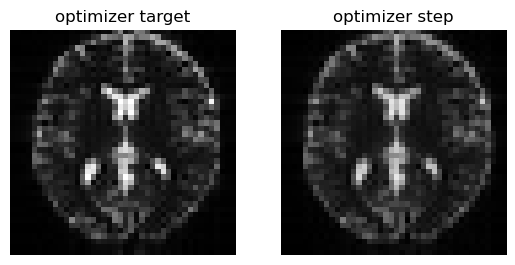

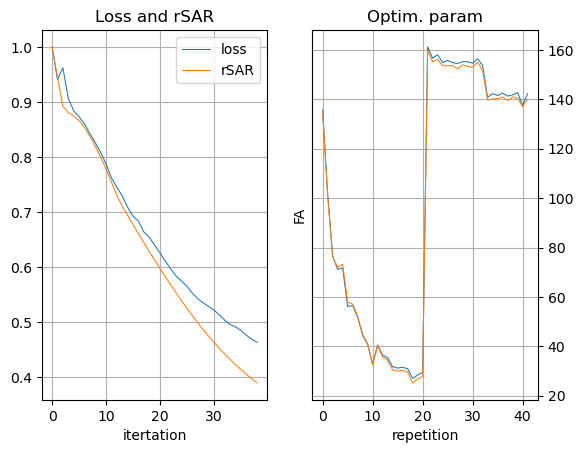

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
40 / 100: loss=0.07304488867521286, rSAR=0.3825645446777344, Ref_FA=[133.55002  100.2375    76.32881   72.5367    74.349594  60.07922
  58.160145  52.848614  45.32138   41.474358  32.356083  40.2823
  35.042007  33.738037  29.363567  28.961094  29.355799  28.292084
  23.520144  25.195364  26.288881 158.46214  153.57289  154.45251
 152.27547  151.57893  152.47932  150.34264  152.46924  151.72731
 151.1021   153.85175  149.54025  138.71043  137.96344  139.16739
 139.40224  137.77596  140.1125   138.54936  136.1871   138.2982  ]


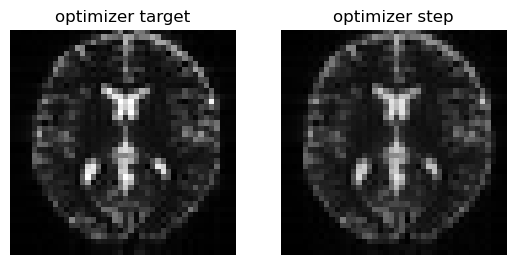

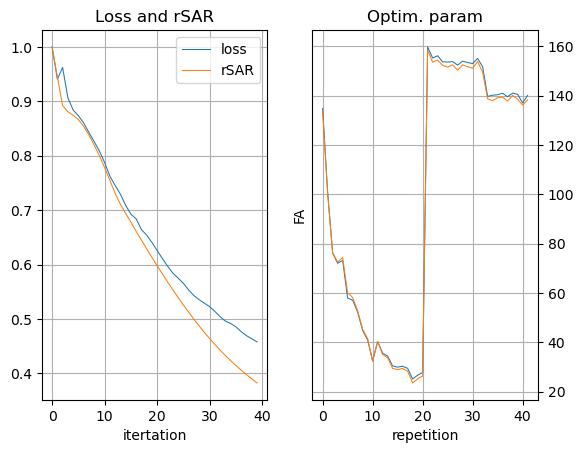

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
41 / 100: loss=0.07188793271780014, rSAR=0.3754531741142273, Ref_FA=[131.795    100.00607   76.95844   72.79463   75.14509   62.47188
  59.595592  53.60332   46.08545   42.220013  32.53865   40.482067
  34.725525  33.30895   28.572573  28.232143  28.709042  27.404041
  22.161278  23.987274  25.022387 157.40862  151.59602  152.94792
 150.59628  149.72139  150.9703   148.44202  150.78668  150.13364
 149.07759  152.68495  147.24477  137.74168  135.79651  137.87973
 137.92212  135.98447  139.11218  136.8144   134.93034  136.98326 ]


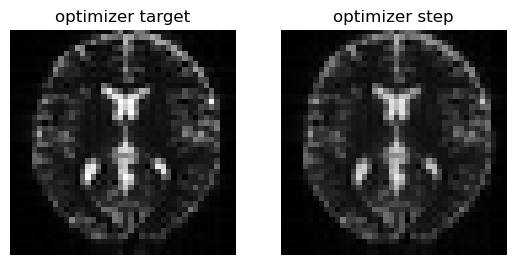

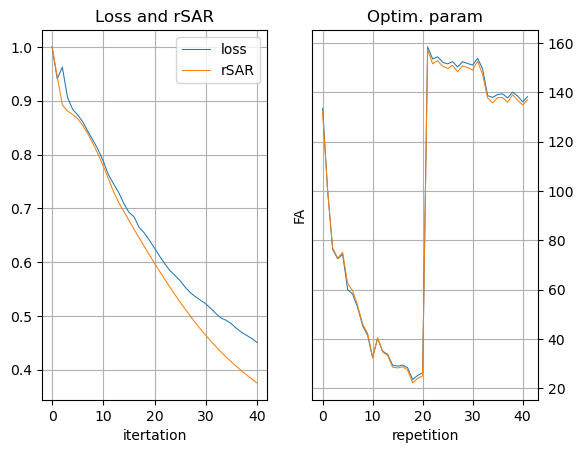

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
42 / 100: loss=0.07058925926685333, rSAR=0.36862877011299133, Ref_FA=[129.62141  100.066086  78.00983   72.90113   75.625206  64.92179
  61.312527  54.515182  47.041187  43.185043  32.962513  40.86285
  34.636803  33.117664  28.040024  27.75409   28.32807   26.781353
  21.066284  23.013693  23.95847  156.60304  149.34381  151.65579
 148.69543  148.00049  149.3175   146.6087   149.02342  148.56331
 147.0178   151.506    144.95114  136.7279   133.72064  136.49037
 136.53435  134.18779  138.00337  135.30017  133.33475  136.09892 ]


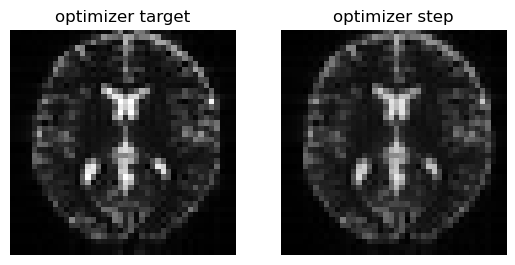

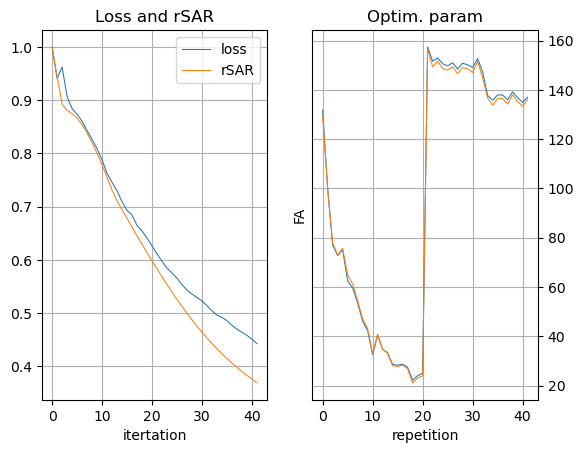

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
43 / 100: loss=0.0693318098783493, rSAR=0.36204811930656433, Ref_FA=[127.2122   100.220505  79.33801   72.99419   75.90963   67.276764
  63.194645  55.569965  48.17449   44.322887  33.6003    41.39266
  34.765347  33.15576   27.766348  27.523575  28.213964  26.416418
  20.245834  22.268463  23.085737 156.00772  146.84933  150.5474
 146.60184  146.37619  147.57202  144.77362  147.26817  146.91978
 145.02809  150.21628  142.74675  135.60306  131.75363  135.0116
 135.20047  132.40585  136.79361  133.94322  131.52345  135.46371 ]


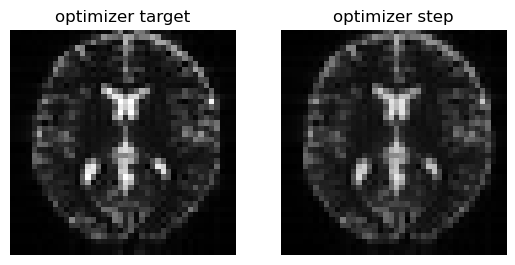

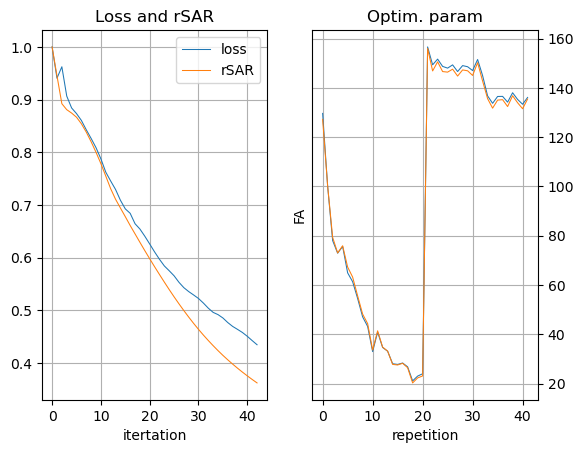

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
44 / 100: loss=0.06827446073293686, rSAR=0.35567259788513184, Ref_FA=[124.84717  100.28649   80.77362   73.19332   76.135735  69.412506
  65.12749   56.745083  49.463     45.59441   34.429005  42.049324
  35.09726   33.410442  27.750326  27.53448   28.35221   26.295435
  19.699993  21.742704  22.39736  155.53058  144.19762  149.54518
 144.38266  144.78888  145.7923   142.87373  145.60184  145.11478
 143.21915  148.70787  140.73961  134.28185  129.92503  133.46173
 133.86493  130.67633  135.49316  132.6546   129.68301  134.81075 ]


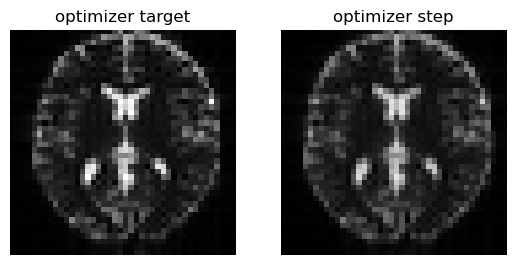

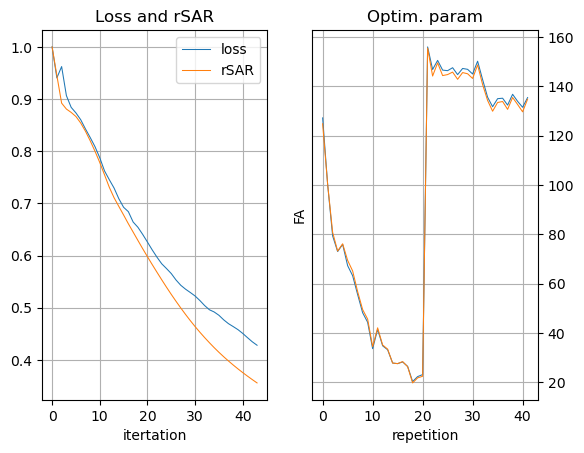

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
45 / 100: loss=0.06735900044441223, rSAR=0.34948188066482544, Ref_FA=[122.882195 100.150276  82.134125  73.57226   76.44728   71.24797
  66.99395   58.00835   50.87702   46.965378  35.432602  42.806618
  35.605354  33.87306   27.982405  27.776917  28.723331  26.398897
  19.421604  21.427744  21.884195 155.0217   141.54877  148.5008
 142.17488  143.14812  144.05074  140.8729   144.06377  143.11322
 141.662    146.9069   139.03172  132.67538  128.28258  131.8557
 132.46805  129.05273  134.10706  131.34117  128.0399   133.8279  ]


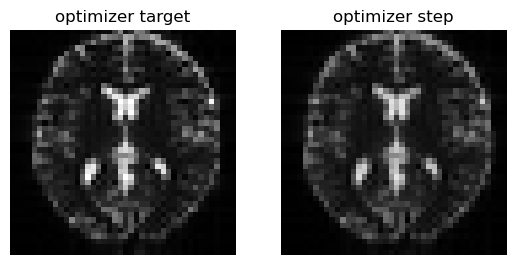

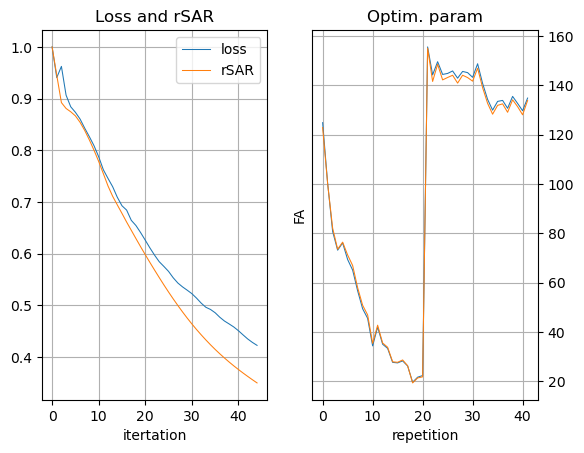

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
46 / 100: loss=0.0664195790886879, rSAR=0.343465656042099, Ref_FA=[121.57324   99.7966    83.260086  74.1521    76.95576   72.74454
  68.70828   59.332615  52.38      48.395805  36.59069   43.645374
  36.26439   34.52859   28.442049  28.230082  29.299244  26.705097
  19.39506   21.309853  21.534655 154.33197  139.0961   147.24051
 140.1539   141.36308  142.4002   138.79727  142.59181  140.99026
 140.30179  144.84418  137.63548  130.7533   126.85518  130.20468
 130.96199  127.587585 132.62476  129.94673  126.756775 132.3115  ]


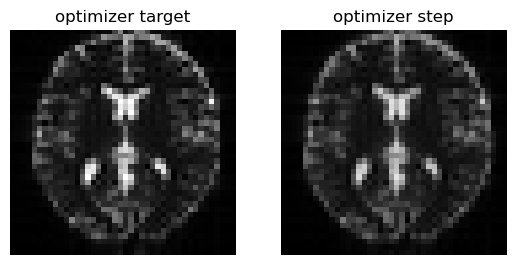

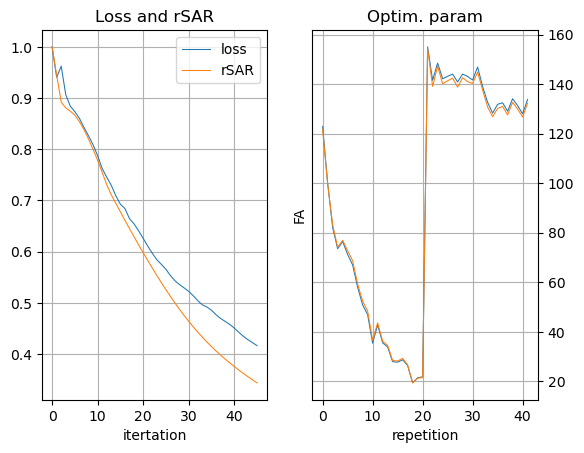

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
47 / 100: loss=0.06558794528245926, rSAR=0.3376789391040802, Ref_FA=[120.83407   99.3773    84.01717   74.90994   77.72127   73.91891
  70.2572    60.715504  53.93825   49.814487  37.86226   44.564156
  37.063934  35.34696   29.087706  28.857447  30.016922  27.188347
  19.569736  21.36487   21.377756 153.41663  136.9504   145.7185
 138.4029   139.45537  140.81557  136.77504  141.0489   138.92664
 138.98778  142.66762  136.46376  128.59785  125.624855 128.55531
 129.33072  126.34206  131.02008  128.52301  125.82213  130.32855 ]


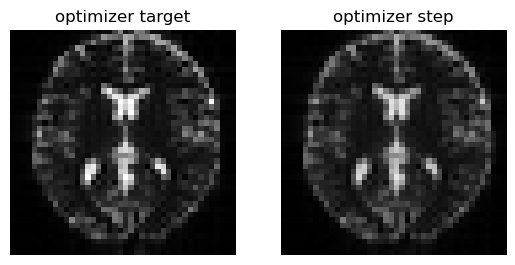

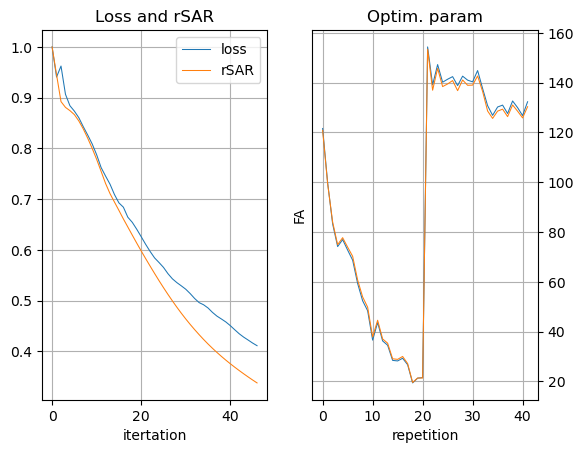

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
48 / 100: loss=0.06497471034526825, rSAR=0.3322589099407196, Ref_FA=[119.97971   99.251656  84.316505  75.74138   78.77635   74.83075
  71.63086   62.160522  55.497383  51.2024    39.218967  45.553673
  38.01163   36.31542   29.895605  29.637005  30.85659   27.843246
  19.936102  21.566452  21.40945  152.3872   135.0316   144.1095
 136.80476  137.6205   139.18849  134.97672  139.35835  137.0934
 137.62122  140.58015  135.37338  126.44422  124.51193  126.9907
 127.66046  125.30095  129.32999  127.25785  124.91876  128.42056 ]


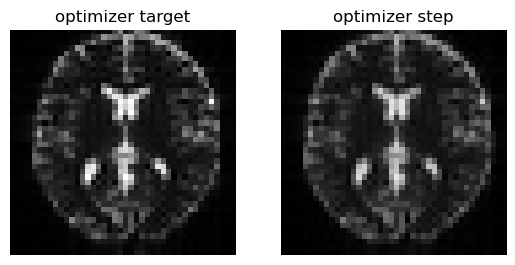

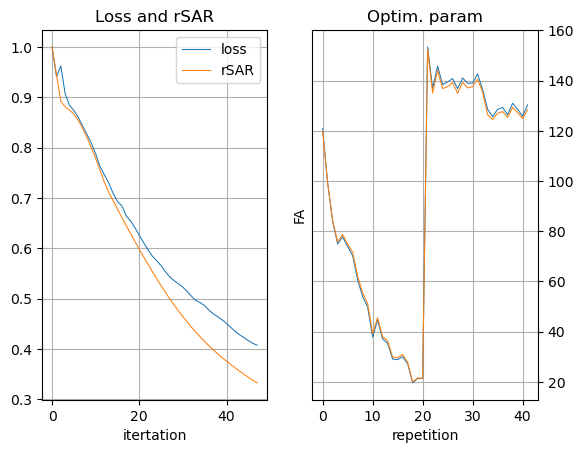

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
49 / 100: loss=0.06408087909221649, rSAR=0.3271227478981018, Ref_FA=[118.60705   99.59713   84.22392   76.56185   80.03675   75.546135
  72.8272    63.65086   56.99985   52.54458   40.640453  46.593254
  39.090973  37.41688   30.845556  30.546862  31.785515  28.66109
  20.479994  21.897911  21.62163  151.28566  133.21631  142.51077
 135.20549  135.94913  137.42131  133.41756  137.50085  135.47867
 136.16179  138.63397  134.2386   124.42248  123.39919  125.520515
 125.99316  124.36848  127.576614 126.21519  123.80557  126.9793  ]


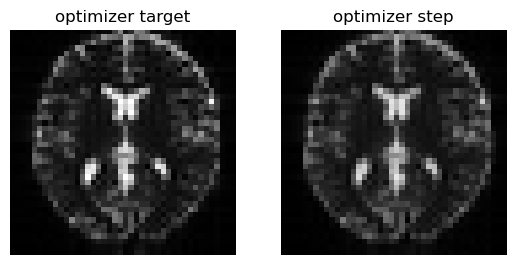

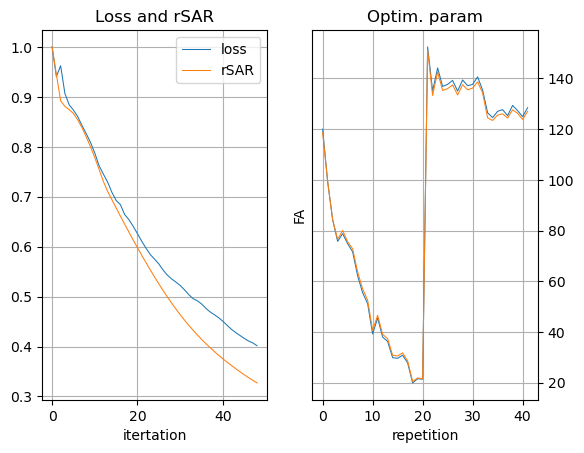

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
50 / 100: loss=0.062849260866642, rSAR=0.32201048731803894, Ref_FA=[116.7231   100.270706  83.93091   77.324265  81.34734   76.11683
  73.85128   65.15437   58.39721   53.824867  42.09724   47.660645
  40.27042   38.62005   31.911604  31.561928  32.773518  29.623474
  21.180105  22.33943   21.999605 150.08083  131.43239  140.86905
 133.54599  134.36224  135.48204  131.99927  135.45023  133.99504
 134.54773  136.79108  132.95178  122.53002  122.18247  124.08767
 124.30501  123.43056  125.75507  125.310585 122.432335 126.02324 ]


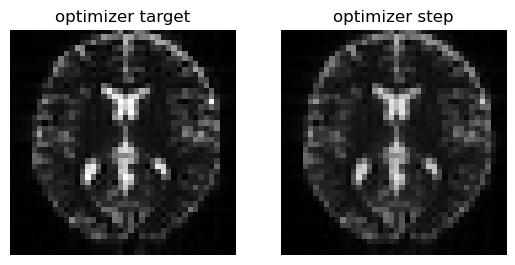

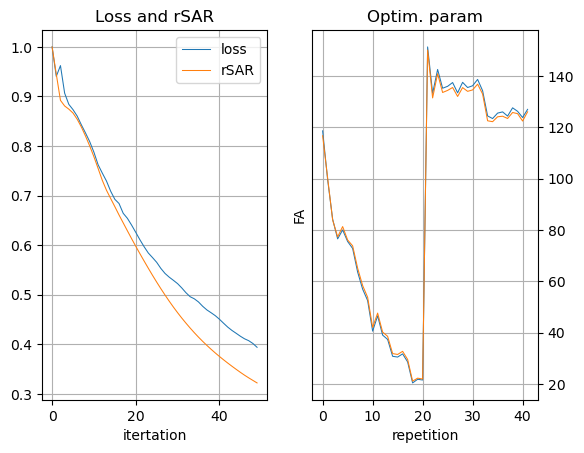

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
51 / 100: loss=0.061760514974594116, rSAR=0.31676650047302246, Ref_FA=[114.68853  100.88438   83.681274  78.02613   82.531685  76.56863
  74.7119    66.62508   59.654778  55.02347   43.550472  48.73155
  41.508026  39.884045  33.06123   32.656036  33.793365  30.705246
  22.008627  22.869778  22.52227  148.75131  129.72508  139.0502
 131.94745  132.68372  133.4664   130.61462  133.20634  132.60625
 132.72536  135.03285  131.47372  120.71907  120.83469  122.652756
 122.57126  122.42685  123.90981  124.3714   120.994934 125.19844 ]


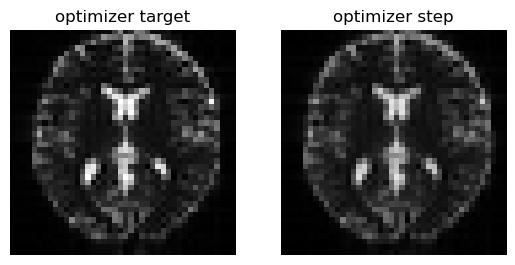

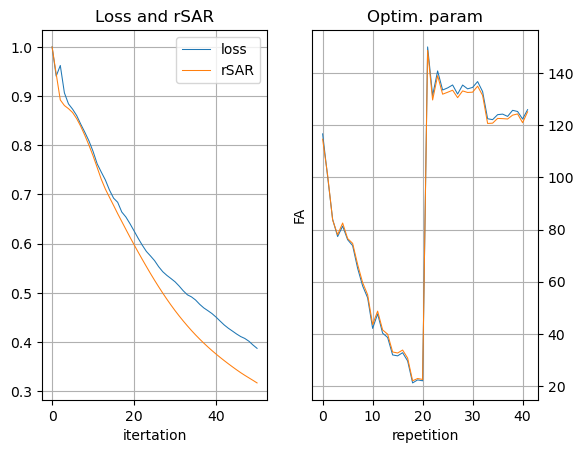

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
52 / 100: loss=0.06089618057012558, rSAR=0.3115406930446625, Ref_FA=[113.05057  100.991554  83.68721   78.709595  83.415726  76.877754
  75.392136  67.97964   60.765747  56.12444   44.915306  49.77856
  42.77329   41.1593    34.2766    33.786377  34.878536  31.844185
  22.930305  23.508522  23.152418 147.35777  128.2589   136.9452
 130.69934  130.76276  131.59683  129.2254   130.8617   131.3456
 130.75972  133.37926  129.89436  118.9876   119.41226  121.26564
 120.84273  121.34642  122.21639  123.22789  119.83844  124.02409 ]


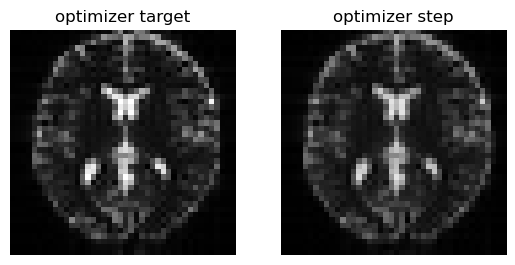

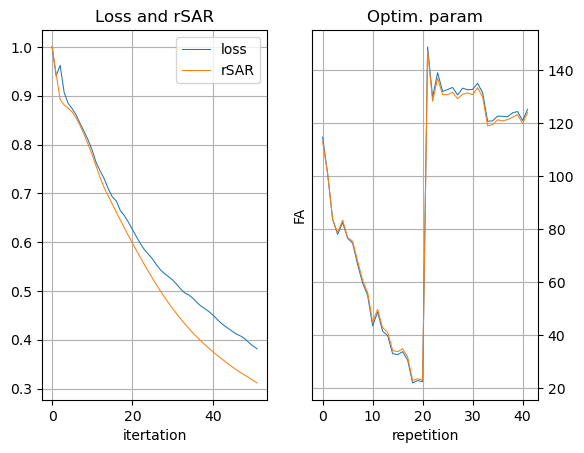

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
53 / 100: loss=0.05999390035867691, rSAR=0.3063349723815918, Ref_FA=[111.819214 100.52677   84.00266   79.37517   83.9668    77.07191
  75.908295  69.18685   61.729782  57.136295  46.180058  50.76843
  44.046955  42.421227  35.529797  34.93884   35.988464  33.016052
  23.939894  24.228651  23.86429  145.973    126.94281  134.64244
 129.71661  128.65344  129.86337  127.796036 128.50854  130.11638
 128.75343  131.77907  128.24008  117.3562   117.901985 119.918976
 119.16138  120.14952  120.70323  121.88484  118.95259  122.51209 ]


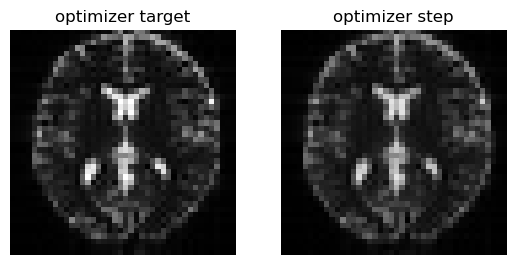

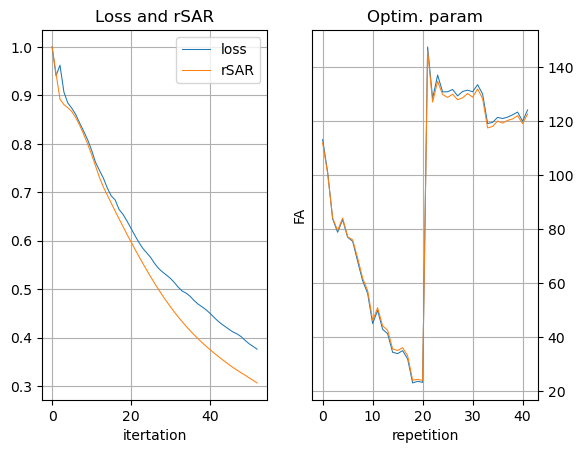

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
54 / 100: loss=0.05913824588060379, rSAR=0.3011574447154999, Ref_FA=[110.85907   99.529076  84.57678   80.02745   84.216064  77.17115
  76.26593   70.215065  62.558064  58.073257  47.33901   51.675663
  45.31453   43.64442   36.79269   36.099228  37.08915   34.200535
  25.026527  25.002031  24.634865 144.6762   125.665474 132.26404
 128.86665  126.46163  128.20853  126.32851  126.22448  128.82784
 126.81721  130.1769   126.54249  115.84637  116.29678  118.60411
 117.571075 118.81082  119.36732  120.408844 118.232925 120.793144]


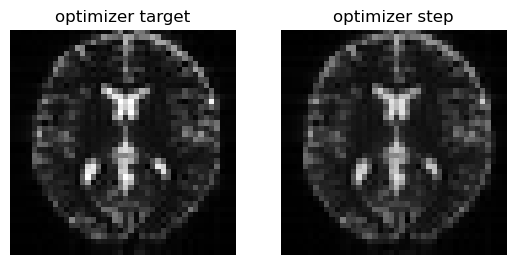

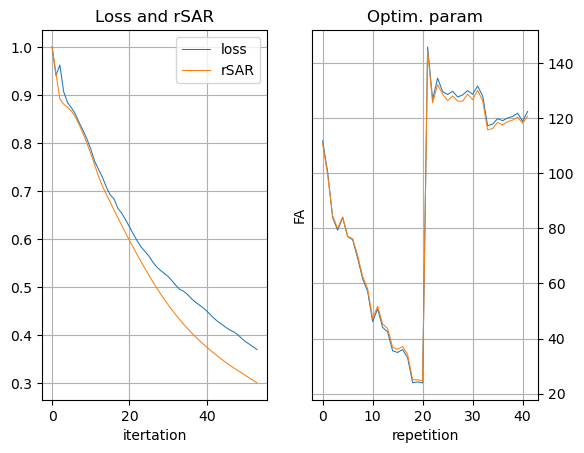

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
55 / 100: loss=0.05837361514568329, rSAR=0.29601773619651794, Ref_FA=[109.9816    98.12147   85.28252   80.664345  84.24613   77.196625
  76.46507   71.03136   63.270927  58.951294  48.390553  52.488003
  46.566544  44.8026    38.03519   37.25561   38.154533  35.380363
  26.171944  25.800253  25.444662 143.5278   124.33523  129.92007
 128.02734  124.2922   126.5679   124.84359  124.05649  127.42168
 125.03048  128.53418  124.82657  114.468414 114.6029   117.311005
 116.10121  117.327385 118.1865   118.88051  117.55458  119.03069 ]


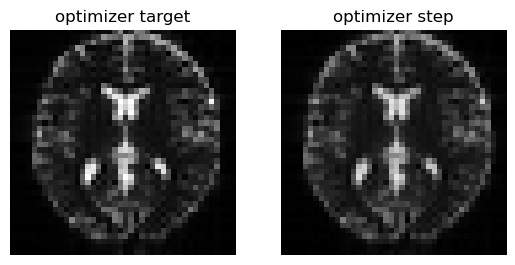

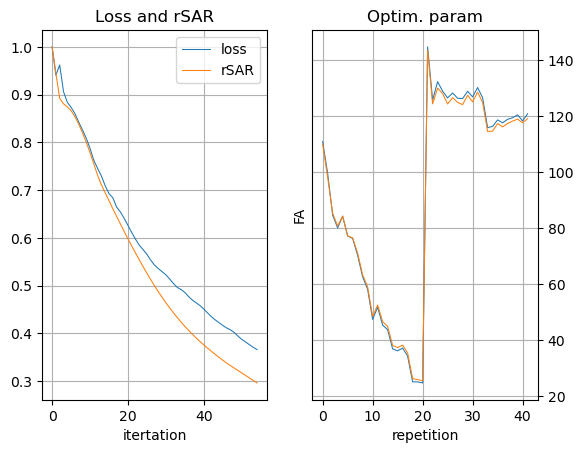

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
56 / 100: loss=0.0577966570854187, rSAR=0.29092881083488464, Ref_FA=[109.029755  96.4698    85.96079   81.26357   84.17881   77.162766
  76.51701   71.61198   63.882133  59.778557  49.33304   53.216908
  47.79713   45.87396   39.221416  38.390762  39.17017   36.54102
  27.35411   26.594576  26.274418 142.55927  122.89642  127.68893
 127.11139  122.22428  124.89566  123.36091  122.02997  125.87141
 123.43279  126.837746 123.107    113.22009  112.84201  116.02689
 114.76668  115.71607  117.13552  117.36115  116.82987  117.35252 ]


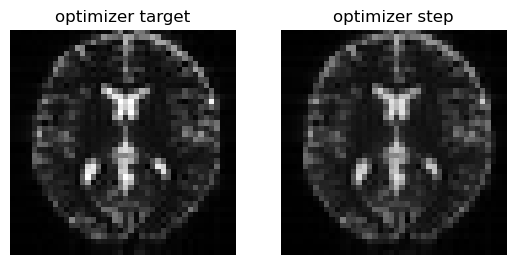

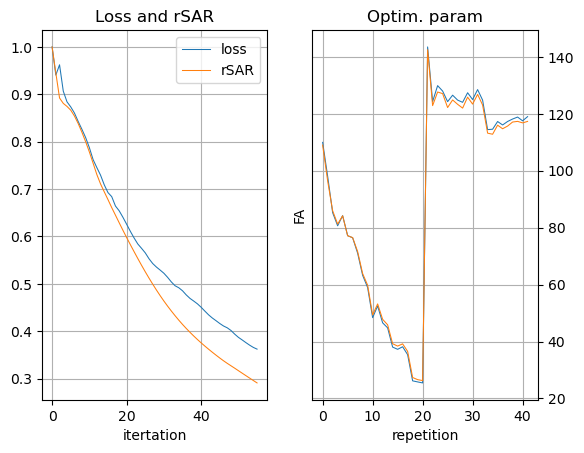

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
57 / 100: loss=0.057138700038194656, rSAR=0.2858556807041168, Ref_FA=[107.892555  94.74387   86.46624   81.79679   84.062035  77.076164
  76.47917   71.90412   64.335724  60.546463  50.122635  53.90659
  48.915855  46.828064  40.355907  39.454334  40.167236  37.61603
  28.522224  27.409866  27.146143 141.77089  121.31012  125.61713
 126.05211  120.292076 123.17166  121.87183  120.15397  124.16962
 122.0084   125.094604 121.37987  112.07475  111.048935 114.72722
 113.55901  114.004425 116.19318  115.88111  116.020996 115.83951 ]


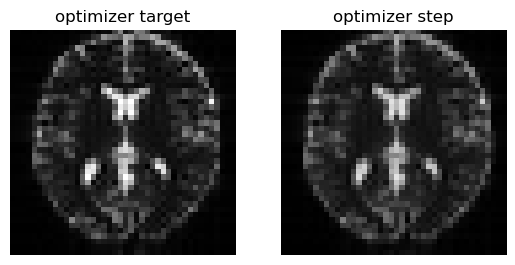

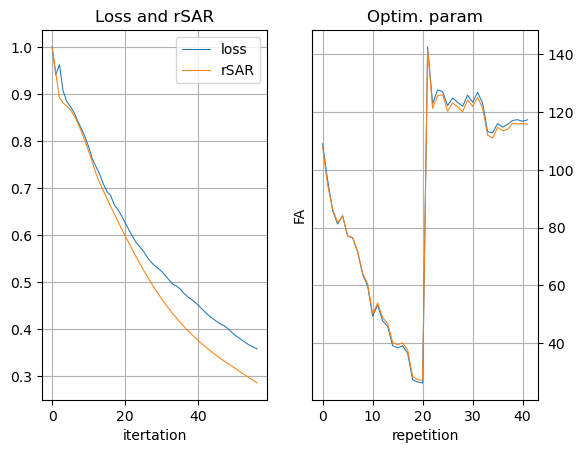

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
58 / 100: loss=0.05652579665184021, rSAR=0.28082507848739624, Ref_FA=[106.51138   93.1121    86.674255  82.266464  83.875786  77.07987
  76.207275  71.95387   64.69658   61.27805   50.716457  54.483833
  49.932613  47.718887  41.446274  40.435974  41.06479   38.55213
  29.650932  28.24199   28.08296  141.15158  119.59524  123.72495
 124.83113  118.5366   121.3825   120.39156  118.4414   122.33244
 120.75107  123.33055  119.65084  111.01991  109.27463  113.41003
 112.46016  112.259735 115.31962  114.472626 115.114395 114.53866 ]


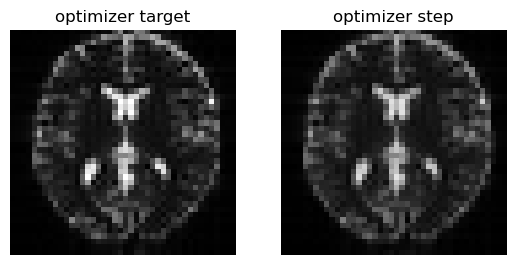

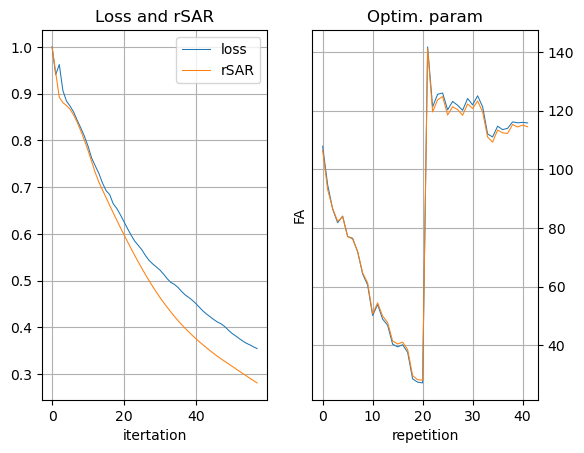

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
59 / 100: loss=0.05592818558216095, rSAR=0.2758637070655823, Ref_FA=[104.87917   91.701675  86.522896  82.66285   83.58685   77.28442
  75.61742   71.794106  65.02213   61.98292   51.101727  54.90344
  50.85795   48.59614   42.499397  41.32848   41.805367  39.307953
  30.72284   29.08744   29.102842 140.68077  117.79236  122.001526
 123.45843  116.97752  119.52145  118.93189  116.89632  120.38252
 119.637924 121.57926  117.91846  110.03662  107.57452  112.06746
 111.44538  110.55354  114.46972  113.15568  114.12262  113.453804]


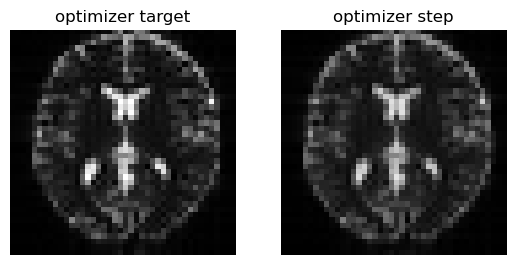

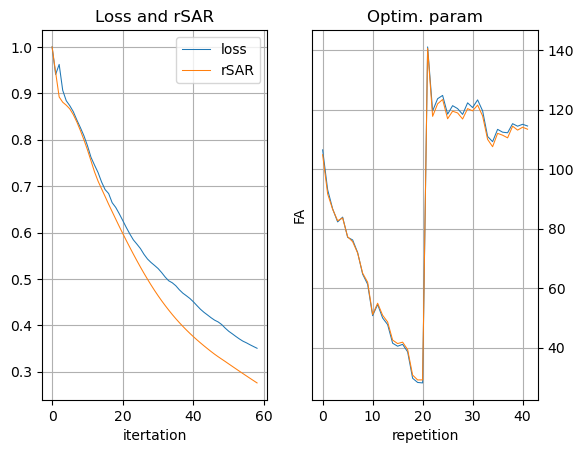

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
60 / 100: loss=0.055338673293590546, rSAR=0.27098923921585083, Ref_FA=[103.04843   90.57358   86.01882   82.9655    83.17193   77.734924
  74.706     71.44604   65.35655   62.643867  51.301292  55.1564
  51.69823   49.49052   43.520187  42.134758  42.366158  39.857994
  31.725645  29.93984   30.211454 140.3378   115.94814  120.4095
 121.96632  115.60963  117.58619  117.4997   115.51085  118.34283
 118.63397  119.87222  116.17607  109.096664 106.002335 110.68094
 110.486084 108.95303  113.59014  111.94072  113.077995 112.53835 ]


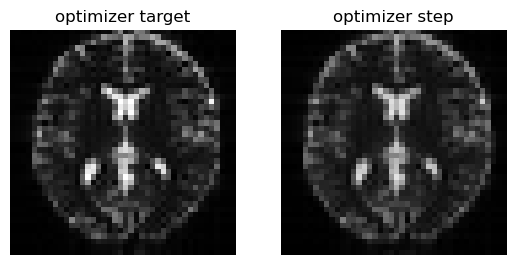

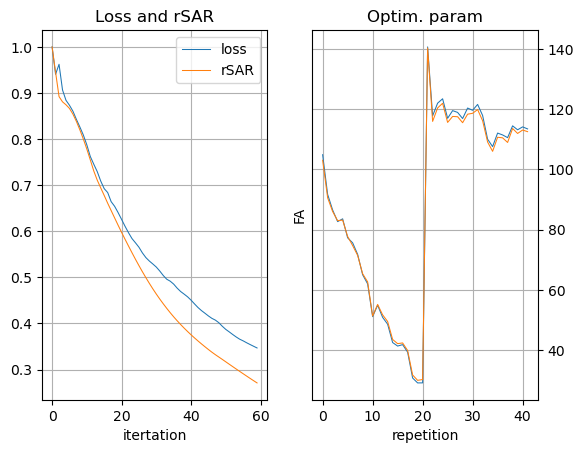

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
61 / 100: loss=0.05498132109642029, rSAR=0.26621338725090027, Ref_FA=[101.13402   89.715     85.22995   83.14729   82.64461   78.400024
  73.55014   70.9287    65.726715  63.21479   51.37222   55.268528
  52.45064   50.406307  44.511658  42.8713    42.760956  40.19232
  32.649963  30.786951  31.398006 140.10672  114.10584  118.89352
 120.40613  114.40158  115.58313  116.097534 114.26432  116.238205
 117.696144 118.23463  114.417145 108.163704 104.605705 109.22438
 109.55359  107.51625  112.6215   110.83272  112.02689  111.696495]


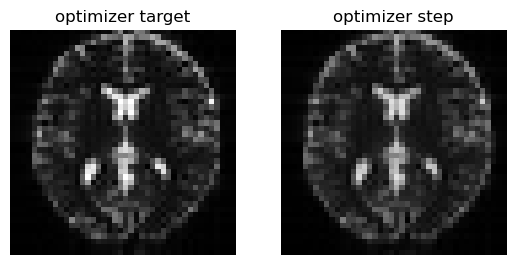

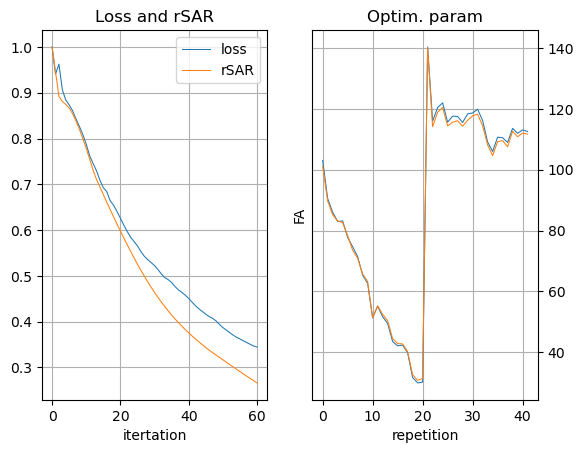

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
62 / 100: loss=0.05421197786927223, rSAR=0.26141878962516785, Ref_FA=[ 99.25554   89.175644  84.25766   83.06037   82.55943   78.85857
  72.7624    70.263885  65.94871   63.604706  51.57981   55.513023
  53.04898   51.20786   45.40216   43.522213  43.074005  40.51516
  33.539963  31.58432   32.523937 139.94196  112.13079  117.46294
 118.671326 113.29561  113.47515  114.65364  113.061226 114.056526
 116.71174  116.6279   112.59187  107.153404 103.34158  107.6067
 108.61563  106.20559  111.386536 109.94011  110.7797   110.873375]


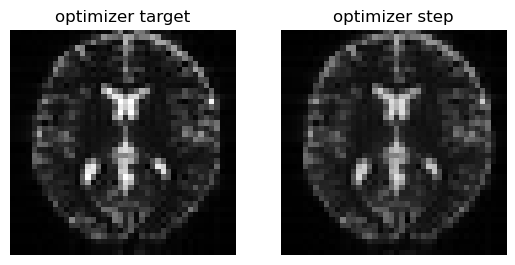

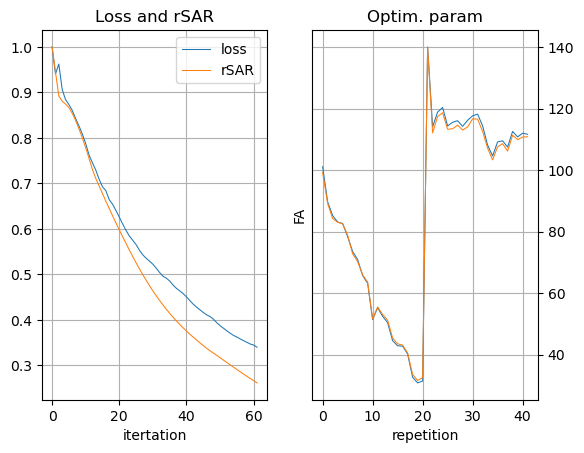

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
63 / 100: loss=0.05354101210832596, rSAR=0.25661030411720276, Ref_FA=[ 97.58758   88.65858   83.267334  82.78265   82.80599   79.006676
  72.370766  69.54342   65.994896  63.76351   51.908005  55.882526
  53.48497   51.911133  46.145573  44.113377  43.31255   40.781033
  34.38039   32.343082  33.580814 139.79832  110.11784  116.03126
 116.8775   112.21665  111.32383  113.178314 111.861465 111.87484
 115.62959  115.08104  110.72843  106.04532  102.22211  105.86498
 107.648796 105.03968  109.9122   109.220406 109.44115  109.93507 ]


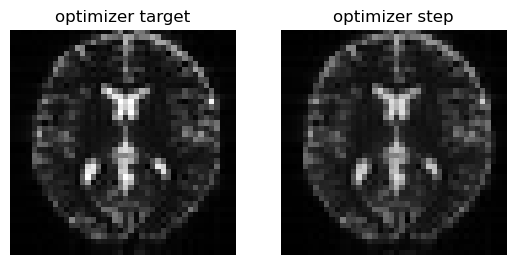

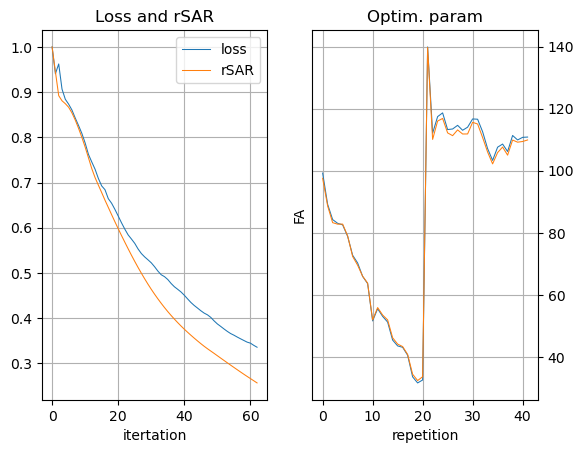

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
64 / 100: loss=0.052984852343797684, rSAR=0.251819372177124, Ref_FA=[ 96.24406   87.919106  82.376656  82.397736  83.23289   78.80824
  72.315445  68.85204   65.849464  63.66897   52.32523   56.349777
  53.757645  52.527435  46.713776  44.665485  43.48651   40.95524
  35.165554  33.072346  34.563766 139.6365   108.168594 114.53195
 115.135345 111.10927  109.20256  111.68549  110.643265 109.77875
 114.415054 113.62472  108.873276 104.83579  101.24483  104.0715
 106.63839  104.0214   108.270226 108.62799  108.105545 108.80401 ]


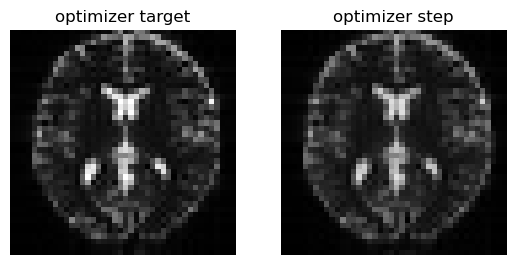

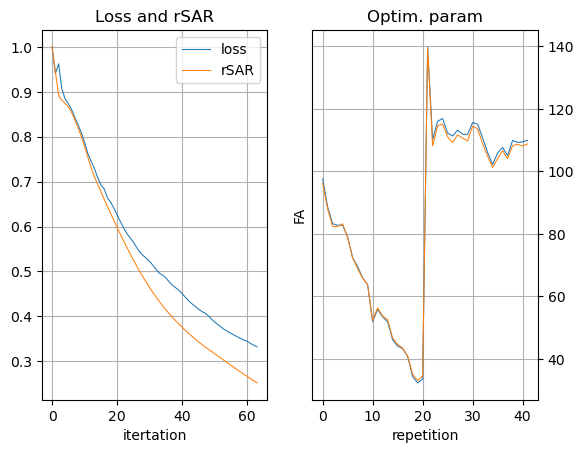

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
65 / 100: loss=0.052535541355609894, rSAR=0.24709266424179077, Ref_FA=[ 95.22879   86.82482   81.63273   81.96895   83.70791   78.2839
  72.494064  68.2477    65.51184   63.33084   52.79085   56.874634
  53.877186  53.05929   47.103996  45.181217  43.612156  41.024815
  35.89367   33.775356  35.468727 139.42874  106.37033  112.931076
 113.52518  109.948364 107.181274 110.18682  109.403244 107.84672
 113.05142  112.283195 107.081825 103.53357  100.38953  102.32058
 105.57683  103.134155 106.563805 108.12074  106.829025 107.48866 ]


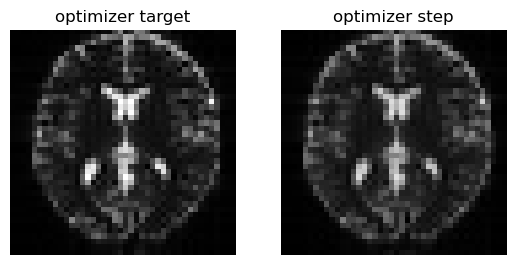

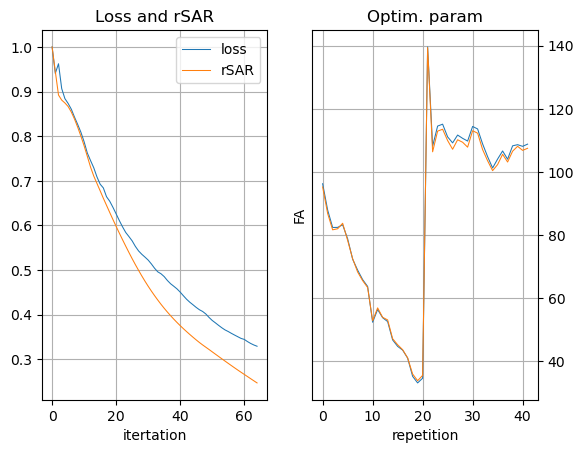

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
66 / 100: loss=0.05275064706802368, rSAR=0.2424902617931366, Ref_FA=[ 94.42364   85.385666  81.018906  81.52118   84.15134   77.51028
  72.79299   67.75859   64.998726  62.789368  53.262936  57.42429
  53.86089   53.49752   47.334927  45.645195  43.708866  41.002754
  36.563183  34.44037   36.289394 139.1657   104.779564 111.23375
 112.08528  108.74299  105.313934 108.69404  108.15298  106.13787
 111.5436   111.06957  105.40883  102.16191   99.62124  100.71108
 104.46517  102.34744  104.90865  107.666595 105.619545 106.08929 ]


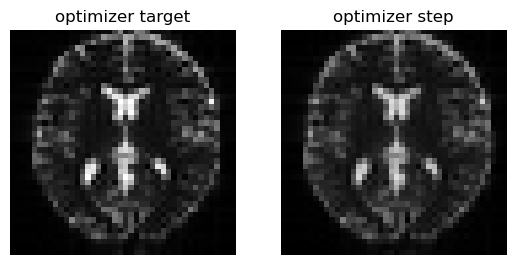

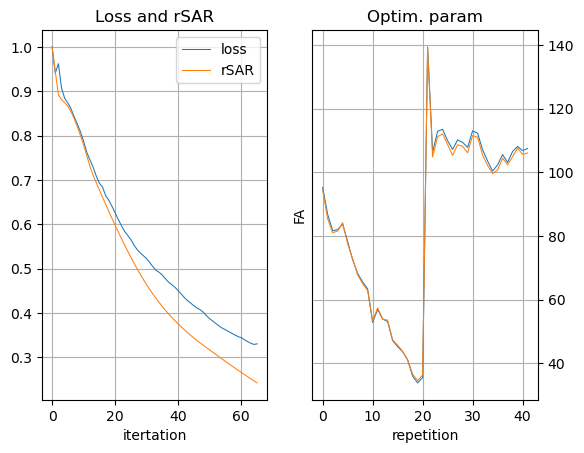

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
67 / 100: loss=0.05239216238260269, rSAR=0.23800888657569885, Ref_FA=[ 93.63493   84.03372   80.47159   80.92945   84.64006   76.67278
  73.14404   67.35143   64.35238   62.0933    53.73312   57.917477
  53.72731   53.707085  47.53858   45.944046  43.81711   41.021355
  37.143208  35.001877  37.057323 138.82733  103.513306 109.294174
 110.90017  107.463806 103.5714   107.19949  106.88534  104.633446
 109.87052  109.97439  103.84767  100.68816   98.90472   99.30321
 103.21084  101.63815  103.44206  107.052704 104.6029   104.63967 ]


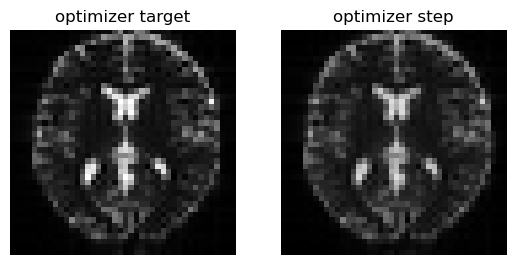

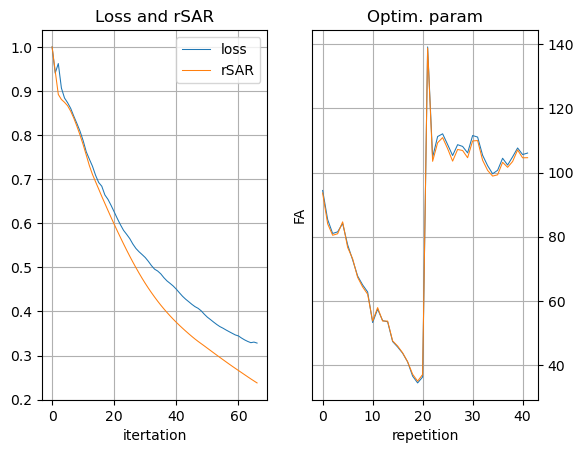

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
68 / 100: loss=0.052089668810367584, rSAR=0.2337038815021515, Ref_FA=[ 92.64197   82.858574  79.95887   80.265564  85.06804   75.92686
  73.47324   67.04631   63.615982  61.33205   54.19695   58.343475
  53.540806  53.709473  47.761406  46.057735  43.95741   41.07474
  37.66096   35.465355  37.74024  138.42465  102.53171  107.20354
 109.90331  106.16424  101.96767  105.70909  105.6212   103.33515
 108.0856   108.97145  102.42444   99.167496  98.19021   98.14148
 101.84976  100.96823  102.2242   106.28452  103.72201  103.3048  ]


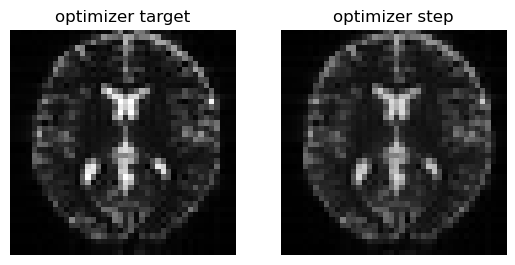

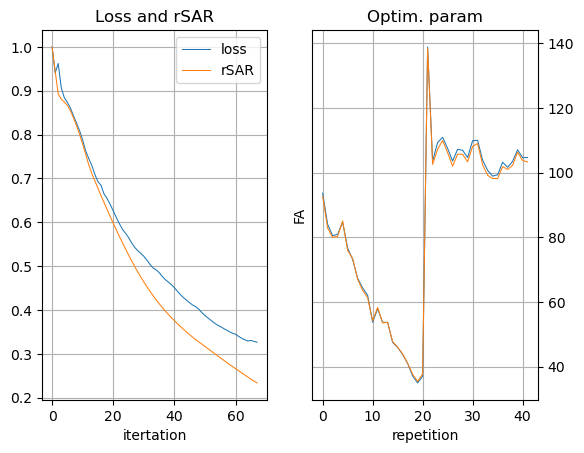

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
69 / 100: loss=0.051823802292346954, rSAR=0.22963422536849976, Ref_FA=[ 91.314896  81.92361   79.45651   79.61068   85.31446   75.40738
  73.74137   66.85173   62.840298  60.59298   54.651684  58.698193
  53.36741   53.541416  48.040947  45.983883  44.14328   41.1655
  38.135983  35.839508  38.317303 137.97617  101.78315  105.06424
 109.01746  104.89825  100.51741  104.22929  104.37948  102.23509
 106.25828  108.024925 101.15965   97.66313   97.44077   97.23601
 100.439224 100.31466  101.27396  105.38795  102.94045  102.18838 ]


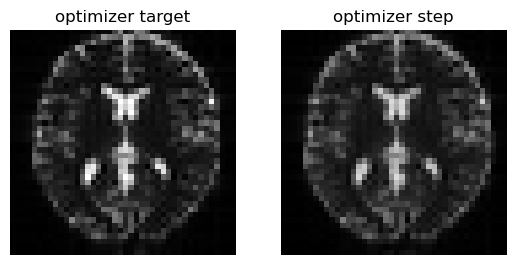

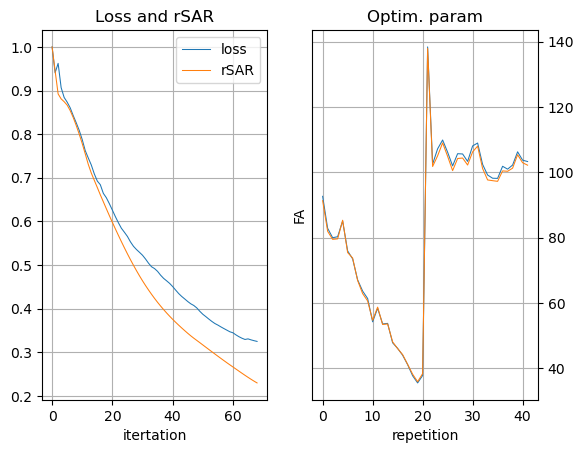

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
70 / 100: loss=0.05159791186451912, rSAR=0.22584660351276398, Ref_FA=[ 89.70414   81.24472   78.95681   79.03464   85.29147   75.20003
  73.942116  66.767715  62.080685  59.949127  55.09137   58.977848
  53.263897  53.248592  48.397392  45.7402    44.37582   41.30388
  38.57773   36.13454   38.781445 137.50233  101.21881  102.96305
 108.168045 103.70651   99.23634  102.7543   103.171585 101.31985
 104.45588  107.08377  100.07619   96.22646   96.62074   96.57124
  99.04814   99.652626 100.574745 104.400826 102.25628  101.26923 ]


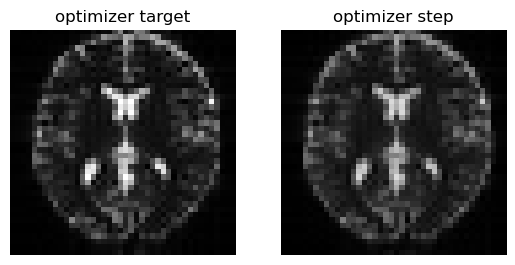

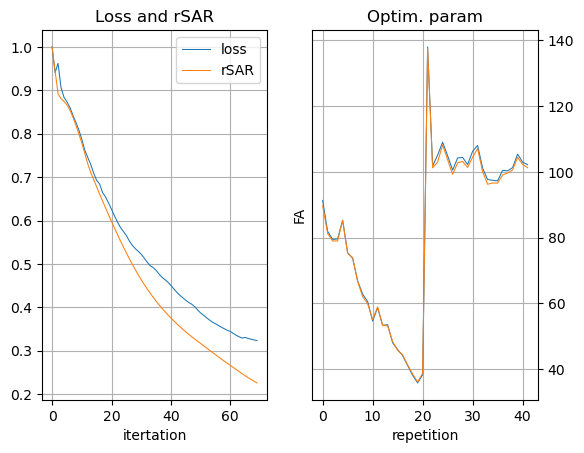

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
71 / 100: loss=0.05142511427402496, rSAR=0.22236694395542145, Ref_FA=[ 88.03104   80.78884   78.47342   78.588684  84.97471   75.32671
  74.09207   66.78103   61.396294  59.456253  55.50304   59.17863
  53.267807  52.87899   48.82995   45.359856  44.653343  41.496822
  38.9879    36.358902  39.13837  137.0302   100.78583  100.969925
 107.279785 102.61954   98.13229  101.26444  102.00367  100.5656
 102.739426 106.08046   99.19795   94.89335   95.688324  96.1105
  97.7555    98.94086  100.081764 103.37413  101.68863  100.40859 ]


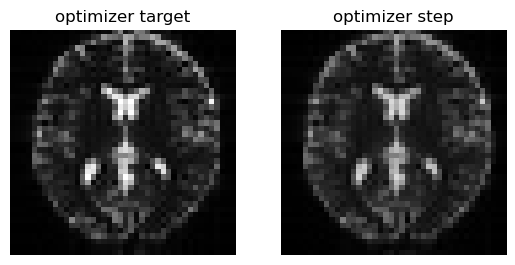

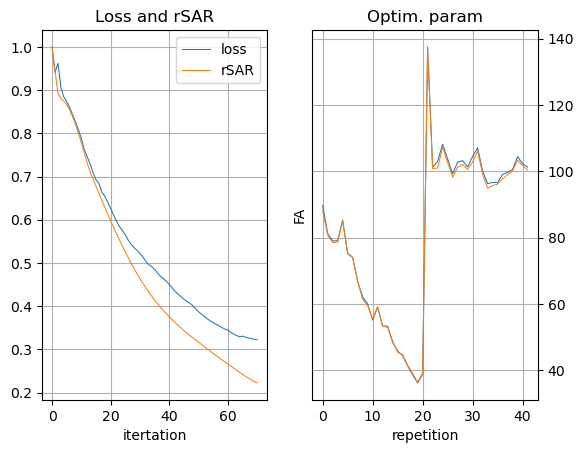

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
72 / 100: loss=0.05129849165678024, rSAR=0.2191666215658188, Ref_FA=[ 86.60375   80.47356   78.00698   78.29378   84.38392   75.74543
  74.183716  66.87402   60.863144  59.1013    55.82359   59.33415
  53.31364   52.588753  49.1436    45.0037    44.892014  41.714478
  39.351974  36.501633  39.448803 136.5924   100.41446   99.154625
 106.259605 101.67008   97.191444  99.73394  100.87573   99.93686
 101.15434  104.94724   98.53403   93.6833    94.60546   95.79372
  96.63982   98.13199   99.720436 102.37101  101.24993   99.413345]


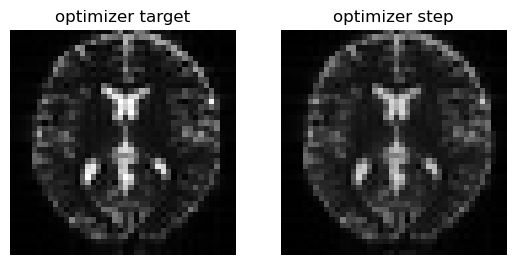

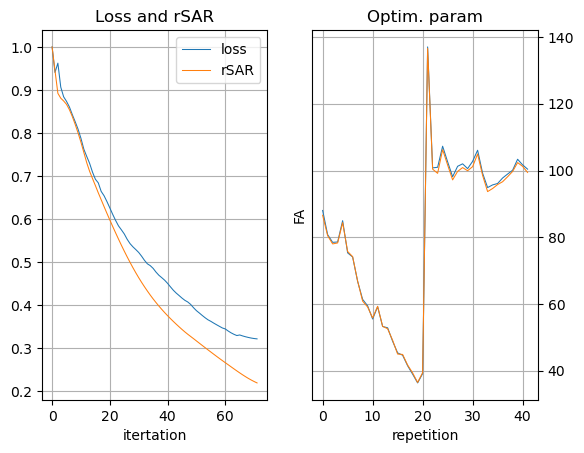

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
73 / 100: loss=0.05116526782512665, rSAR=0.21624405682086945, Ref_FA=[ 85.54456   80.23766   77.59508   78.140976  83.61854   76.363594
  74.25145   67.03811   60.510414  58.931755  56.011913  59.39584
  53.435184  52.412594  49.35566   44.67098   45.07102   41.94047
  39.682854  36.58531   39.72206  136.2255   100.04134   97.5659
 105.06546  100.87073   96.39295   98.17236   99.787315  99.38832
  99.757645 103.65732   98.0479    92.63849   93.38457   95.53943
  95.76583   97.2192    99.42442  101.450836 100.92038   98.22164 ]


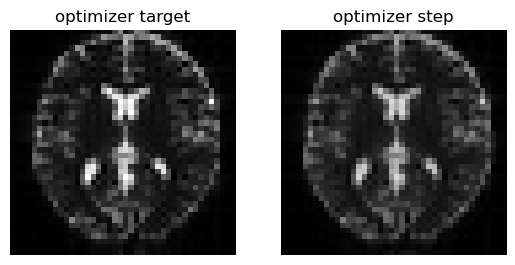

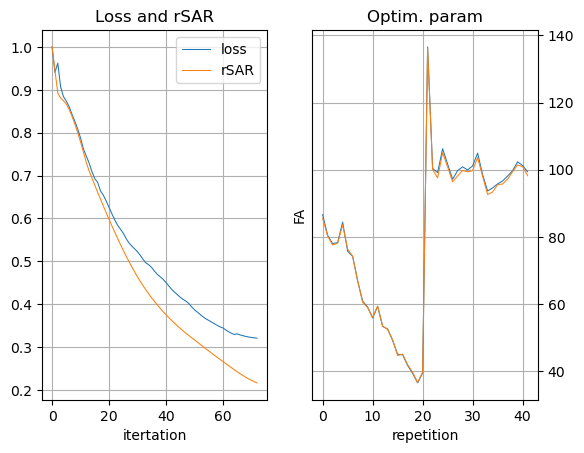

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
74 / 100: loss=0.05104219168424606, rSAR=0.21359722316265106, Ref_FA=[ 84.73452   80.032684  77.27204   78.101364  82.812805  77.06035
  74.333496  67.263145  60.357975  58.972195  56.03689   59.330486
  53.649776  52.370426  49.48566   44.36009   45.172913  42.159718
  39.991375  36.62882   39.96836  135.95067   99.63008   96.22481
 103.70261  100.215775  95.71278   96.62193   98.729904  98.88505
  98.58728  102.24049   97.6644    91.8006    92.091034  95.269295
  95.15174   96.24821   99.1499   100.64328  100.65581   96.92147 ]


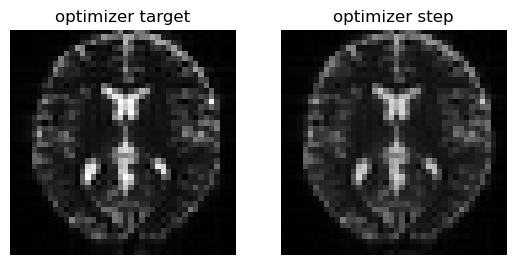

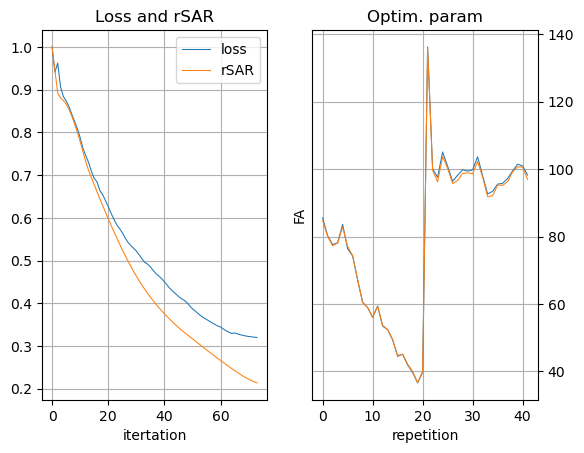

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
75 / 100: loss=0.0509457029402256, rSAR=0.21121945977210999, Ref_FA=[ 83.92696   79.80958   77.06746   78.13607   82.11601   77.71125
  74.45542   67.54008   60.417248  59.22068   55.87966   59.13144
  53.95366   52.467594  49.548344  44.07451   45.18756   42.355938
  40.285473  36.649597  40.193787 135.77014   99.1788    95.118385
 102.2163    99.68238   95.13142   95.13744   97.69074   98.40676
  97.6563   100.76035   97.2981    91.19448   90.81525   94.92783
  94.77088   95.29117   98.88169   99.94606  100.40661   95.67831 ]


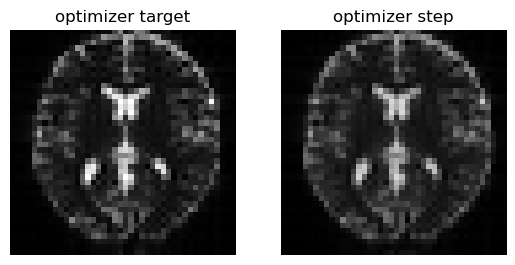

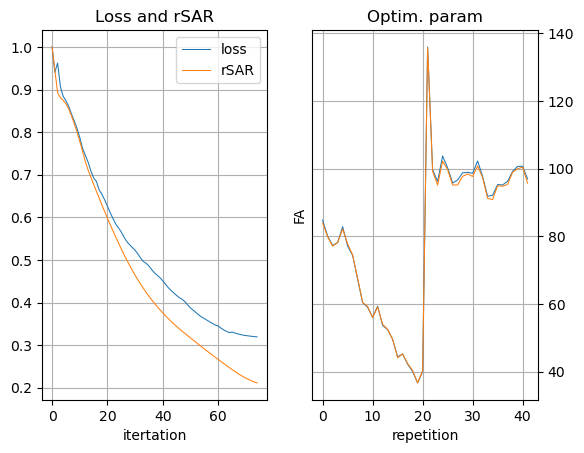

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
76 / 100: loss=0.051211826503276825, rSAR=0.20909525454044342, Ref_FA=[ 82.951645  79.530716  76.98335   78.21225   81.66921   78.20766
  74.62232   67.86316   60.688698  59.652912  55.544228  58.81216
  54.32057   52.695286  49.55952   43.822147  45.106125  42.51664
  40.569714  36.66022   40.402073 135.67976   98.69931   94.20873
 100.668335  99.23725   94.63071   93.76367   96.66019   97.937294
  96.955376  99.283356  96.87843   90.81689   89.63919   94.48157
  94.57685   94.40953   98.613914  99.34735  100.14007   94.60523 ]


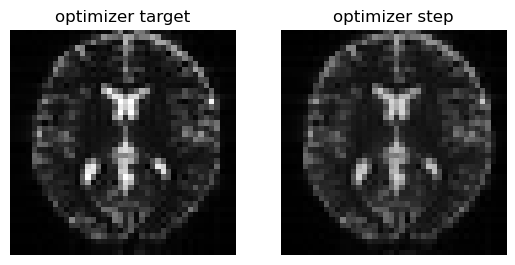

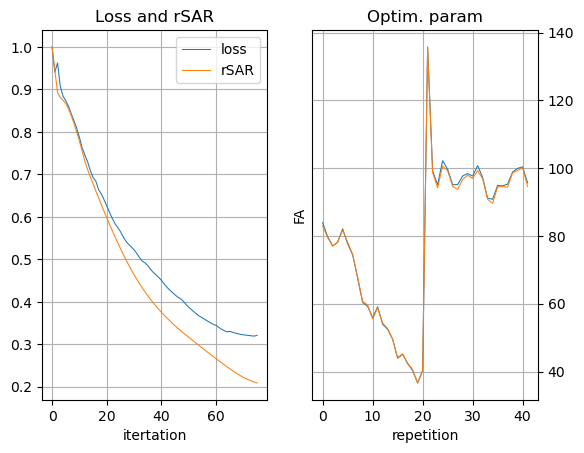

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
77 / 100: loss=0.05130070447921753, rSAR=0.20740382373332977, Ref_FA=[ 81.94693   79.173676  76.99886   78.34816   81.59263   78.49631
  74.804115  68.2283    61.18154   60.125748  55.116714  58.499355
  54.68872   52.950844  49.48233   43.61941   45.02371   42.661465
  40.731525  36.64476   40.54619  135.76808   98.37398   93.388306
  99.24477   98.946556  94.20748   92.594406  95.77931   97.49578
  96.512505  97.96372   96.47427   90.62345   88.68468   94.18125
  94.33386   93.869576  98.28961   98.93903   99.8078    93.64443 ]


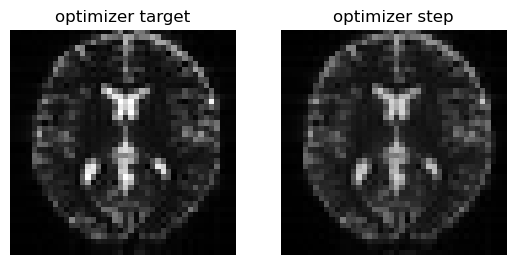

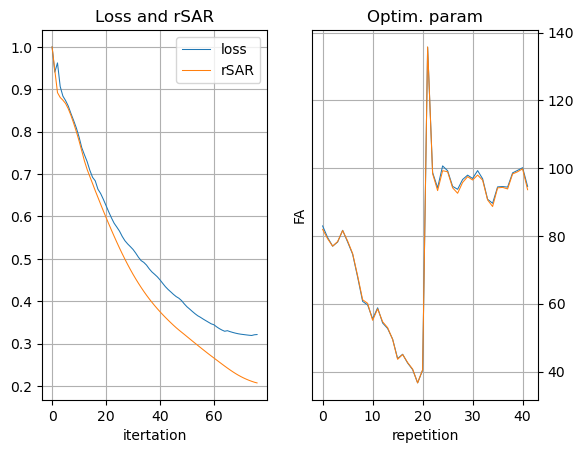

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
78 / 100: loss=0.05135960876941681, rSAR=0.2061629593372345, Ref_FA=[ 81.250244  78.76414   77.092285  78.5423    81.94528   78.56856
  75.00888   68.61252   61.903557  60.58367   54.64802   58.23295
  55.031403  53.2201    49.31507   43.497696  44.95027   42.791706
  40.77436   36.61029   40.6326   136.0636    98.18201   92.609344
  98.01478   98.764305  93.8393    91.65649   95.05318   97.05725
  96.29576   96.862595  96.05425   90.56134   88.0195    94.01298
  94.01847   93.686905  97.86507   98.788246  99.3869    92.64972 ]


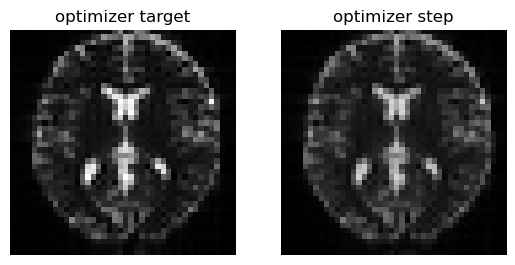

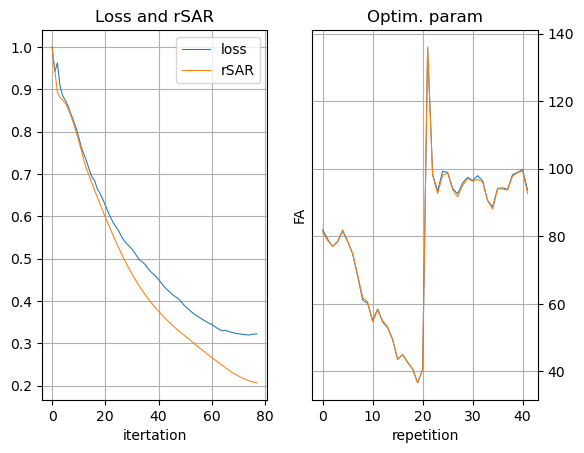

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
79 / 100: loss=0.051347486674785614, rSAR=0.20535023510456085, Ref_FA=[ 80.96795   78.34097   77.241974  78.8011    82.677795  78.46209
  75.23451   68.99477   62.822685  60.98461   54.19219   58.042717
  55.324127  53.48638   49.061905  43.479618  44.89429   42.906586
  40.70568   36.563465  40.66792  136.55441   98.10231   91.84474
  97.02082   98.63585   93.52418   90.96201   94.45947   96.62146
  96.25267   96.02966   95.58434   90.581764  87.6933    93.94471
  93.62761   93.832634  97.35866   98.89795   98.86202   91.591805]


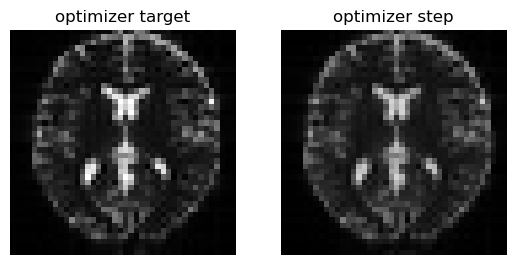

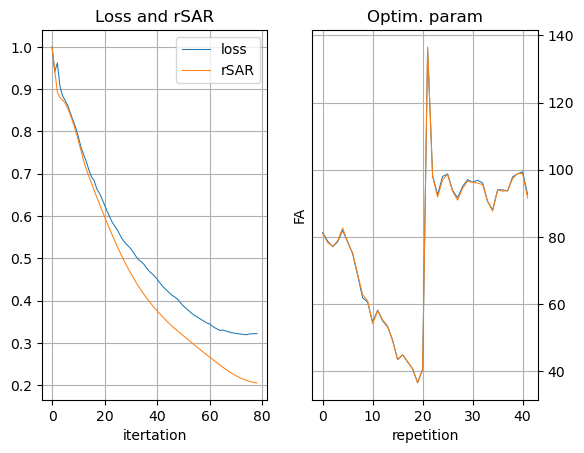

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
80 / 100: loss=0.051309555768966675, rSAR=0.20490314066410065, Ref_FA=[ 80.89877   77.952835  77.43433   79.1371    83.64757   78.250305
  75.47265   69.35915   63.86945   61.30507   53.80243   57.94677
  55.549046  53.73088   48.732224  43.57794   44.8638    43.003574
  40.536724  36.510807  40.660057 137.1884    98.12092   91.09921
  96.25732   98.51946   93.27998   90.49921   93.95407   96.21456
  96.32528   95.478615  95.04396   90.65622   87.71073   93.93521
  93.18109   94.23652   96.84895   99.197365  98.23407   90.58444 ]


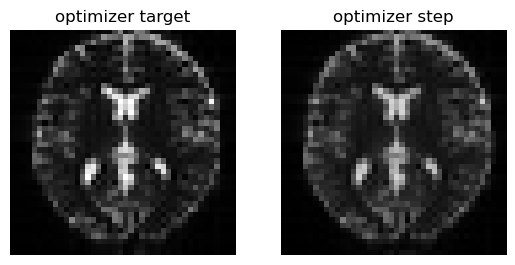

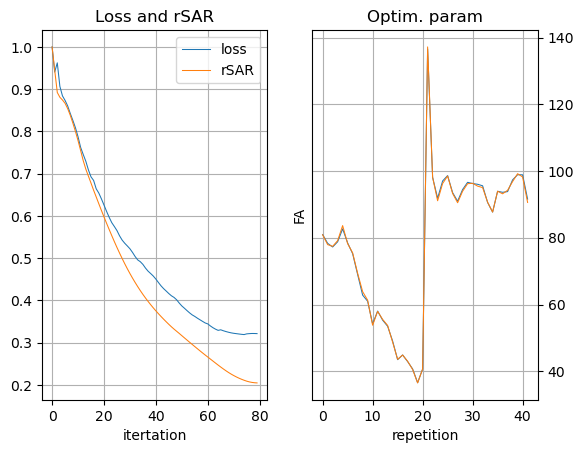

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
81 / 100: loss=0.050684623420238495, rSAR=0.20474456250667572, Ref_FA=[ 80.7276    77.64332   77.670906  79.55931   84.66325   78.025314
  75.71078   69.69647   64.95031   61.539173  53.52402   57.95595
  55.692043  53.934074  48.341785  43.796215  44.861256  43.082245
  40.280155  36.46018   40.614563 137.90208   98.22956   90.398224
  95.68294   98.39819   93.127846  90.23891   93.49361   95.87167
  96.466095  95.18787   94.436745  90.77455   88.03349   93.954704
  92.70795   94.81738   96.42601   99.58908   97.51966   89.78456 ]


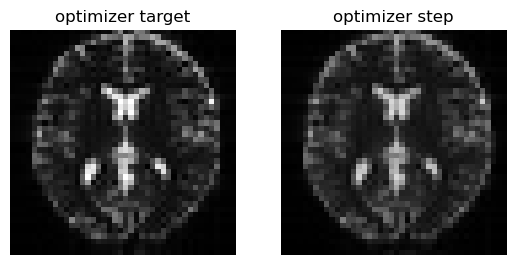

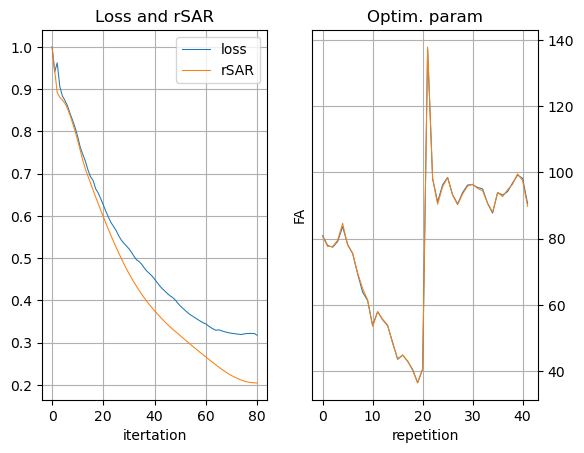

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
82 / 100: loss=0.05061203986406326, rSAR=0.20461180806159973, Ref_FA=[ 79.91171   77.35299   77.9542    80.05075   85.462105  77.88041
  75.89893   69.99402   65.93686   61.73144   53.36173   58.060574
  55.715233  54.05258   47.955555  44.071644  44.896133  43.118748
  39.971134  36.366913  40.546616 138.56898   98.286446  89.84768
  95.14971   98.20402   93.08722   90.10187   92.942825  95.609245
  96.61288   95.03377   93.71497   90.96572   88.529045  93.77882
  92.40781   95.3122    96.210045  99.857445  96.788185  89.44059 ]


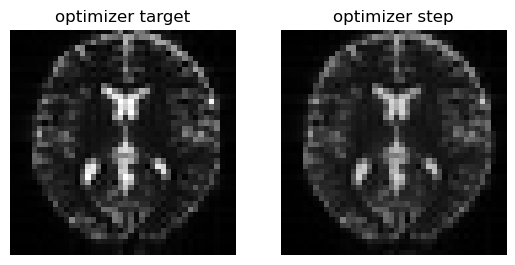

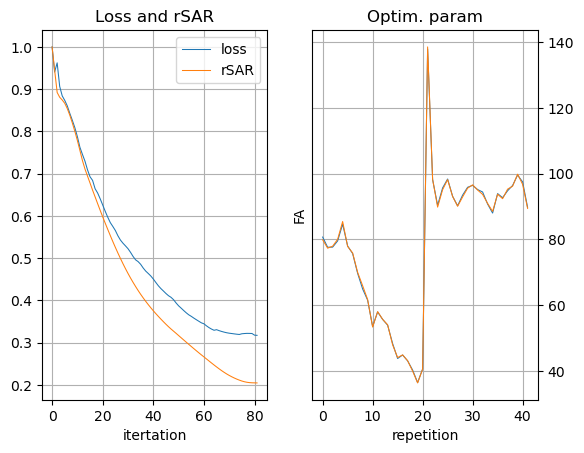

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
83 / 100: loss=0.05056586116552353, rSAR=0.20447202026844025, Ref_FA=[ 78.84054   77.10077   78.27047   80.59516   85.97152   77.8682
  76.01867   70.26775   66.741264  61.89625   53.345062  58.25186
  55.6059    54.08815   47.592495  44.387962  44.960884  43.117195
  39.623466  36.23924   40.45921  139.17114   98.27215   89.42535
  94.62927   97.93137   93.1256    90.041435  92.316696  95.40208
  96.72275   94.98885   92.91514   91.1737    89.16209   93.43223
  92.29945   95.6459    96.20922  100.02051   96.06112   89.349525]


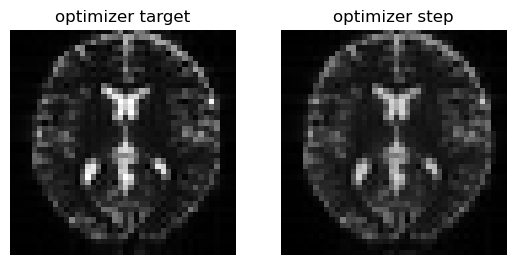

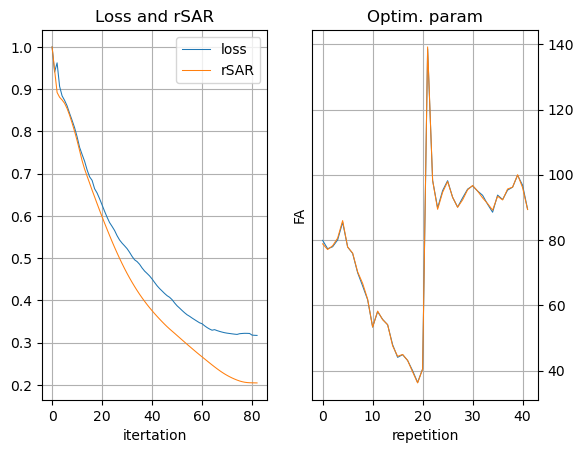

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
84 / 100: loss=0.050558902323246, rSAR=0.20428961515426636, Ref_FA=[ 78.10079   76.8992    78.589355  81.15785   86.20728   78.00372
  76.053894  70.53209   67.30458   62.052307  53.486767  58.50612
  55.36142   54.048973  47.2695    44.72774   45.044483  43.07954
  39.250015  36.08486   40.353012 139.68462   98.16648   89.088844
  94.0914    97.569824  93.196884  89.99524   91.64385   95.20028
  96.755295  95.007835  92.0881    91.31724   89.88768   92.95326
  92.39762   95.71894   96.431854 100.11124   95.36476   89.204346]


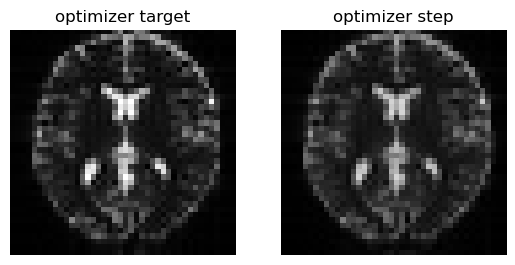

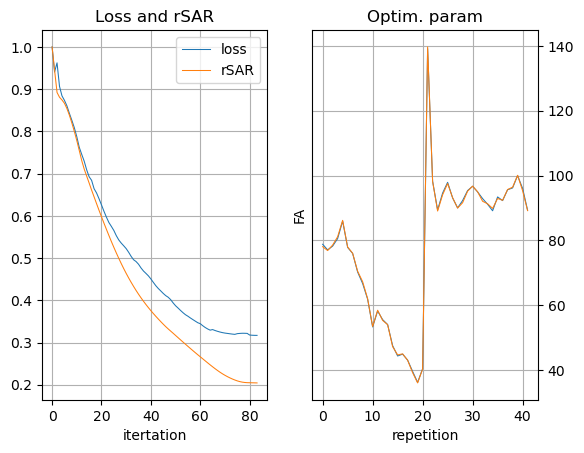

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
85 / 100: loss=0.050499312579631805, rSAR=0.20404699444770813, Ref_FA=[ 78.00958   76.76986   78.89196   81.68897   86.22376   78.27065
  76.00271   70.79942   67.59247   62.215603  53.783154  58.794525
  54.997723  53.94659   47.000042  45.07136   45.137463  43.00623
  38.865376  35.90908   40.231228 140.08252   97.988884  88.799805
  93.51722   97.13268   93.27328   89.91402   90.9627    94.97347
  96.702415  95.03695   91.30504   91.34463   90.63706   92.4248
  92.660034  95.504105  96.86816  100.14364   94.7222    88.82312 ]


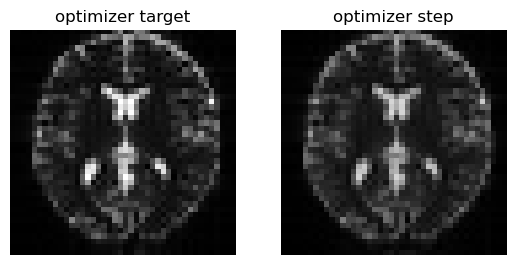

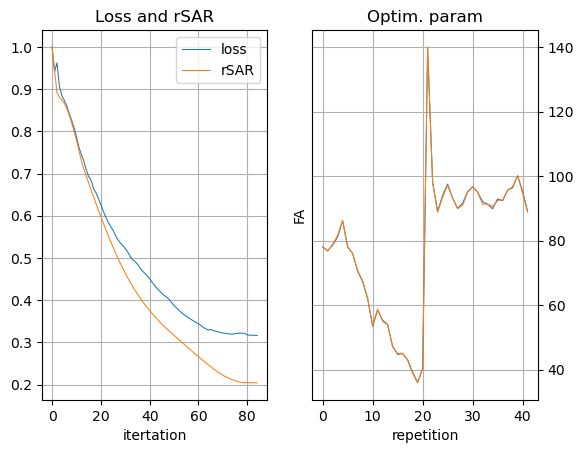

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
86 / 100: loss=0.05085780844092369, rSAR=0.2037547528743744, Ref_FA=[ 78.36481   76.74008   79.17408   82.136765  86.076     78.6366
  75.87109   71.08203   67.593216  62.397762  54.215786  59.08869
  54.54833   53.79068   46.79288   45.40204   45.232006  42.901894
  38.481533  35.71937   40.100887 140.35054   97.798195  88.54254
  92.9092    96.66241   93.35819   89.78614   90.30714   94.73784
  96.590675  95.04082   90.631454  91.27077   91.33632   91.9509
  92.99051   95.08924   97.473694 100.1064    94.147     88.27525 ]


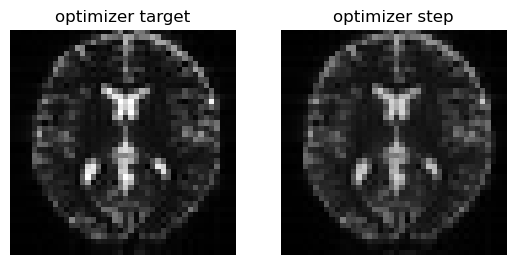

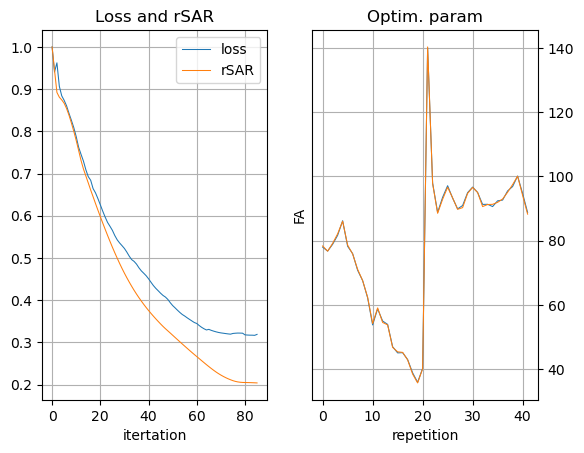

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
87 / 100: loss=0.05087747424840927, rSAR=0.2036423236131668, Ref_FA=[ 78.81247   76.831406  79.43387   82.49884   85.903984  78.97795
  75.76931   71.33911   67.37341   62.597958  54.75848   59.34479
  54.061405  53.62321   46.597908  45.782593  45.28821   42.797356
  38.05976   35.555767  39.973053 140.55757   97.59251   88.5167
  92.3173    96.220566  93.596825  89.69988   89.74548   94.57431
  96.59231   95.0257    90.18279   91.205     92.03566   91.607216
  93.33663   94.81461   98.02068  100.197624  93.63276   87.80922 ]


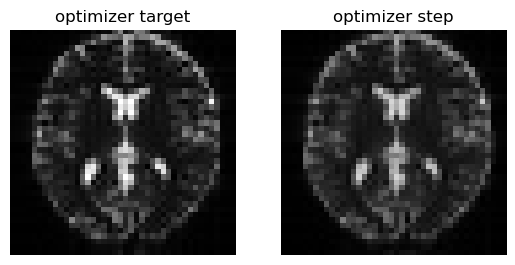

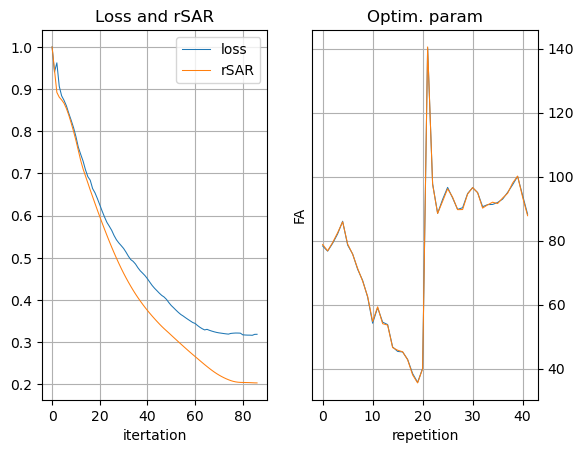

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
88 / 100: loss=0.05089937523007393, rSAR=0.2036474198102951, Ref_FA=[ 78.98518   77.05532   79.67855   82.74107   85.76859   79.24564
  75.715805  71.56164   66.97901   62.804676  55.366795  59.551044
  53.58449   53.44787   46.423225  46.18975   45.303402  42.698414
  37.613476  35.420517  39.85498  140.66821   97.40902   88.64737
  91.72199   95.83976   93.91337   89.63936   89.270645  94.48323
  96.641365  95.015495  89.910095  91.18173   92.67776   91.439255
  93.63836   94.71808   98.51273  100.35069   93.18842   87.58809 ]


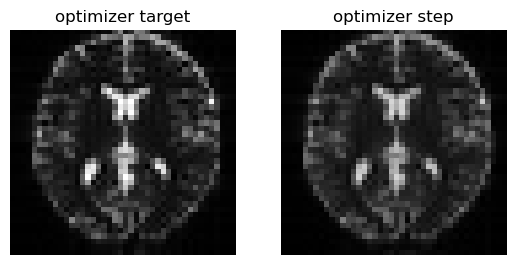

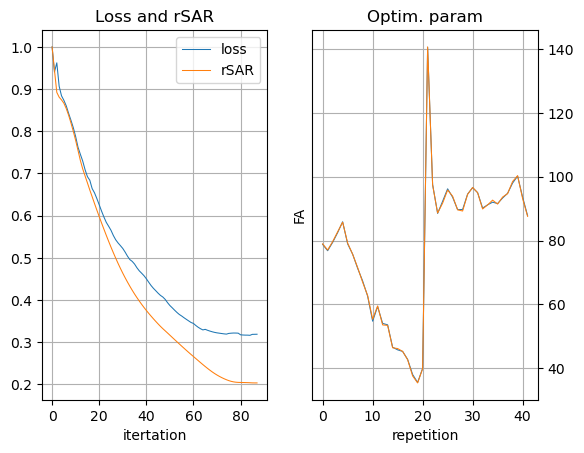

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
89 / 100: loss=0.05089239403605461, rSAR=0.2037414312362671, Ref_FA=[ 78.78949   77.39081   79.91239   82.84811   85.714966  79.40606
  75.7165    71.73236   66.47704   62.999466  55.990803  59.70164
  53.15769   53.270767  46.2744    46.599464  45.273384  42.60815
  37.15757   35.31385   39.75024  140.67303   97.27965   88.865036
  91.13703   95.54024   94.252495  89.60184   88.8947    94.449066
  96.716385  95.01824   89.791885  91.214005  93.229034  91.47082
  93.86666   94.80742   98.949425 100.53664   92.82694   87.63721 ]


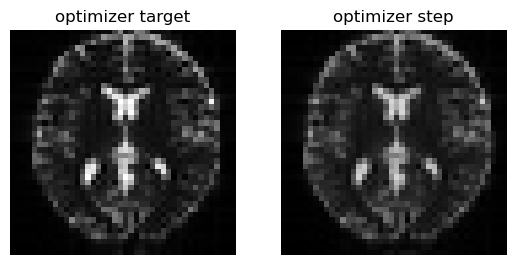

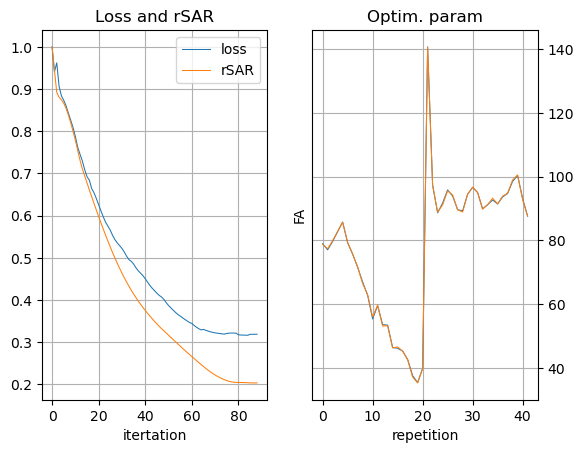

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
90 / 100: loss=0.05088377743959427, rSAR=0.2039307802915573, Ref_FA=[ 78.4394    77.785095  80.13274   82.83002   85.76106   79.44599
  75.76118   71.831215  65.94653   63.15953   56.580124  59.7959
  52.80971   53.100895  46.154785  46.988346  45.194283  42.526577
  36.70704   35.234825  39.65812  140.58916   97.233864  89.105995
  90.610214  95.33046   94.58119   89.59777   88.652214  94.43464
  96.85137   95.016045  89.841896  91.291176  93.66881   91.72016
  94.00482   95.070816  99.31558  100.77003   92.56269   87.82515 ]


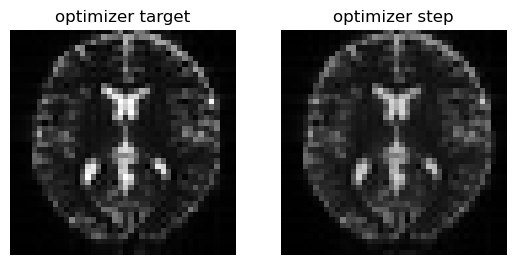

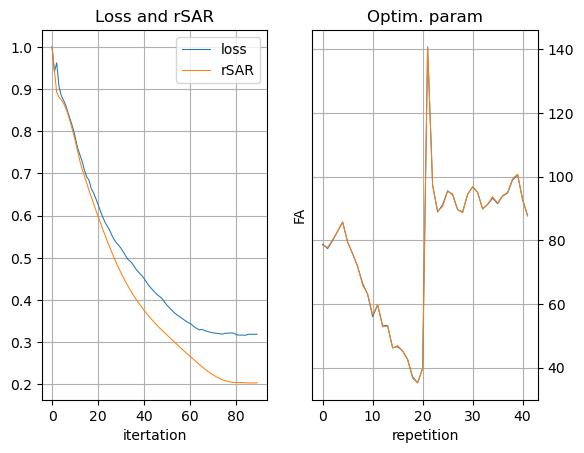

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
91 / 100: loss=0.050482168793678284, rSAR=0.20423200726509094, Ref_FA=[ 78.24436   78.16994   80.33277   82.71982   85.88739   79.370895
  75.83209   71.83838   65.46023   63.265377  57.088978  59.837444
  52.561825  52.946117  46.065067  47.335594  45.06344   42.452393
  36.276073  35.181873  39.57504  140.44788   97.29509   89.31223
  90.20464   95.210396  94.87779   89.64645   88.5785    94.40108
  97.09368   94.99121   90.07542   91.397804  93.98934   92.189384
  94.05298   95.483345  99.5956   101.077614  92.41013   87.967285]


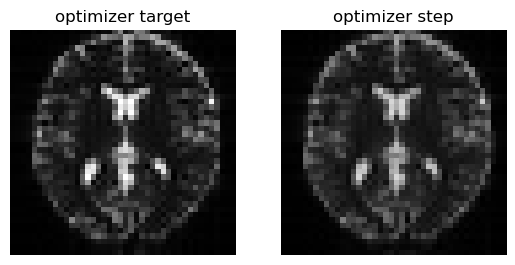

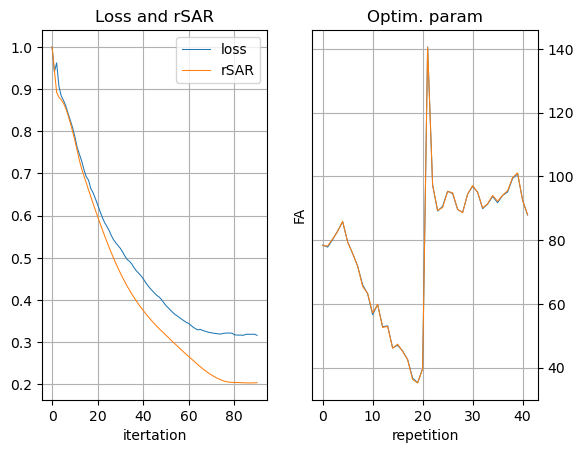

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
92 / 100: loss=0.05046136677265167, rSAR=0.20446038246154785, Ref_FA=[ 78.24663   78.53763   80.47507   82.55732   85.99889   79.246666
  75.875275  71.74335   65.08296   63.305794  57.47758   59.879974
  52.442936  52.816387  46.023952  47.61702   44.920555  42.369854
  35.884254  35.15464   39.483837 140.21298   97.50515   89.2578
  89.91463   95.157234  94.98988   89.69804   88.61197   94.31787
  97.274     94.96568   90.38546   91.47036   94.10699   92.8449
  94.023415  95.76715  100.00247  101.23154   92.38071   87.95206 ]


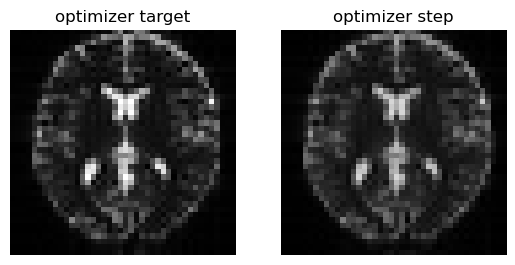

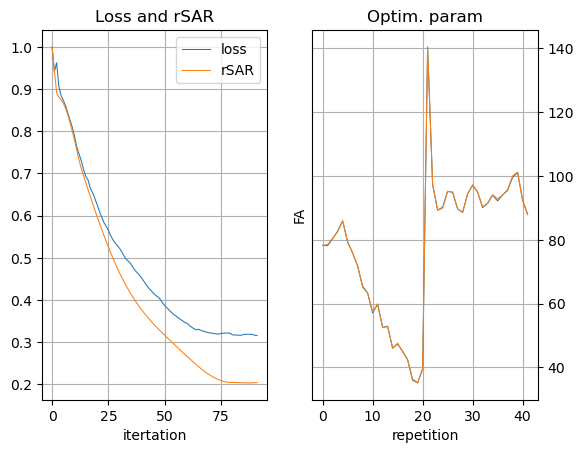

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
93 / 100: loss=0.050420649349689484, rSAR=0.2046118825674057, Ref_FA=[ 78.413826  78.85026   80.54489   82.411964  86.01191   79.09768
  75.8658    71.5592    64.85008   63.267826  57.71581   59.931442
  52.458057  52.723206  46.024303  47.820633  44.766766  42.280617
  35.538113  35.152348  39.38369  139.92029   97.81879   88.97084
  89.74508   95.15297   94.930855  89.7625    88.732254  94.19417
  97.38246   94.96545   90.72798   91.52126   94.06792   93.61859
  93.95588   95.93283  100.505    101.25346   92.46269   87.798775]


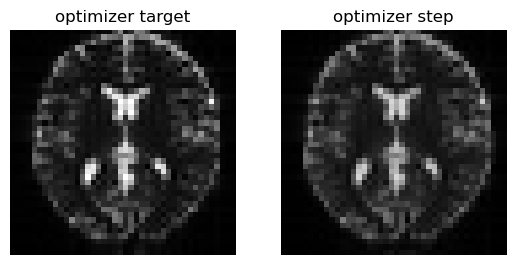

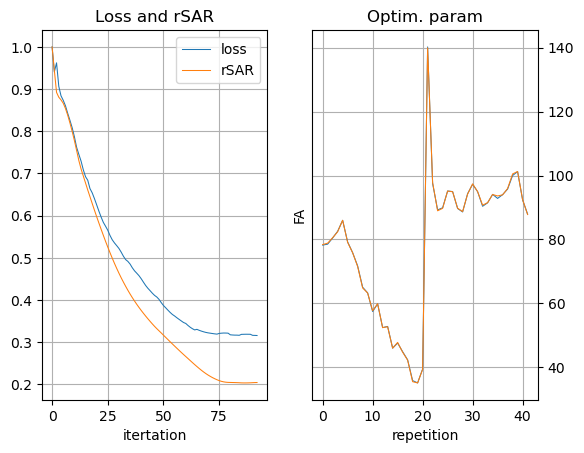

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
94 / 100: loss=0.05038883537054062, rSAR=0.20468561351299286, Ref_FA=[ 78.551765  79.083176  80.537994  82.33776   85.84768   78.94575
  75.78791   71.30587   64.7729    63.14686   57.788776  59.995808
  52.604507  52.676617  46.057762  47.9395    44.604614  42.188614
  35.24042   35.17473   39.275215 139.60818   98.17414   88.523796
  89.67733   95.17781   94.73928   89.85079   88.901794  94.05434
  97.41904   95.01167   91.053764  91.578445  93.93308   94.42554
  93.89237   96.021065 101.057755 101.16826   92.63461   87.61651 ]


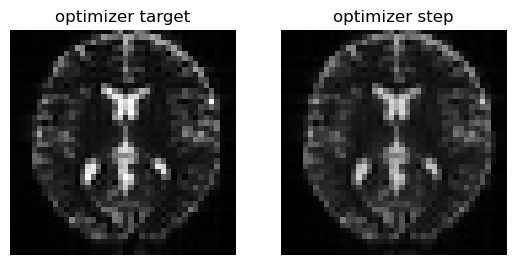

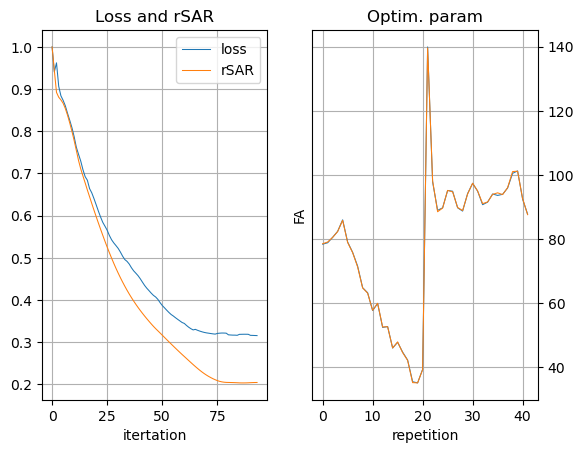

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
95 / 100: loss=0.05036685988306999, rSAR=0.20468594133853912, Ref_FA=[ 78.50388   79.22409   80.46186   82.3572    85.47419   78.80042
  75.63533   71.00954   64.83989   62.94787   57.69708   60.071987
  52.87032   52.684326  46.115597  47.972557  44.437885  42.097576
  34.991215  35.22139   39.15966  139.31068   98.50955   87.9973
  89.684616  95.20893   94.46364   89.96629   89.08413   93.92055
  97.39166   95.11255   91.32722   91.662994  93.758484  95.190575
  93.86795   96.071686 101.615486 101.0057    92.873375  87.49592 ]


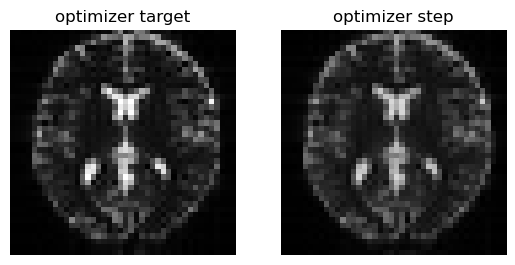

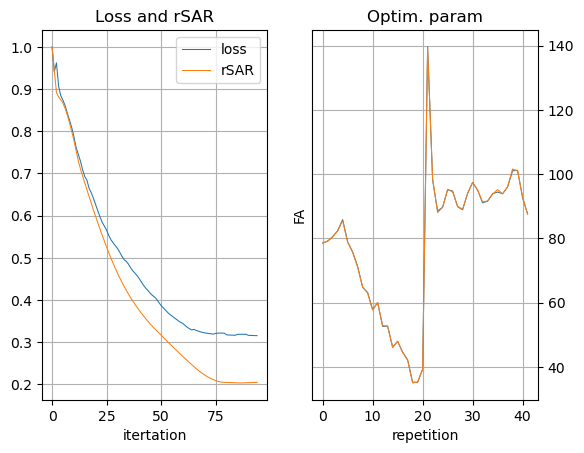

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
96 / 100: loss=0.05037093907594681, rSAR=0.20462359488010406, Ref_FA=[ 78.28949   79.27222   80.33199   82.457275  84.928246  78.65361
  75.40951   70.69989   65.02164   62.68557   57.45556   60.153225
  53.23303   52.751194  46.19105   47.923073  44.272263  42.009182
  34.788925  35.291077  39.037933 139.05959   98.76563   87.46075
  89.742455  95.21655   94.15382   90.099014  89.254265  93.802956
  97.30965   95.26387   91.53269   91.77402   93.589386  95.854706
  93.91256   96.10285  102.1362   100.806854  93.154564  87.43592 ]


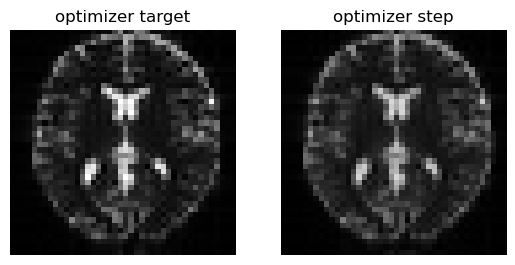

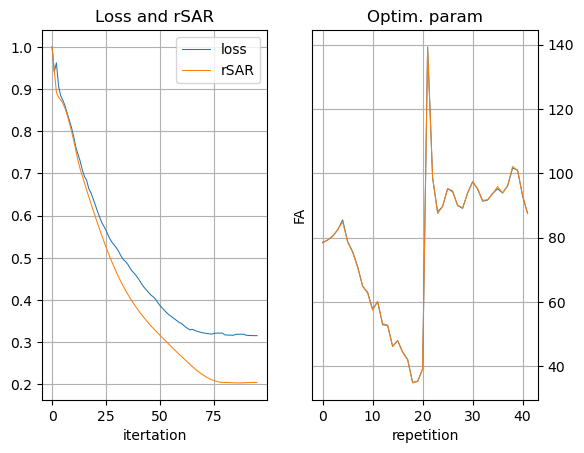

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
97 / 100: loss=0.050379760563373566, rSAR=0.20447935163974762, Ref_FA=[ 78.19065   79.15857   80.27907   82.47491   84.38589   78.43425
  75.24884   70.32353   65.19047   62.415924  57.143867  60.1779
  53.61338   52.84023   46.292072  47.758442  44.12904   41.940735
  34.622257  35.399956  38.890186 138.88417   98.86506   86.96847
  89.81352   95.15334   93.85945   90.198524  89.4061    93.68128
  97.17165   95.437225  91.672005  91.86701   93.46015   96.35151
  94.06174   96.087524 102.573586 100.628586  93.4436    87.29605 ]


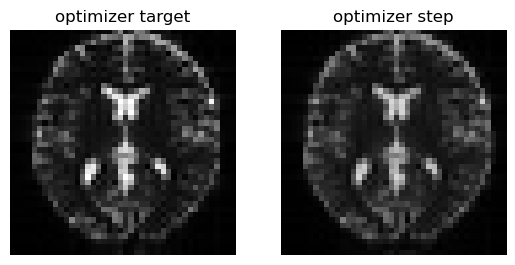

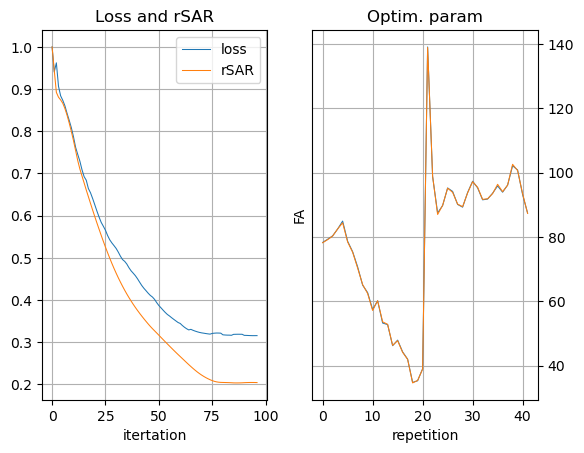

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
98 / 100: loss=0.05038073658943176, rSAR=0.20426812767982483, Ref_FA=[ 78.252594  78.92845   80.292885  82.38464   83.93017   78.13443
  75.14391   69.92149   65.30722   62.160507  56.79203   60.14343
  53.984997  52.95038   46.4145    47.497234  44.01292   41.892998
  34.48911   35.543224  38.72198  138.79744   98.774506  86.57234
  89.86676   95.0036    93.616516  90.25296   89.52218   93.5598
  96.99177   95.61445   91.750786  91.932045  93.39648   96.652565
  94.32415   96.0414   102.892075 100.51164   93.71208   87.065506]


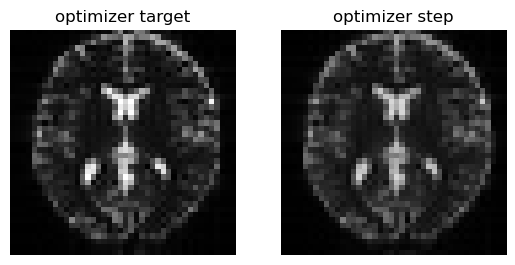

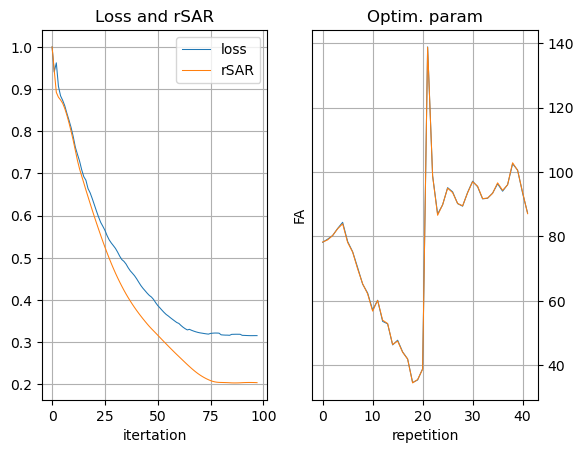

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
99 / 100: loss=0.050375066697597504, rSAR=0.20400425791740417, Ref_FA=[ 78.36299   78.64811   80.34158   82.18306   83.60531   77.76668
  75.064865  69.538925  65.33904   61.933975  56.429253  60.052402
  54.325226  53.077305  46.55385   47.16111   43.92708   41.866695
  34.38692   35.71517   38.54081  138.78853   98.50327   86.303444
  89.87263   94.77673   93.44464   90.262146  89.588806  93.44988
  96.78913   95.77897   91.780045  91.97561   93.4063    96.76256
  94.68436   95.995636 103.0785   100.467995  93.94042   86.81428 ]


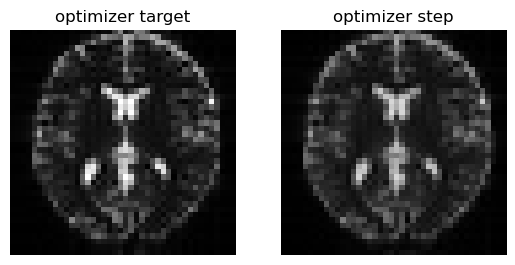

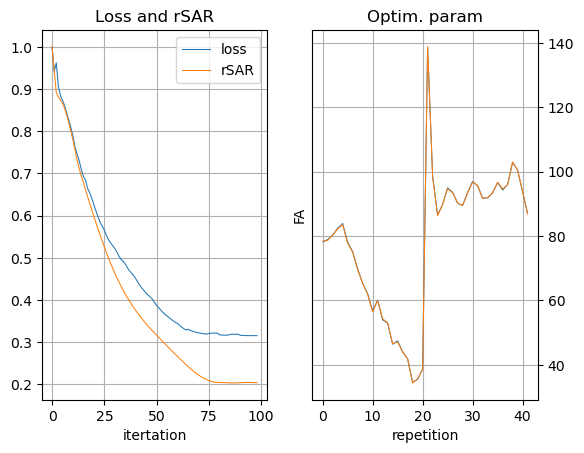

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
100 / 100: loss=0.05036251246929169, rSAR=0.20369915664196014, Ref_FA=[ 78.35553   78.38202   80.381615  81.8914    83.41132   77.36099
  74.97158   69.21543   65.26435   61.743595  56.081947  59.911137
  54.615868  53.213257  46.705566  46.773174  43.87377   41.861336
  34.313187  35.909515  38.354824 138.82967   98.09349   86.16596
  89.810875  94.497925  93.34563   90.23381   89.599556  93.362625
  96.58291   95.917564  91.7737    92.01137   93.48125   96.71234
  95.1106    95.98229  103.139496 100.48821   94.11934   86.636665]


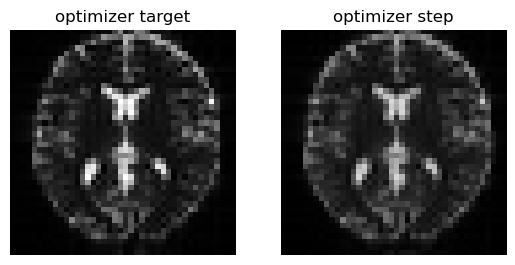

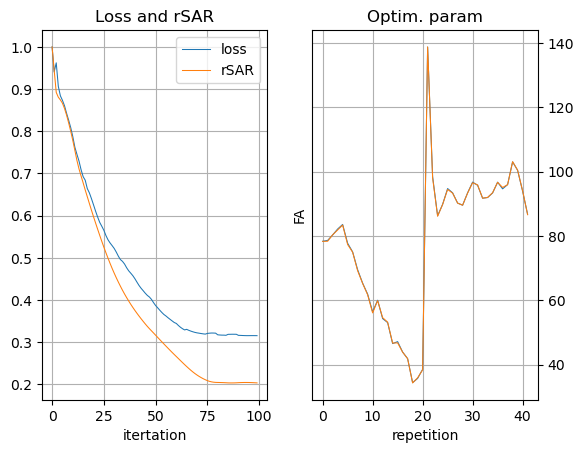

echo time set to minTE [ms] tensor([7.4000])
Timing check passed successfully
Calculating repetition 44 / 44 - done
Optimized Weights: [ 78.35553   78.38202   80.381615  81.8914    83.41132   77.36099
  74.97158   69.21543   65.26435   61.743595  56.081947  59.911137
  54.615868  53.213257  46.705566  46.773174  43.87377   41.861336
  34.313187  35.909515  38.354824 138.82967   98.09349   86.16596
  89.810875  94.497925  93.34563   90.23381   89.599556  93.362625
  96.58291   95.917564  91.7737    92.01137   93.48125   96.71234
  95.1106    95.98229  103.139496 100.48821   94.11934   86.636665]


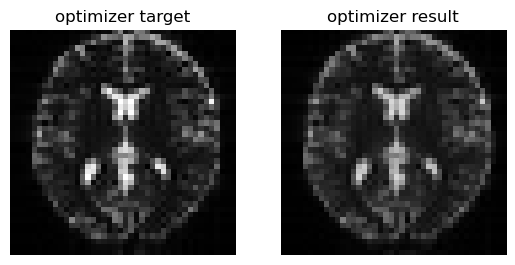

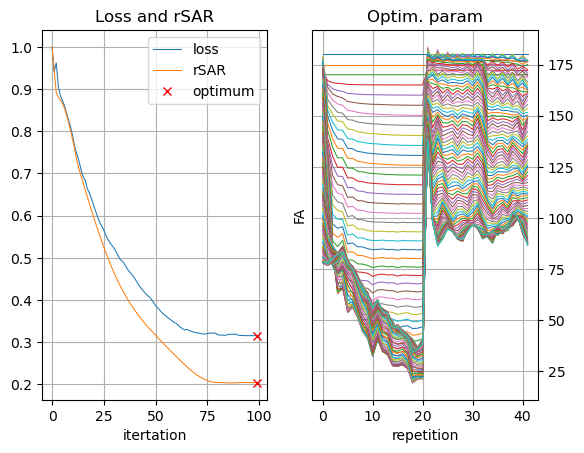

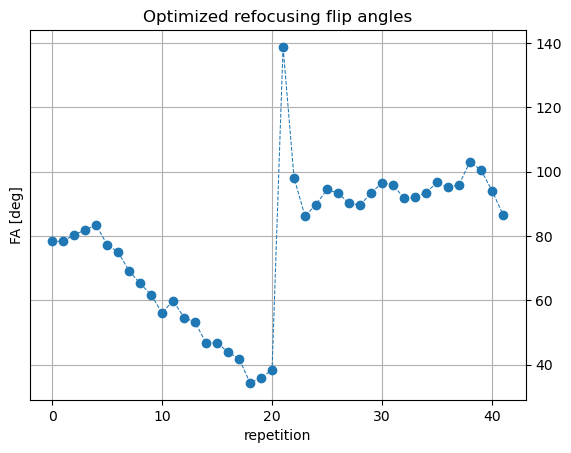

In [ ]:
# %% OPTIMIZE the refocusing flip angles

obj_p = make_obj_simulation(sz=sz,fov=fov,slice_thickness=slice_thickness,build=False)
target,Ref_FA_target = opt.generate_target_space(pp,sz)
iterations= 100
opt.perform_optimazation(obj_p, target, pp, Ref_FA_target,iterations,base_resolution,Ex_FA)